In [1]:
import scanpy as sc
import numpy as np
import torch
from ndreamer import NDreamer

/home/xx244/.conda/envs/benchmark/lib/python3.11/site-packages/anndata/compat/__init__.py:358: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  warn(
/home/xx244/.conda/envs/benchmark/lib/python3.11/site-packages/anndata/compat/__init__.py:358: FutureWarning: Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.
  warn(


AnnData object with n_obs × n_vars = 16893 × 6998
    obs: 'condition', 'n_counts', 'n_genes', 'mt_frac', 'cell_type'
    var: 'gene_symbol', 'n_cells'
    uns: 'cell_type_colors', 'condition_colors', 'neighbors'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    obsp: 'distances', 'connectivities'
  (0, 6)	3.206646203994751
  (0, 7)	0.9476891756057739
  (1, 6)	3.3140597343444824
  (2, 6)	2.344876527786255
  (3, 6)	2.292093276977539
  (4, 6)	2.430964708328247
  (5, 3)	0.29651933908462524
  (5, 6)	3.045463800430298
  (6, 6)	2.0396549701690674
  (7, 6)	3.98563814163208
  (8, 5)	0.5871325731277466
  (8, 6)	4.5311431884765625
  (9, 6)	2.4054837226867676


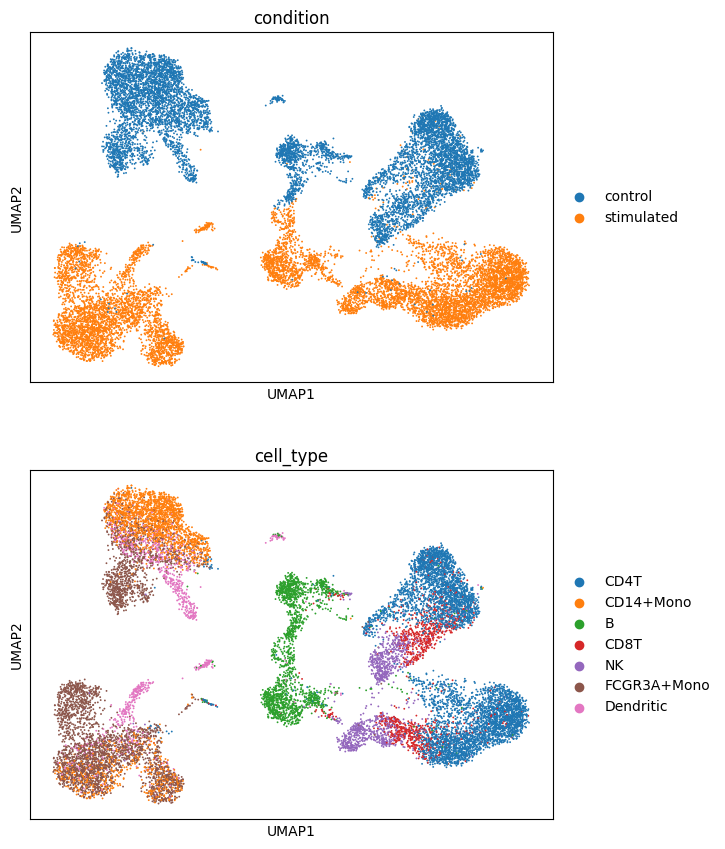

In [2]:
adata_raw = sc.read_h5ad('../data/PBMC.h5ad')
print(adata_raw)
print(adata_raw.X[:10,:10])

sc.pp.pca(adata_raw)
sc.pp.neighbors(adata_raw)
sc.tl.umap(adata_raw)
sc.pl.umap(adata_raw, color=["condition",'cell_type'],ncols=1)

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm

def plot_distribution_with_binary_zscore(vector, gene_name):
    """
    Plots the distribution of the values in the vector, calculates the z-score
    based on the proportion of values > 0 using CLT, and uses the gene name and z-score
    as the title of the plot.

    Args:
    - vector (numpy.ndarray or list): The input vector of values.
    - gene_name (str): The gene name to include in the title.

    Returns:
    - None: Displays the plot.
    """
    # Convert to numpy array if not already
    vector = np.array(vector)

    # Binary transformation: count the number of values > 0
    count_positive = np.sum(vector > 0)+0.5*np.sum(vector==0)
    n = len(vector)
    proportion_positive = count_positive / n  # Proportion of values > 0

    # Calculate z-score using the CLT
    p_null = 0.5  # Null hypothesis: Proportion of values > 0 is 0.5
    std_error = np.sqrt(p_null * (1 - p_null) / n)
    z_score = (proportion_positive - p_null) / std_error

    # Plot the distribution of the vector
    plt.figure(figsize=(8, 6))
    plt.hist(vector, bins=30, alpha=0.7, edgecolor='k', color='blue')
    plt.axvline(0, color='red', linestyle='--', label='Reference: 0')
    plt.title(f"{gene_name} | Z-score: {z_score:.2f} (Proportion > 0: {proportion_positive:.2f})", fontsize=14)
    plt.xlabel('Values')
    plt.ylabel('Frequency')
    plt.legend()
    plt.tight_layout()

    # Show the plot
    plt.show()

def plot_distribution(vector, bins=30, kde=True, title="Distribution Plot"):
    """
    Plots the distribution of a vector using a histogram and optionally overlays a KDE fitted line.

    Parameters:
    - vector (array-like): The input data vector.
    - bins (int): Number of bins for the histogram. Default is 30.
    - kde (bool): Whether to add a KDE fitted line. Default is True.
    - title (str): Title for the plot. Default is "Distribution Plot".
    """
    plt.figure(figsize=(8, 6))

    # Plot histogram and optionally the KDE
    sns.histplot(vector, bins=bins, kde=kde, color='blue', stat='density', edgecolor='black')

    # Add titles and labels
    plt.title(title, fontsize=14)
    plt.xlabel("Value", fontsize=12)
    plt.ylabel("Density", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)

    # Show the plot
    plt.tight_layout()
    plt.show()

def plot_distribution1(vector, bins=30, kde=True, title="Distribution Plot"):
    """
    Plots the distribution of a vector using a histogram and optionally overlays a KDE fitted line and a normal distribution.

    Parameters:
    - vector (array-like): The input data vector.
    - bins (int): Number of bins for the histogram. Default is 30.
    - kde (bool): Whether to add a KDE fitted line. Default is True.
    - title (str): Title for the plot. Default is "Distribution Plot".
    """
    plt.figure(figsize=(8, 6))

    # Plot histogram and optionally the KDE
    sns.histplot(vector, bins=bins, kde=kde, color='blue', stat='density', edgecolor='black')

    # Overlay the normal distribution curve
    mean, std = np.mean(vector), np.std(vector)
    x = np.linspace(min(vector), max(vector), 1000)
    plt.plot(x, norm.pdf(x, mean, std), color='red', label=f'Normal Dist. (μ={mean:.2f}, σ={std:.2f})')

    # Add titles, labels, and legend
    plt.title(title, fontsize=14)
    plt.xlabel("Value", fontsize=12)
    plt.ylabel("Density", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend(fontsize=12)

    # Show the plot
    plt.tight_layout()
    plt.show()

In [4]:
from scipy.stats import norm
from statsmodels.stats.multitest import multipletests

def zscores_to_adjusted_pvalues(z_scores, adjustment_method='fdr_bh'):
    """
    Convert z-scores to two-sided p-values and adjust them for multiple comparisons.

    Parameters:
        z_scores (array-like): Vector of z-scores.
        adjustment_method (str): Method for p-value adjustment. 
                                 Options include 'bonferroni', 'fdr_bh', etc.
                                 (default is 'fdr_bh').

    Returns:
        dict: A dictionary containing:
              - 'z_scores': The original z-scores.
              - 'p_values': The two-sided p-values.
              - 'adjusted_p_values': The adjusted p-values.
    """
    # Convert z-scores to two-sided p-values
    p_values = 2 * (1 - norm.cdf(np.abs(z_scores)))
    p_values = np.nan_to_num(p_values, nan=0)
    # Adjust p-values for multiple comparisons
    adjusted_p_values = multipletests(p_values, method=adjustment_method)[1]
    
    return adjusted_p_values

In [5]:
import pandas as pd
def Plot_and_Estimate_CATE_adata(
    adata,
    indices,
    genes=None,
    topk=5,
    plot=True,
    parametric=False
):
    # Subset the ITE matrix using the selected indices
    ITE_subset = adata.X[indices, :]

    # Initialize z-scores for genes
    z_scores = []

    # Calculate z-scores for each gene (column in the ITE matrix)
    for gene_idx in range(ITE_subset.shape[1]):
        gene_ite = ITE_subset[:, gene_idx]
        # Test if ITE > 0 using non-parametric test (binomial distribution assumption)
        n = len(gene_ite)
        successes = np.sum(gene_ite > 0) + 0.5*np.sum(gene_ite==0)
        # z-score for binomial test
        z_score = (successes - n * 0.5) / np.sqrt(n * 0.25)
        z_scores.append(z_score)
    
    if parametric:
        z_scores = []
        for gene_idx in range(ITE_subset.shape[1]):
            gene_ite = ITE_subset[:, gene_idx]
            # Test if ITE > 0 using non-parametric test (binomial distribution assumption)
            n = len(gene_ite)
            # z-score for binomial test
            z_score = np.mean(gene_ite)/np.std(gene_ite, ddof=1)*np.sqrt(n)
            z_scores.append(z_score)
    
    # Select top-k significant genes if `genes` is not provided
    z_scores = np.array(z_scores)
    #plot_distribution(z_scores)
    p_adjs=zscores_to_adjusted_pvalues(z_scores)
    #plot_distribution(2 * (1 - norm.cdf(np.abs(z_scores))))
    if genes is None:
        # Get indices of top-k absolute z-scores
        topk_indices = np.argsort(-np.abs(z_scores))[:topk]
        genes = adata.var_names[topk_indices]

    print("Number of genes with ITE adjusted p-values less than 0.01",np.sum(p_adjs<0.01))
    
    # Print the selected most significant genes
    print("Selected most significant genes:")
    genes=genes.tolist()

    df=pd.DataFrame({"Gene":genes, "Z score":np.array([z_scores[adata.var_names.tolist().index(gene)] for gene in genes]),
                    "Adjusted_p":np.array([p_adjs[adata.var_names.tolist().index(gene)] for gene in genes])})
    print(df)

    if plot:
        # Plot the distribution of ITE values for the selected genes
        plt.figure(figsize=(10, 6))
        for gene in genes:
            print("Plotting:", gene)
            print("adjusted p-value:",p_adjs[adata.var_names.tolist().index(gene)])
            gene_idx = np.where(adata.var_names == gene)[0][0]
            ite_values = ITE_subset[:, gene_idx]

            plot_distribution_with_binary_zscore(vector=ite_values, gene_name=gene)
            sc.pl.umap(adata_raw, color=gene,ncols=1)

    # Return only the z-score
    return z_scores

# For real dataset

Number of genes with ITE adjusted p-values less than 0.01 25
Selected most significant genes:
    Gene    Z score  Adjusted_p
0  ISG15 -22.743486         0.0
1  IFIT1 -19.862931         0.0
2  IFIT3 -19.475991         0.0
3   SAT1 -13.757875         0.0
4  IFIT2 -13.628894         0.0
Plotting: ISG15
adjusted p-value: 0.0


<Figure size 1000x600 with 0 Axes>

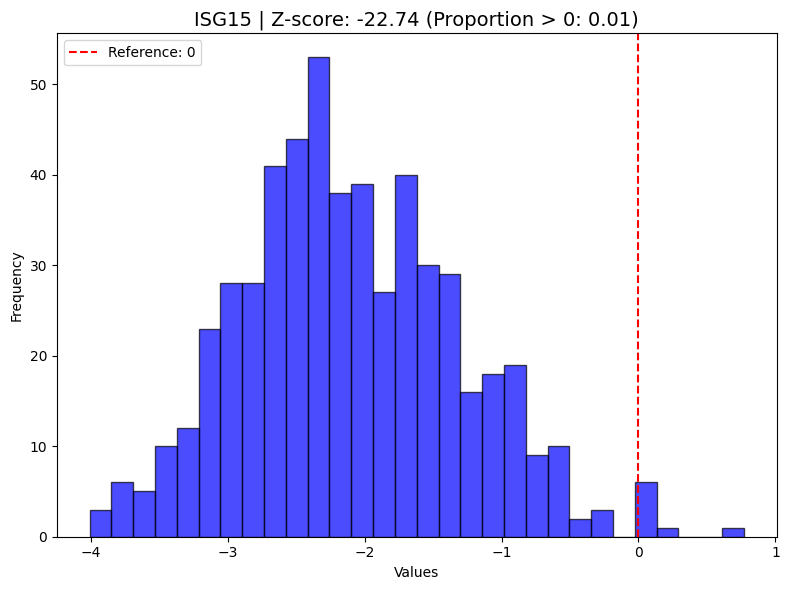

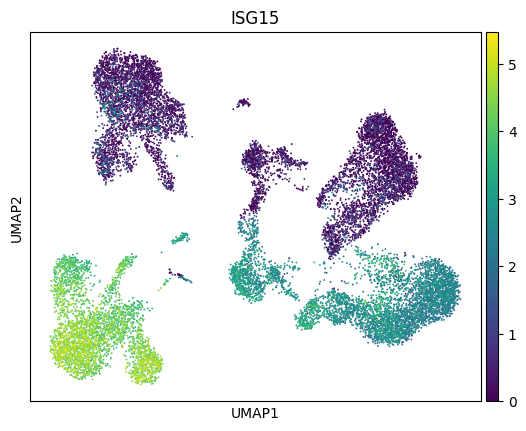

Plotting: IFIT1
adjusted p-value: 0.0


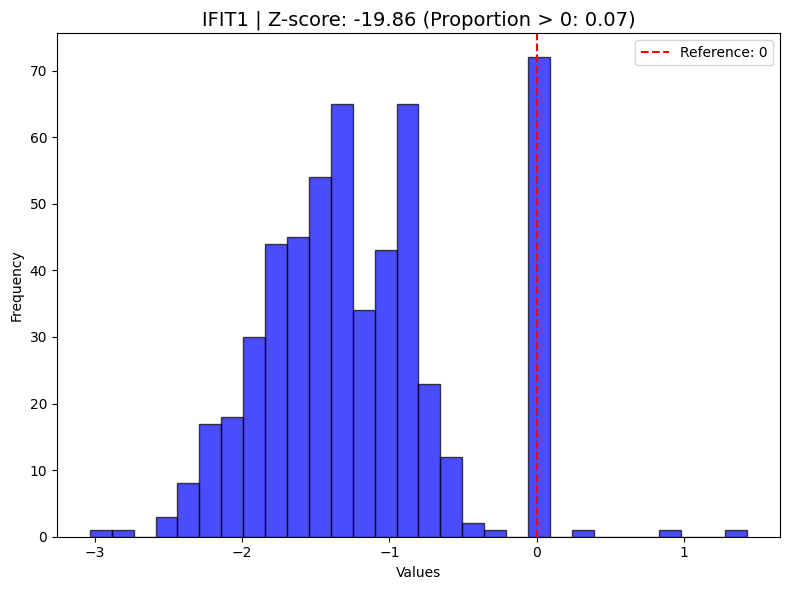

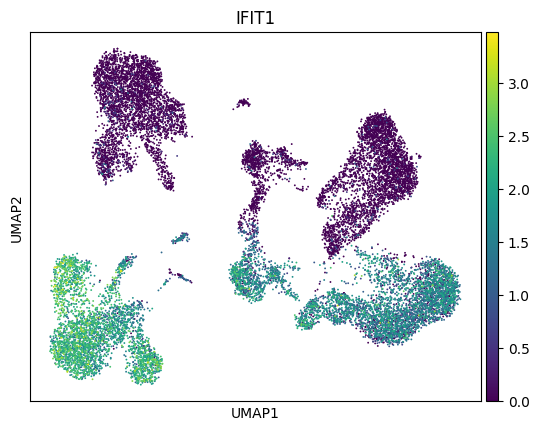

Plotting: IFIT3
adjusted p-value: 0.0


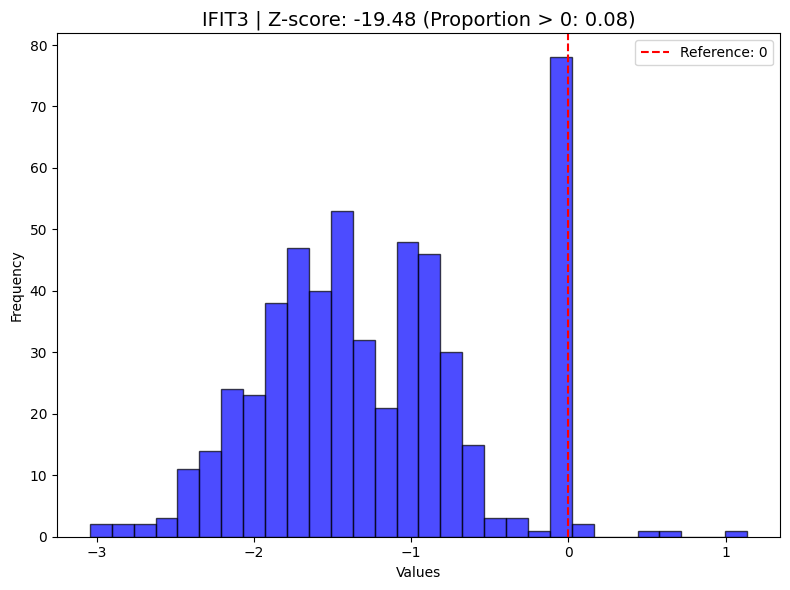

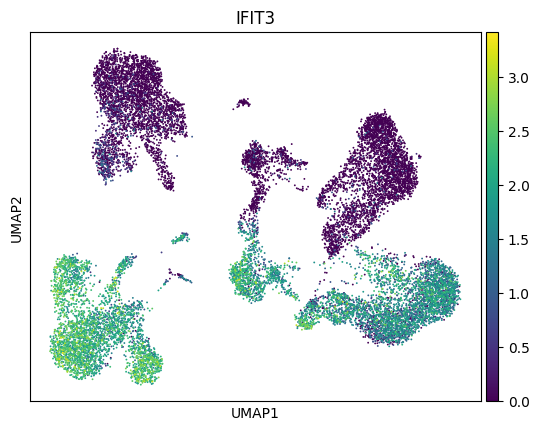

Plotting: SAT1
adjusted p-value: 0.0


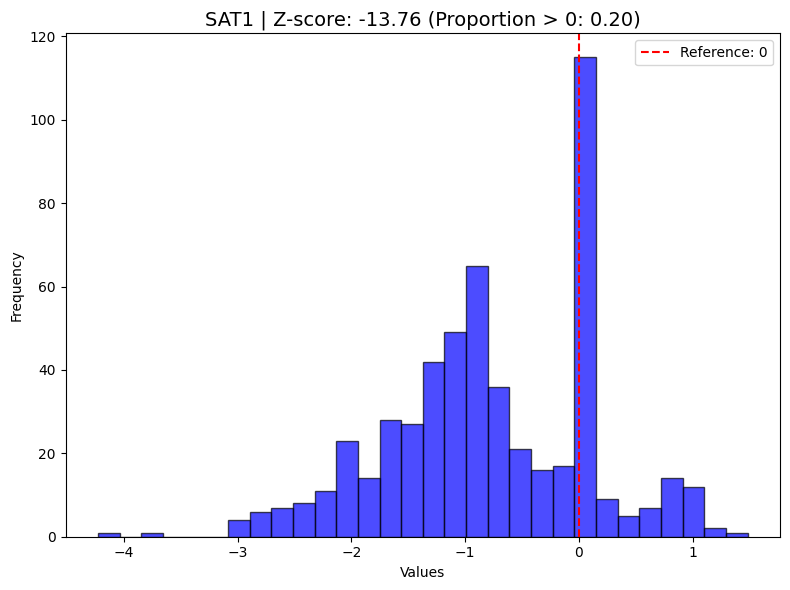

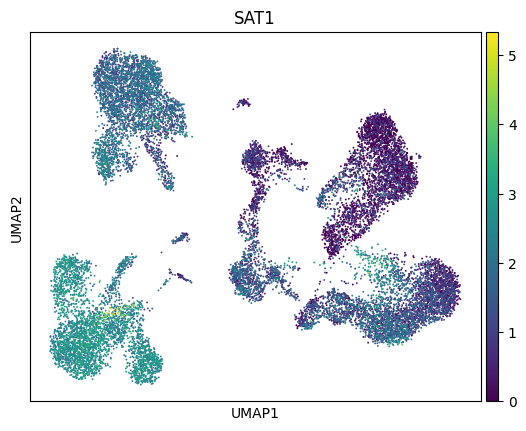

Plotting: IFIT2
adjusted p-value: 0.0


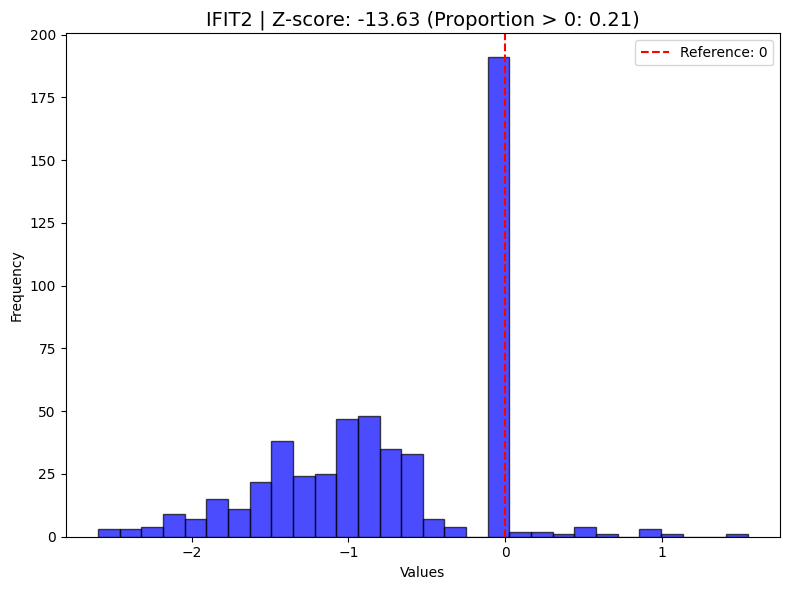

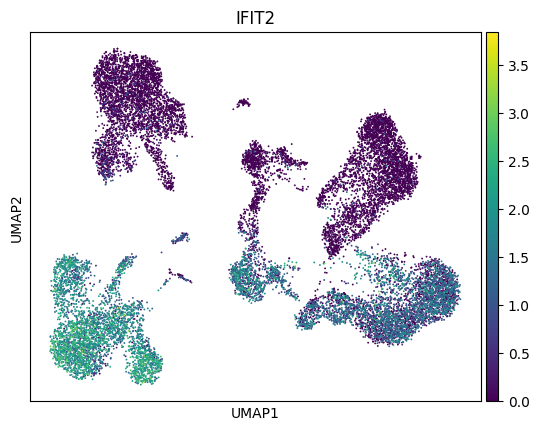

Number of genes with ITE adjusted p-values less than 0.01 369
Selected most significant genes:
    Gene    Z score  Adjusted_p
0  ISG15 -61.143287         0.0
1  IFIT1 -42.126553         0.0
2  IFIT3 -39.520509         0.0
3  IFIT2 -23.374593         0.0
4  RSAD2 -22.132209         0.0
Plotting: ISG15
adjusted p-value: 0.0


/tmp/ipykernel_3614644/2615280974.py:33: RuntimeWarning: invalid value encountered in scalar divide
  z_score = np.mean(gene_ite)/np.std(gene_ite, ddof=1)*np.sqrt(n)


<Figure size 1000x600 with 0 Axes>

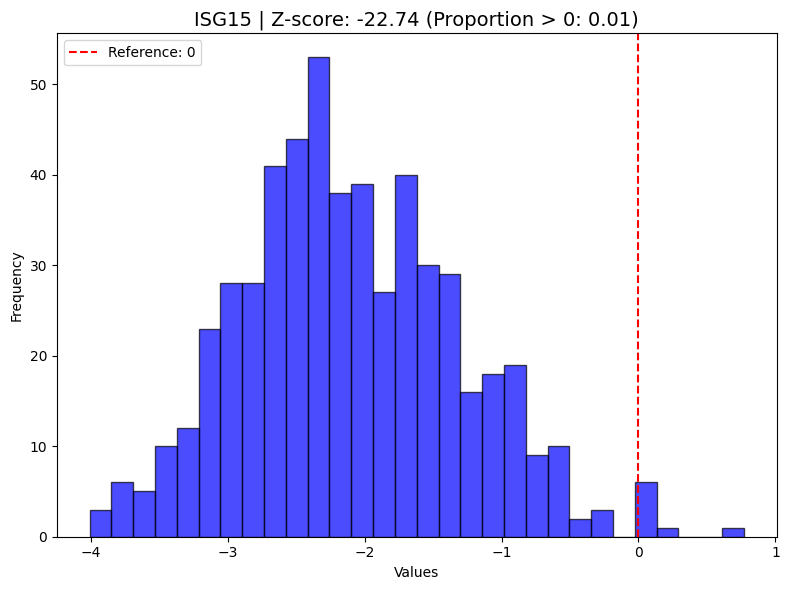

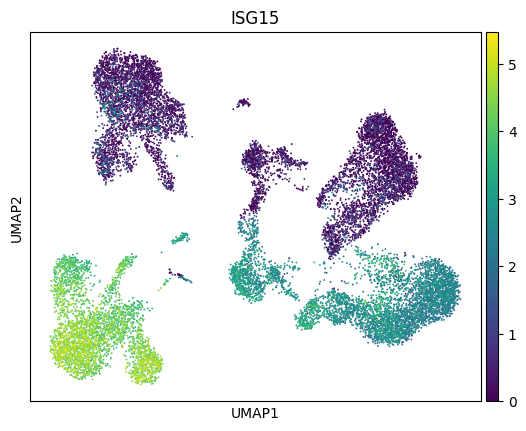

Plotting: IFIT1
adjusted p-value: 0.0


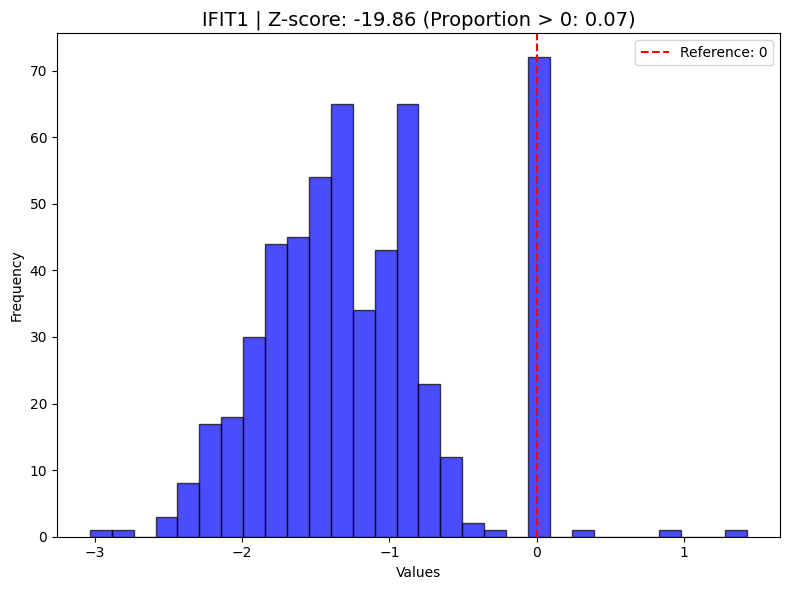

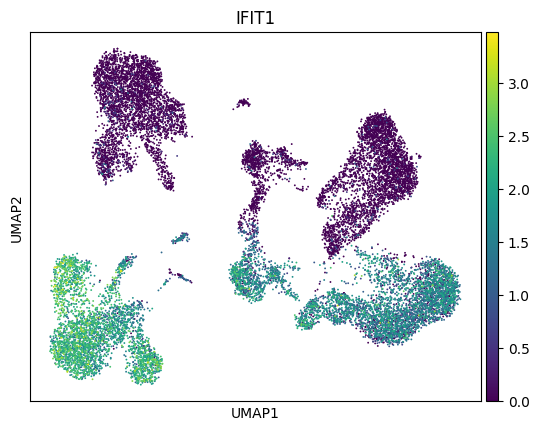

Plotting: IFIT3
adjusted p-value: 0.0


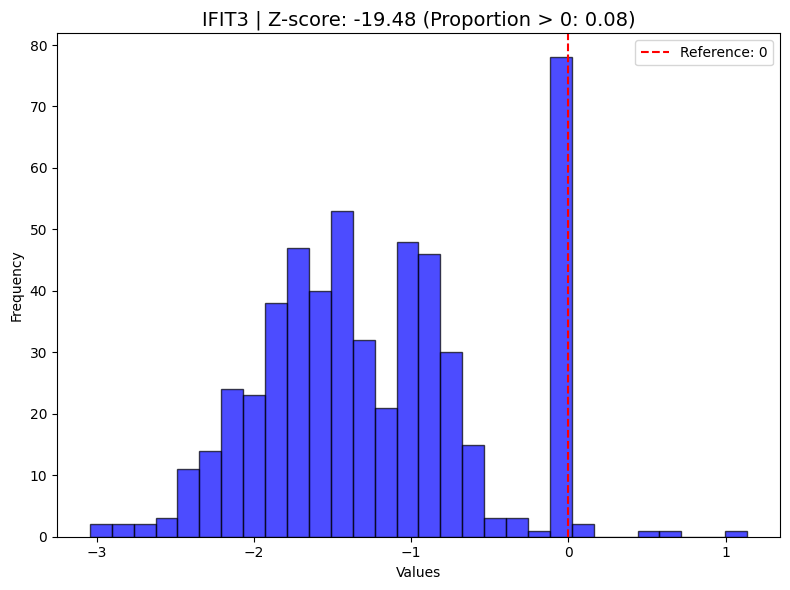

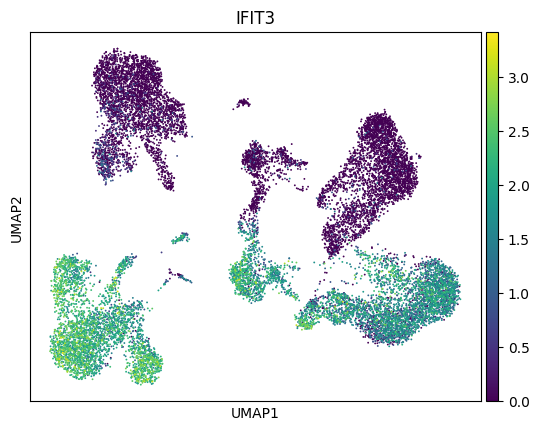

Plotting: IFIT2
adjusted p-value: 0.0


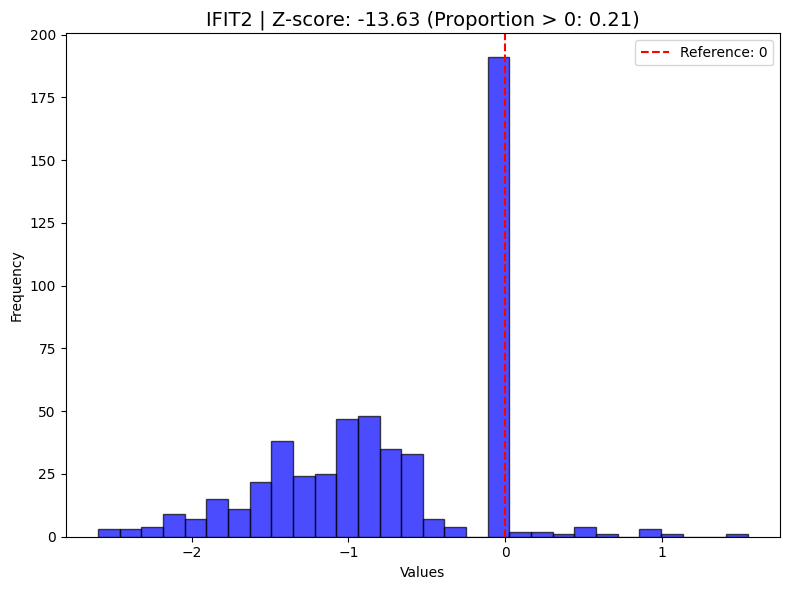

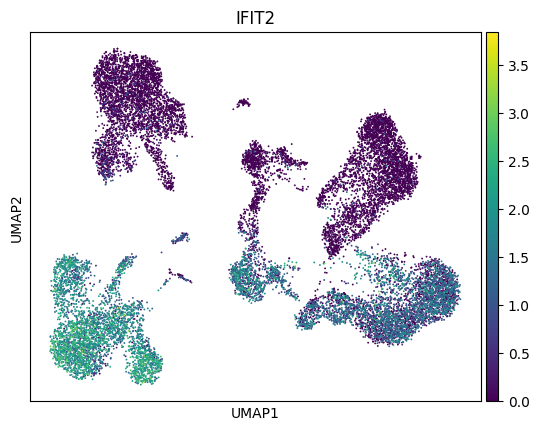

Plotting: RSAD2
adjusted p-value: 0.0


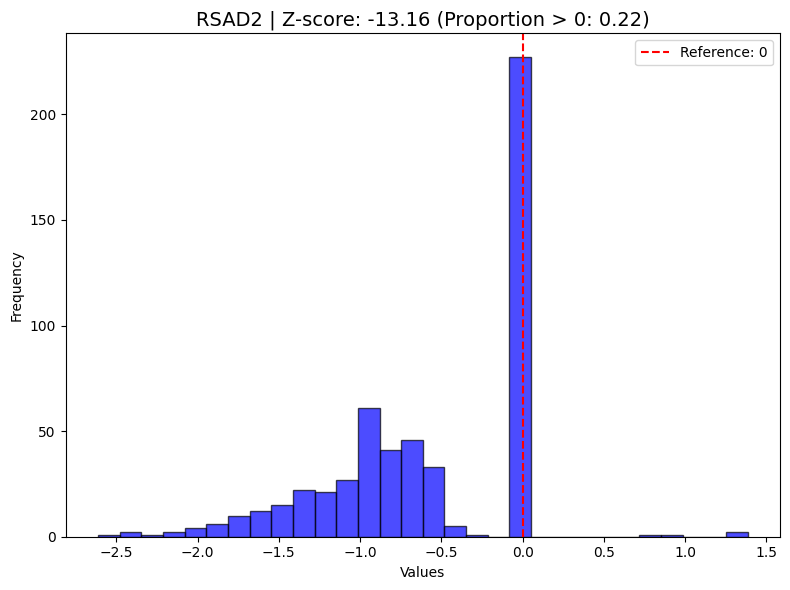

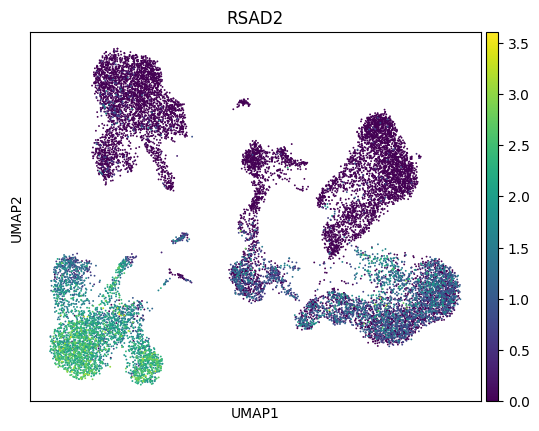

array([  1.05745118,  -2.65694413, -61.14328654, ...,   0.644476  ,
        -1.36507102,   1.10392469])

In [6]:
adata=sc.read_h5ad("./PBMC/b-0--c-1__ITE.h5ad")
indices=adata.obs["cell_type"]=="CD8T"
Plot_and_Estimate_CATE_adata(adata,indices)
print("="*20)
Plot_and_Estimate_CATE_adata(adata,indices,parametric=True)

# For the random permutation

Number of genes with ITE adjusted p-values less than 0.01 2
Selected most significant genes:
        Gene   Z score  Adjusted_p
0       CCL5 -4.788491    0.003361
1       CD8A -4.461073    0.008155
2       CST7 -4.092728    0.028422
3       GZMH -3.356037    0.395341
4       LAG3 -3.274182    0.423873
5      PLAC8  2.823982    1.000000
6      CLIC3  2.783055    1.000000
7       NKG7 -2.660273    1.000000
8      DUSP2 -2.619346    1.000000
9   APOBEC3G -2.619346    1.000000
10     YIPF5  2.537491    1.000000
11      GZMK -2.455637    1.000000
12     TIMP1  2.332855    1.000000
13      CD8B -2.332855    1.000000
14     TSTD1  2.210073    1.000000
15      NHP2  2.210073    1.000000
16     ISG15  2.210073    1.000000
17     RWDD1  2.169146    1.000000
18     S1PR4  2.169146    1.000000
19      GNLY  2.169146    1.000000
Plotting: CCL5
adjusted p-value: 0.003360798149554256


<Figure size 1000x600 with 0 Axes>

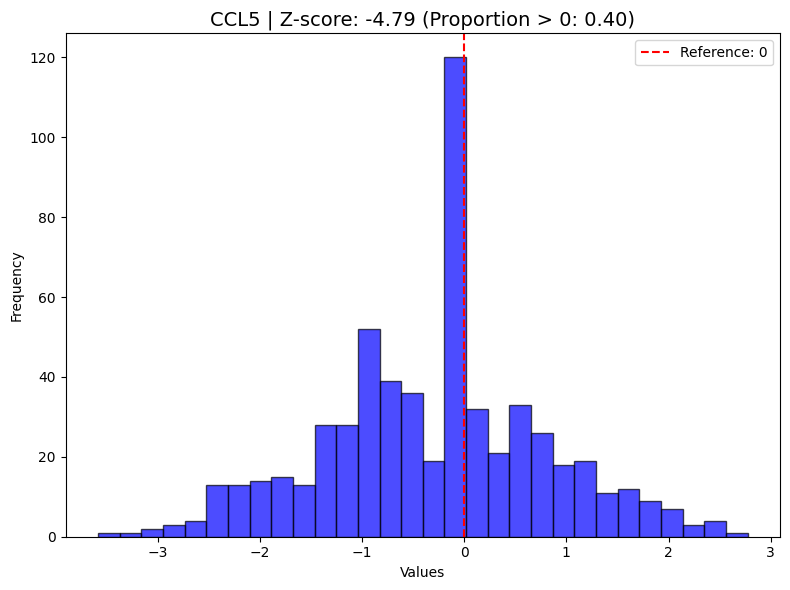

Plotting: CD8A
adjusted p-value: 0.008155029355361165


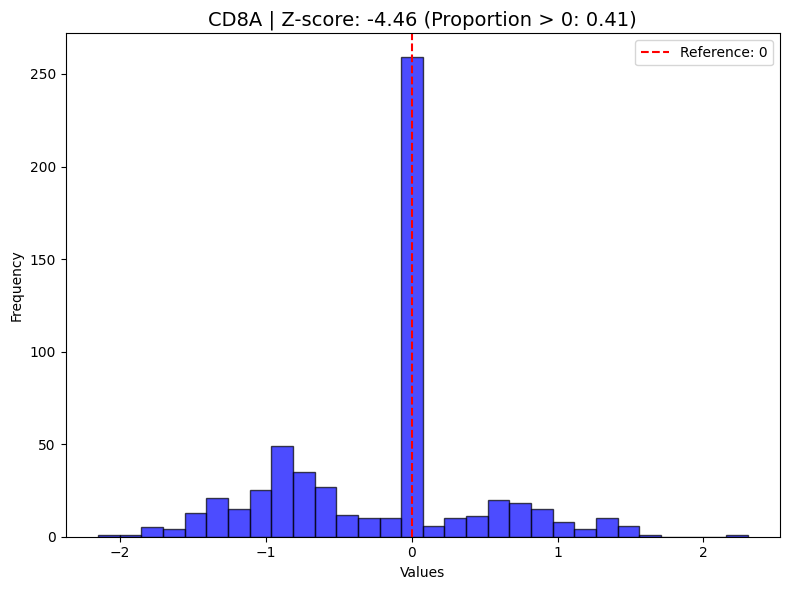

Plotting: CST7
adjusted p-value: 0.02842190295811638


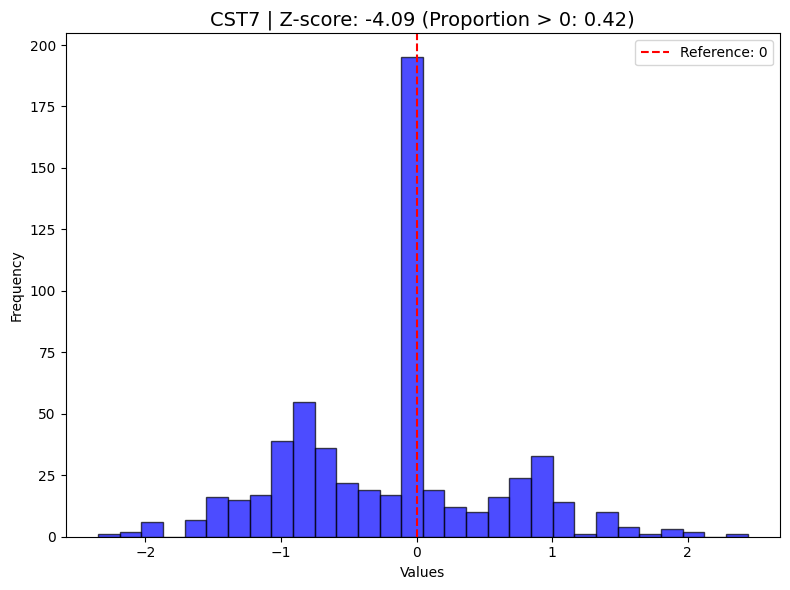

Plotting: GZMH
adjusted p-value: 0.39534053918066636


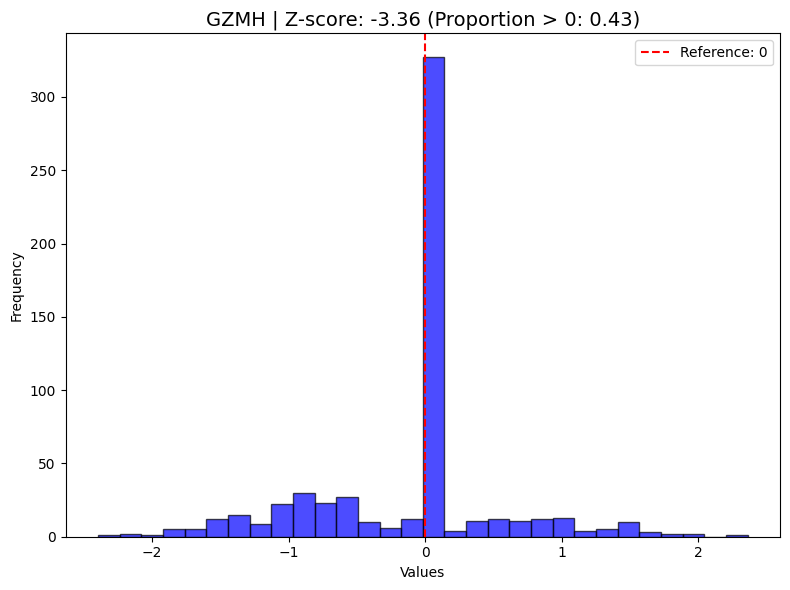

Plotting: LAG3
adjusted p-value: 0.4238732892049235


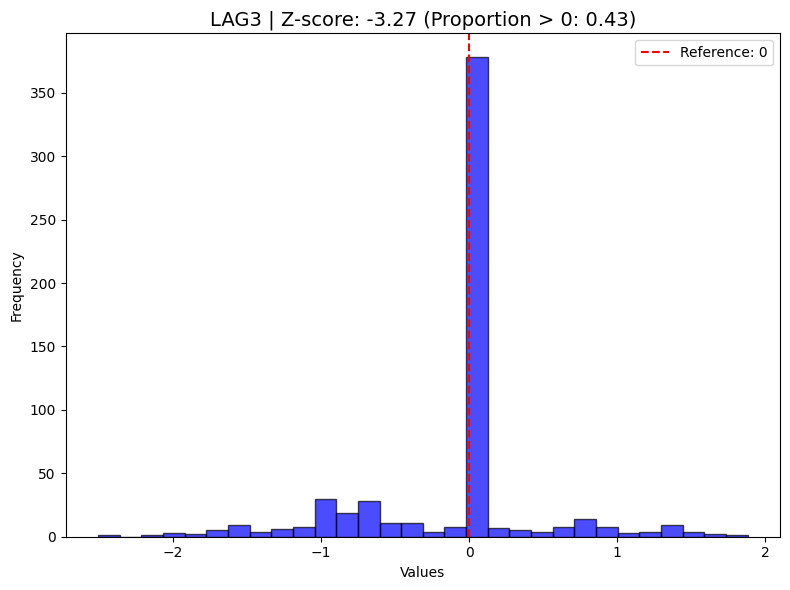

Plotting: PLAC8
adjusted p-value: 1.0


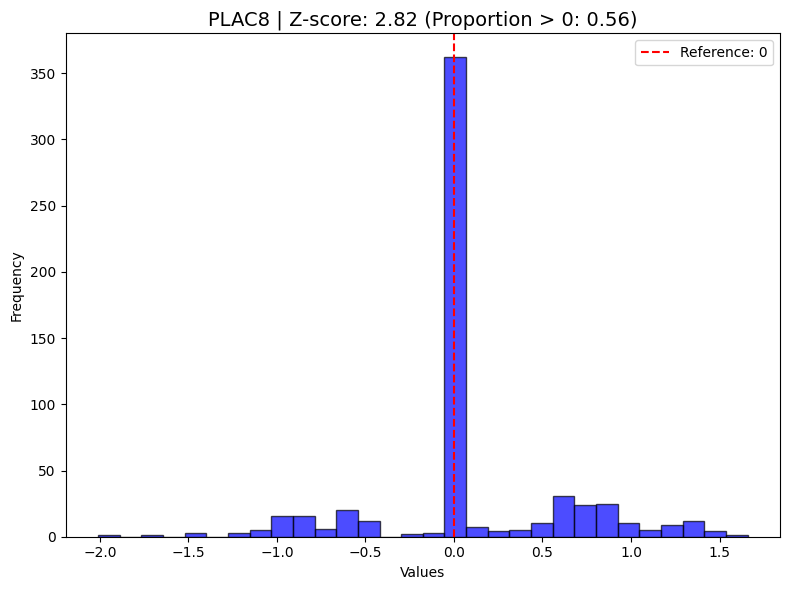

Plotting: CLIC3
adjusted p-value: 1.0


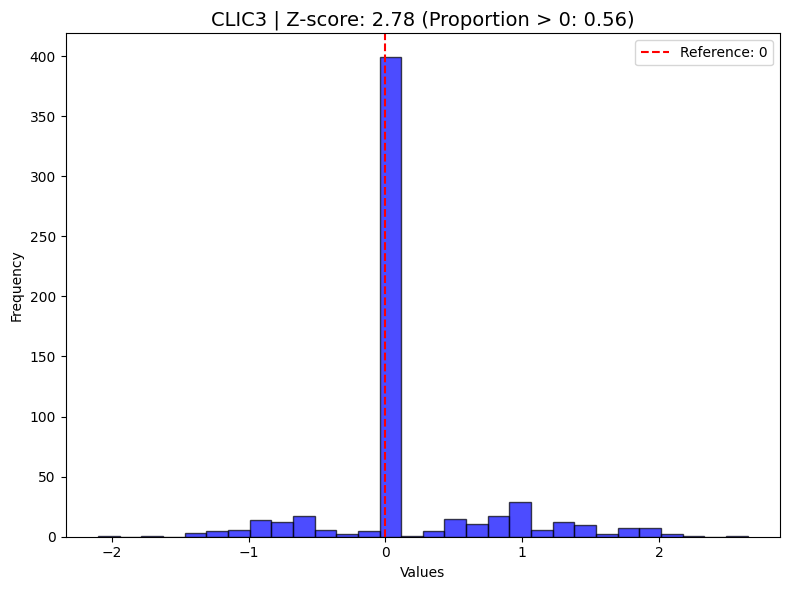

Plotting: NKG7
adjusted p-value: 1.0


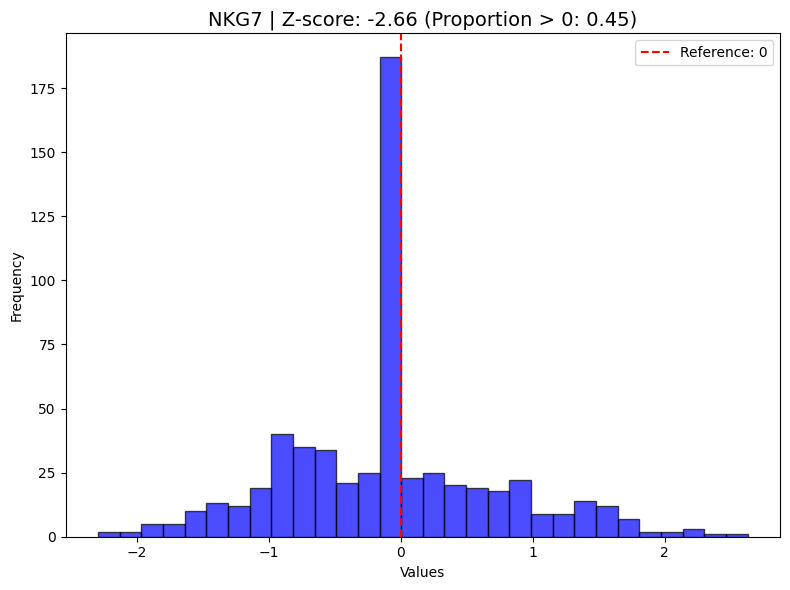

Plotting: DUSP2
adjusted p-value: 1.0


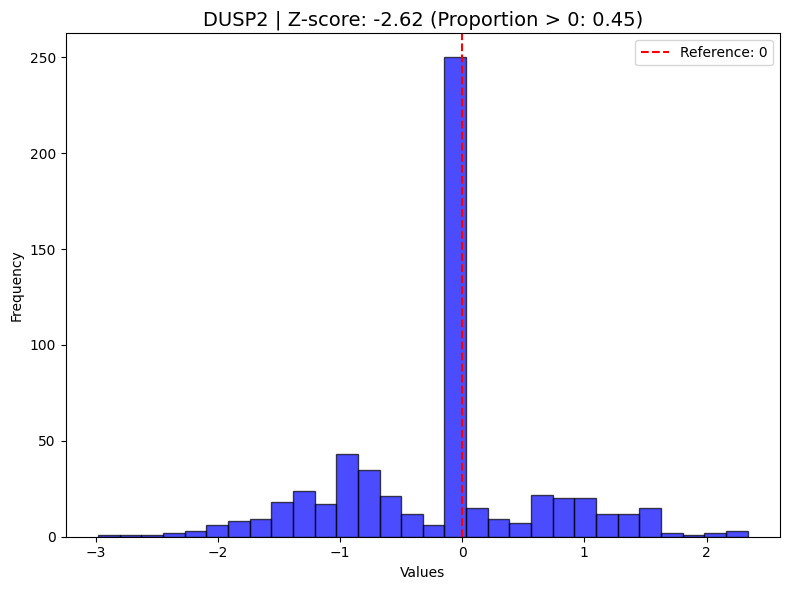

Plotting: APOBEC3G
adjusted p-value: 1.0


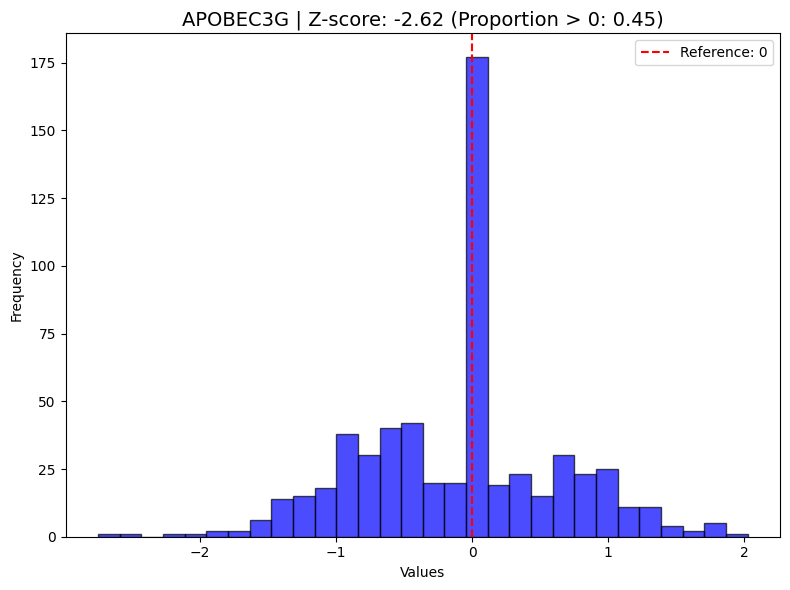

Plotting: YIPF5
adjusted p-value: 1.0


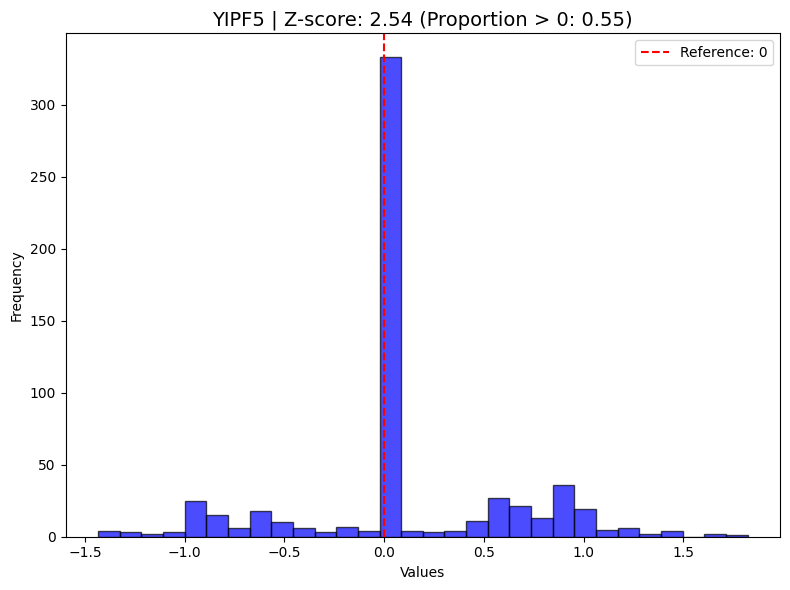

Plotting: GZMK
adjusted p-value: 1.0


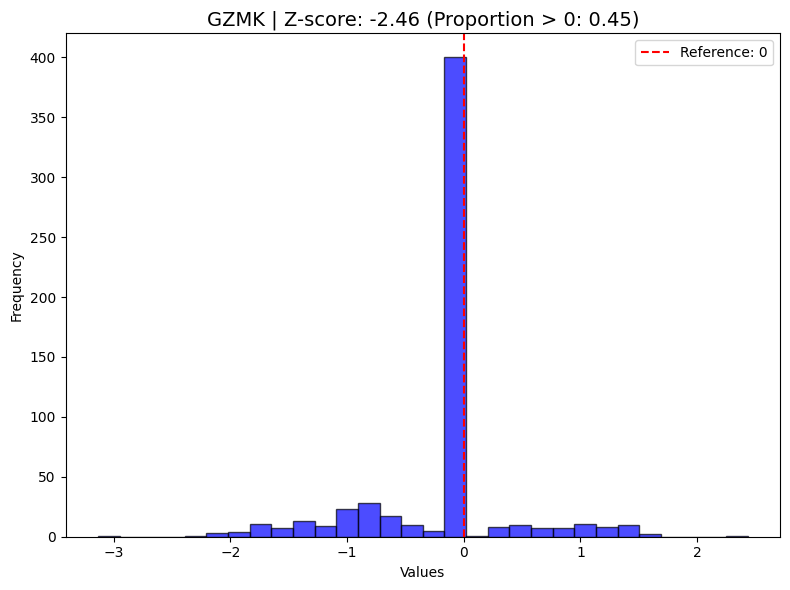

Plotting: TIMP1
adjusted p-value: 1.0


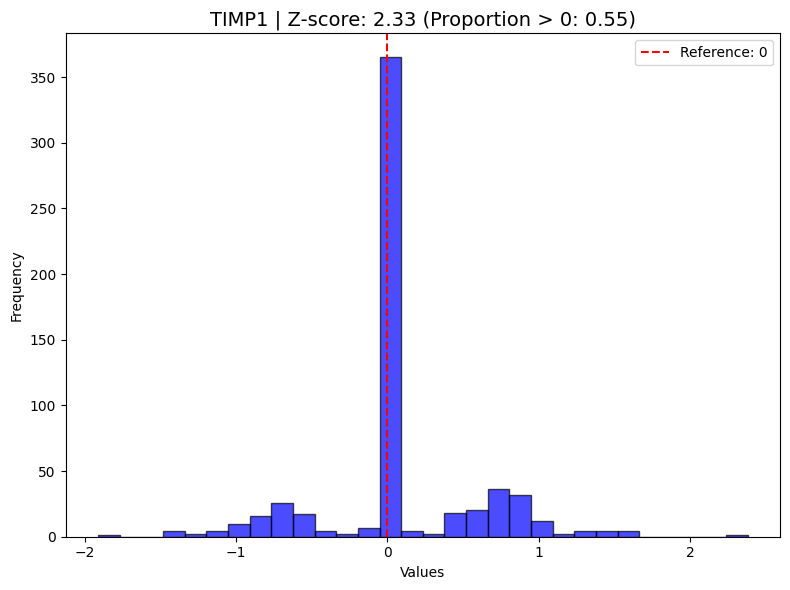

Plotting: CD8B
adjusted p-value: 1.0


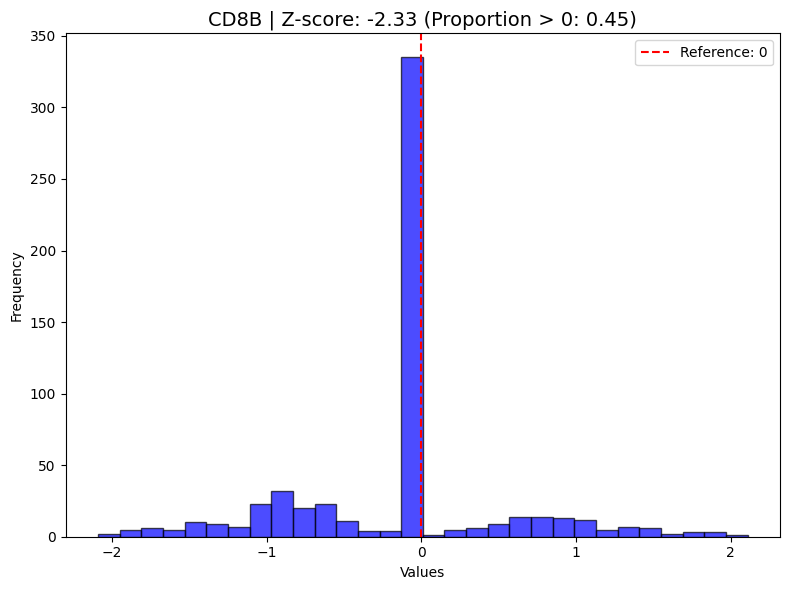

Plotting: TSTD1
adjusted p-value: 1.0


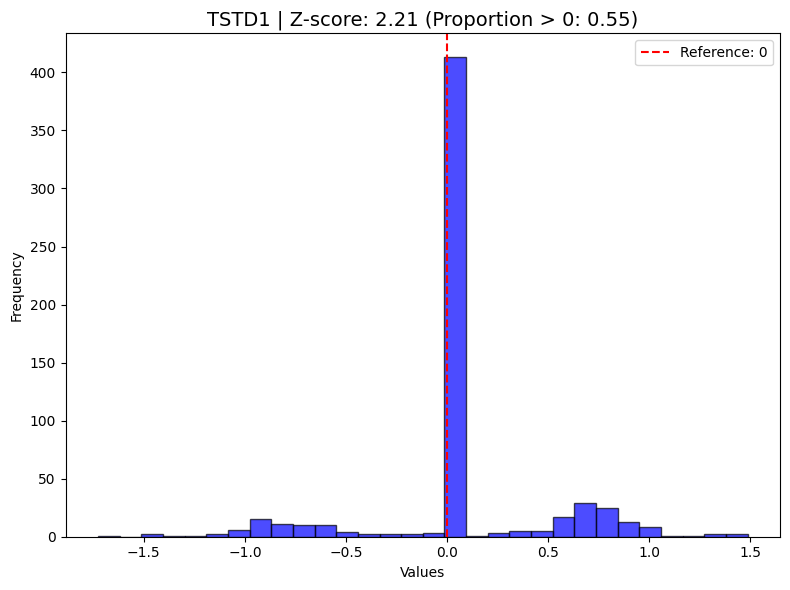

Plotting: NHP2
adjusted p-value: 1.0


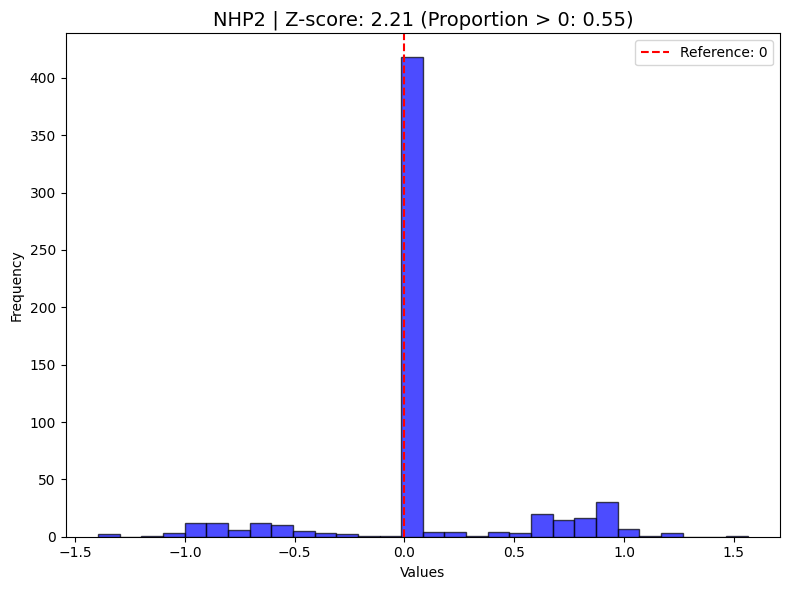

Plotting: ISG15
adjusted p-value: 1.0


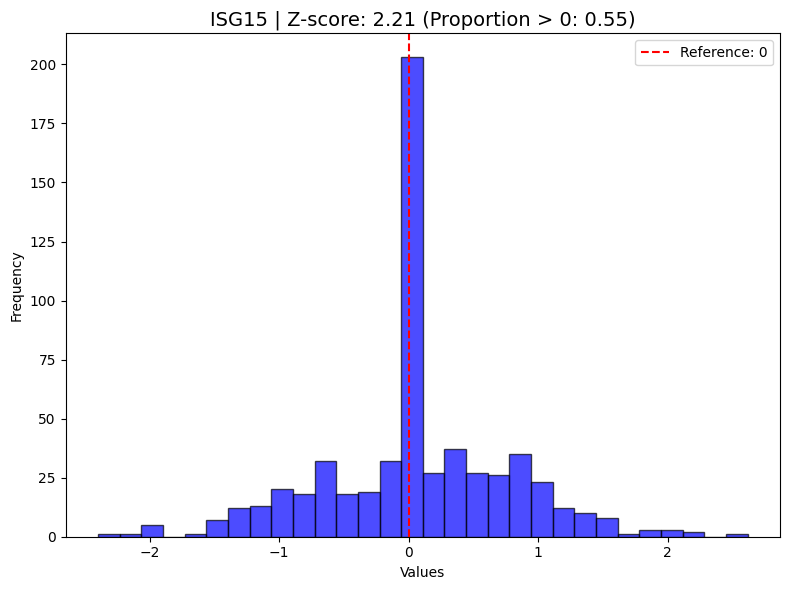

Plotting: RWDD1
adjusted p-value: 1.0


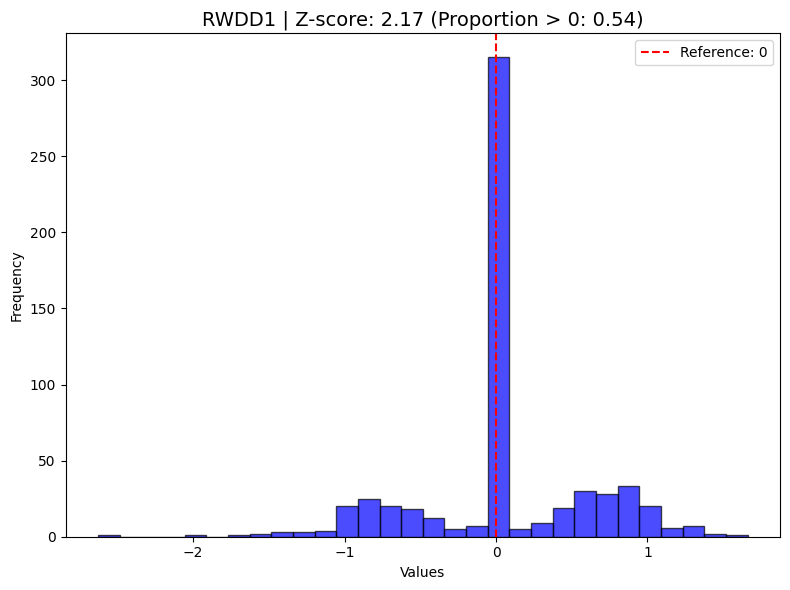

Plotting: S1PR4
adjusted p-value: 1.0


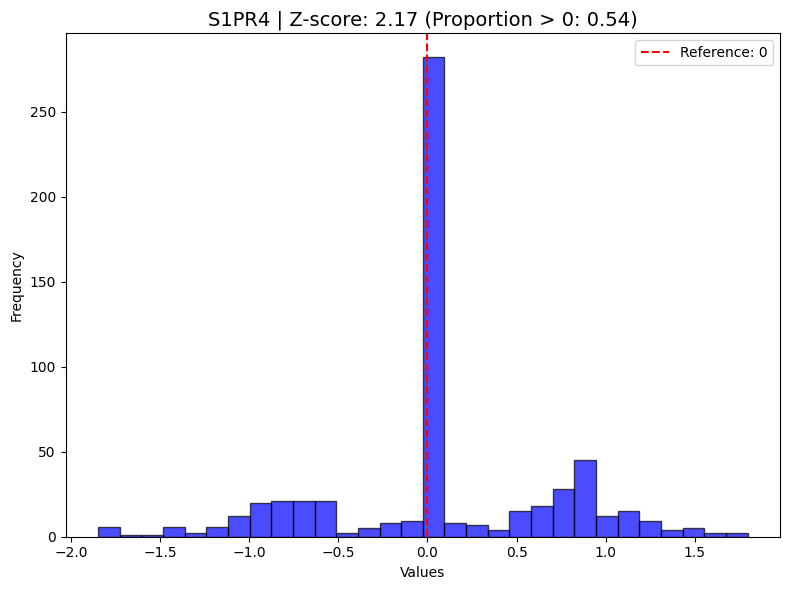

Plotting: GNLY
adjusted p-value: 1.0


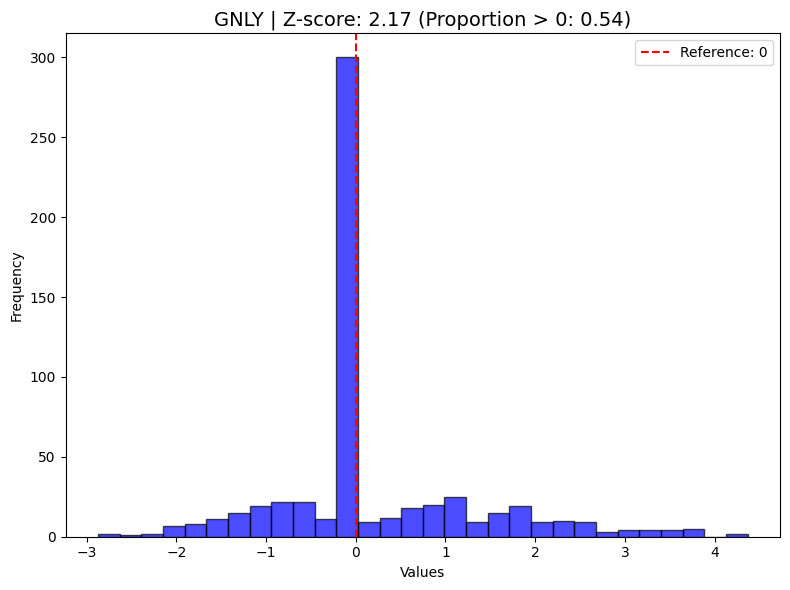

Number of genes with ITE adjusted p-values less than 0.01 264
Selected most significant genes:
        Gene   Z score    Adjusted_p
0     HIGD1B       inf  0.000000e+00
1        CLC       inf  0.000000e+00
2       CD8A -7.064807  1.380679e-11
3       CCL5 -6.196027  4.949245e-09
4     IGFBP7  5.713043  9.444564e-08
5       CST7 -5.518602  2.895825e-07
6      CLIC3  5.351860  7.346391e-07
7       GZMK -5.229119  1.431256e-06
8       GNLY  5.216148  1.528719e-06
9       LAG3 -5.110869  2.672330e-06
10      GZMH -4.830945  1.127691e-05
11     GPR97  4.770299  1.520268e-05
12     DUSP2 -4.573228  3.952812e-05
13      CD38  4.520319  5.061181e-05
14     CCND2 -4.072713  3.793363e-04
15    SH2D1B  4.009105  4.955239e-04
16      MATK  3.995695  5.223057e-04
17       HN1 -3.965288  5.911876e-04
18  TNFRSF18  3.927914  6.882400e-04
19      CD8B -3.891927  7.956108e-04
Plotting: HIGD1B
adjusted p-value: 0.0


/tmp/ipykernel_3606102/2723383086.py:33: RuntimeWarning: invalid value encountered in scalar divide
  z_score = np.mean(gene_ite)/np.std(gene_ite, ddof=1)*np.sqrt(n)
/tmp/ipykernel_3606102/2723383086.py:33: RuntimeWarning: divide by zero encountered in scalar divide
  z_score = np.mean(gene_ite)/np.std(gene_ite, ddof=1)*np.sqrt(n)


<Figure size 1000x600 with 0 Axes>

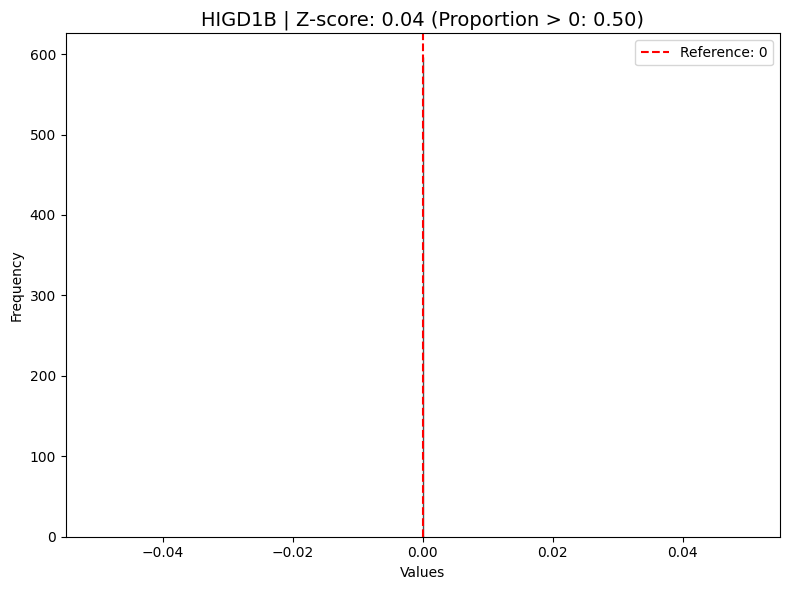

Plotting: CLC
adjusted p-value: 0.0


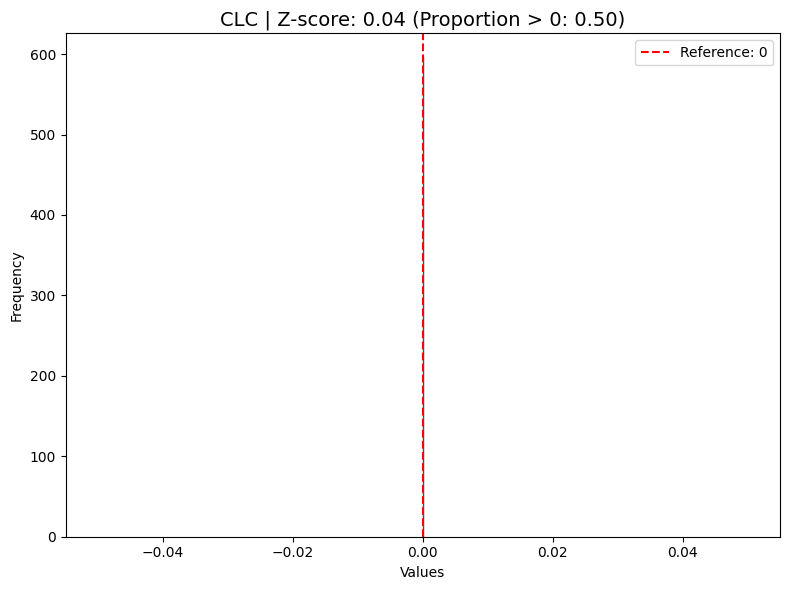

Plotting: CD8A
adjusted p-value: 1.3806790713106666e-11


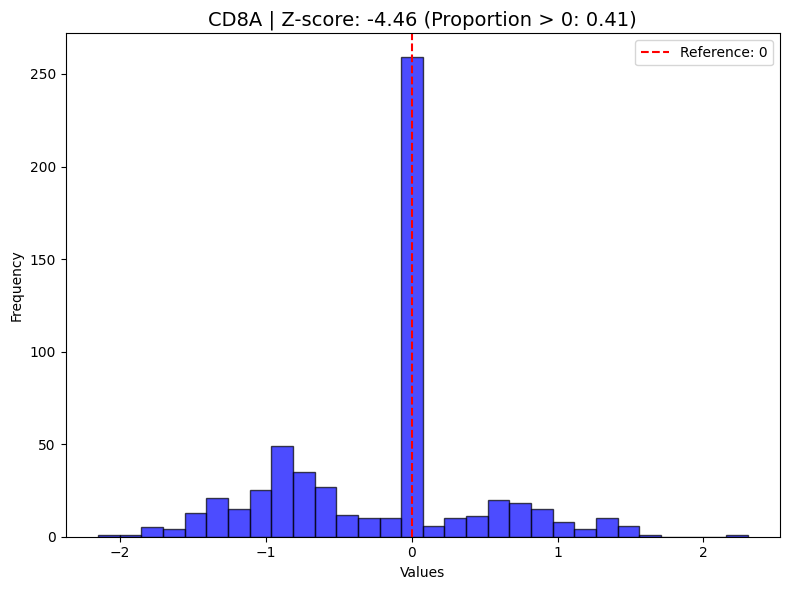

Plotting: CCL5
adjusted p-value: 4.949245192213692e-09


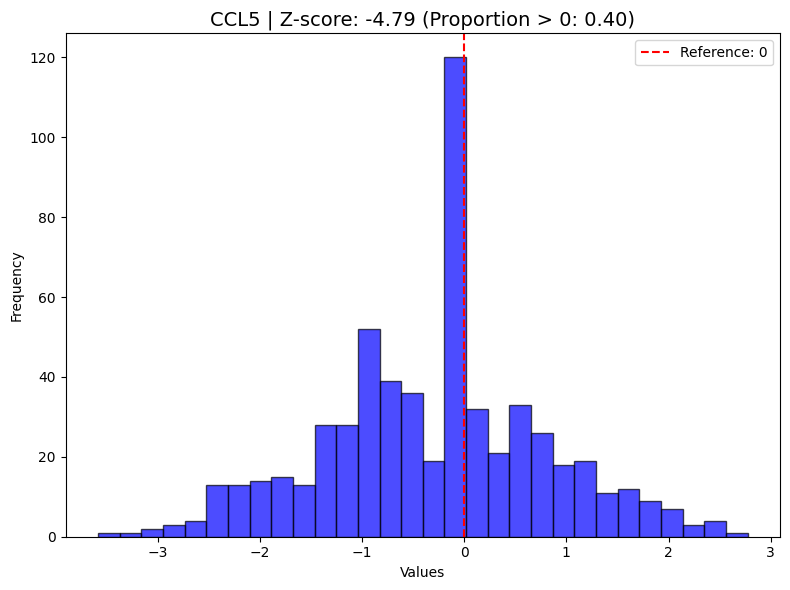

Plotting: IGFBP7
adjusted p-value: 9.444563712661953e-08


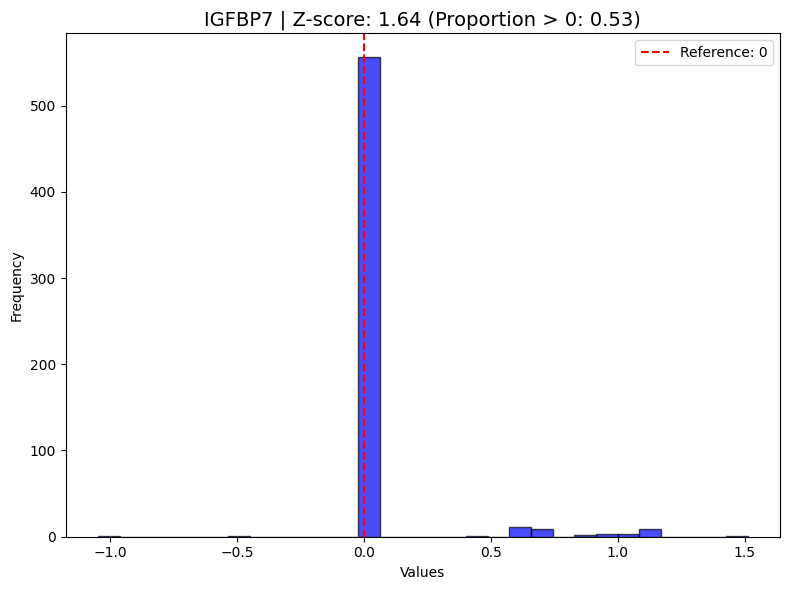

Plotting: CST7
adjusted p-value: 2.895824935776873e-07


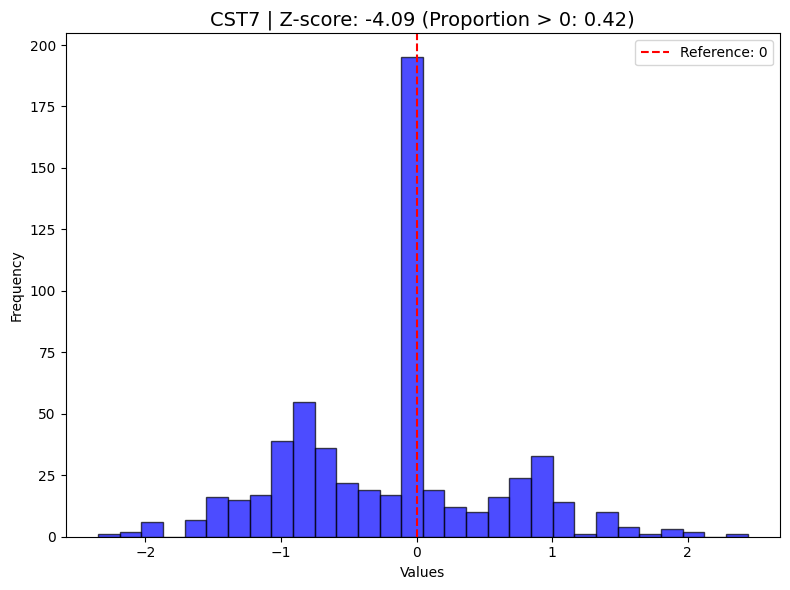

Plotting: CLIC3
adjusted p-value: 7.346391249666244e-07


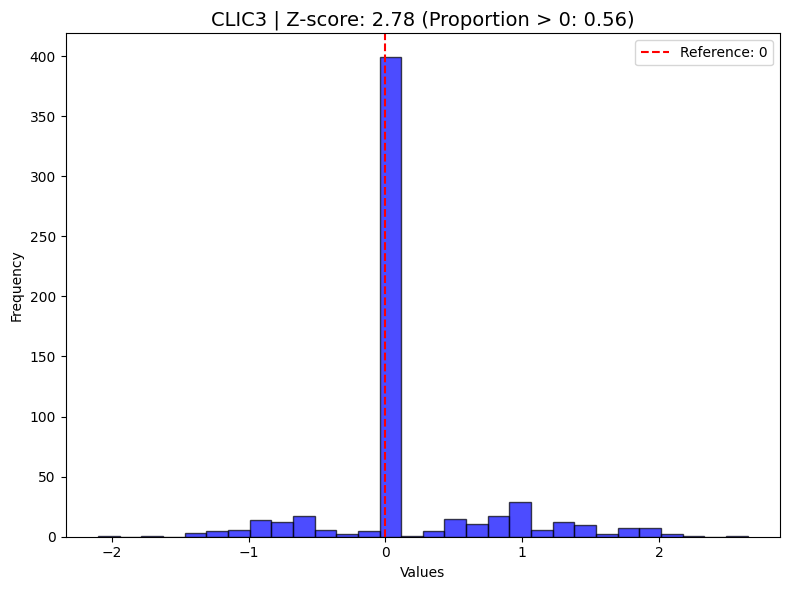

Plotting: GZMK
adjusted p-value: 1.4312564224364228e-06


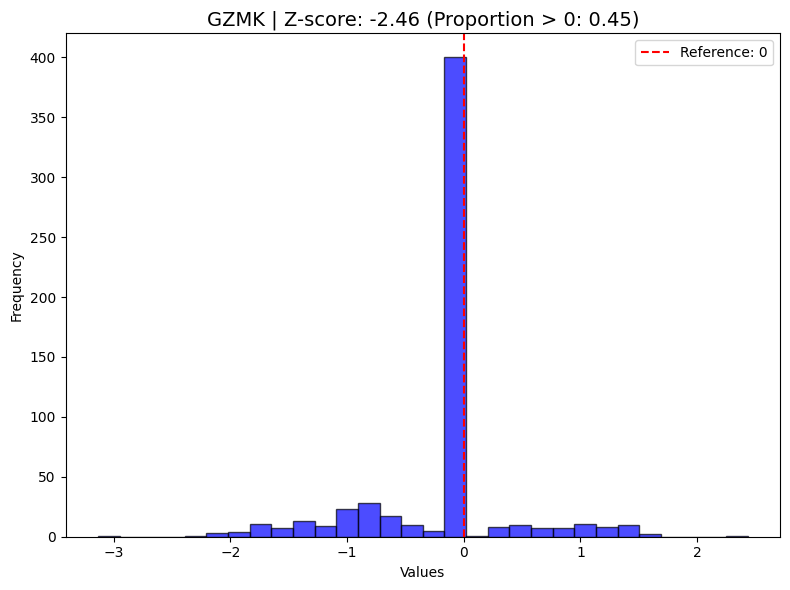

Plotting: GNLY
adjusted p-value: 1.528718858614024e-06


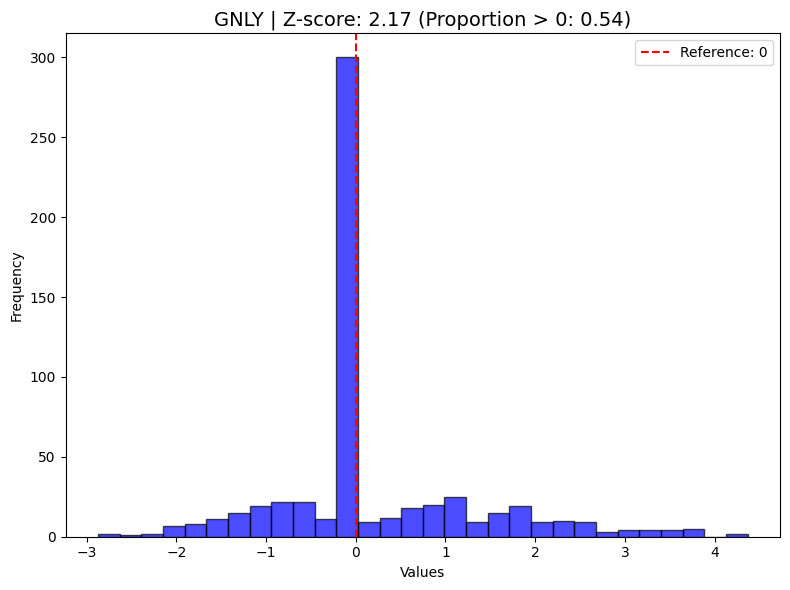

Plotting: LAG3
adjusted p-value: 2.67232965941074e-06


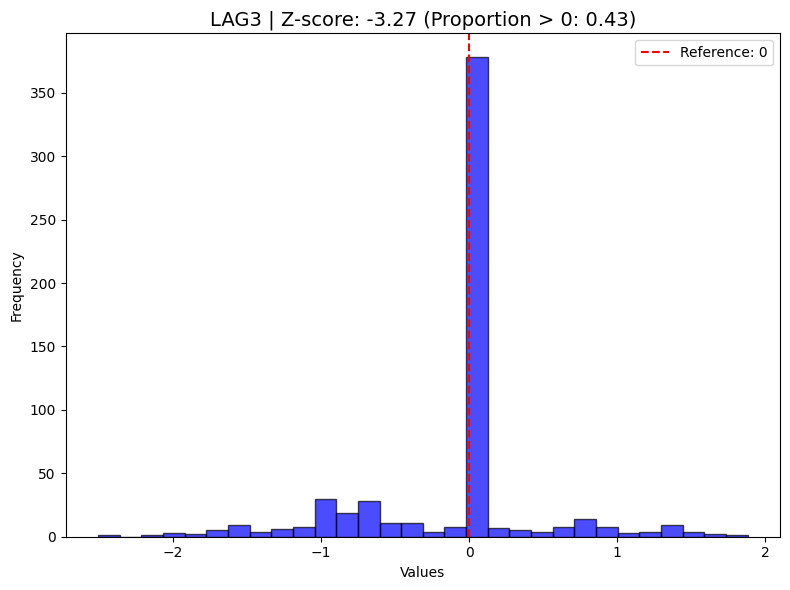

Plotting: GZMH
adjusted p-value: 1.127690703196603e-05


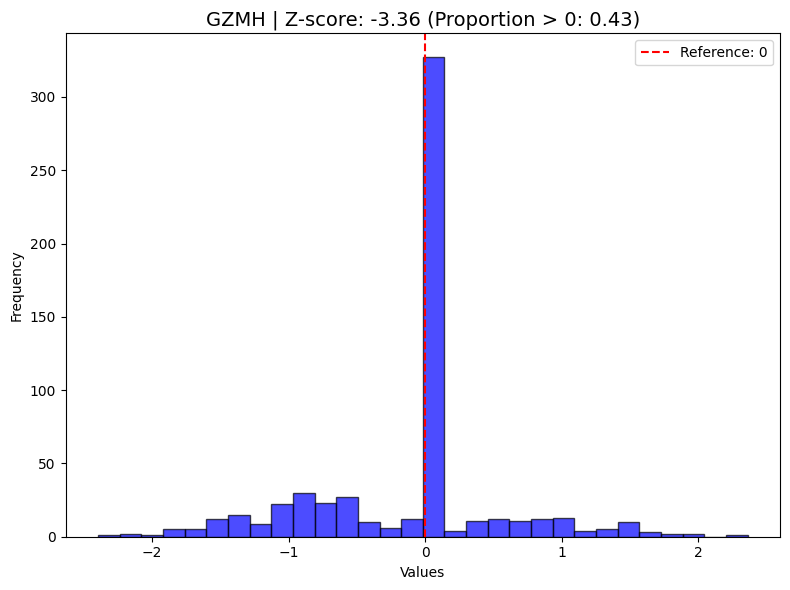

Plotting: GPR97
adjusted p-value: 1.5202675368356942e-05


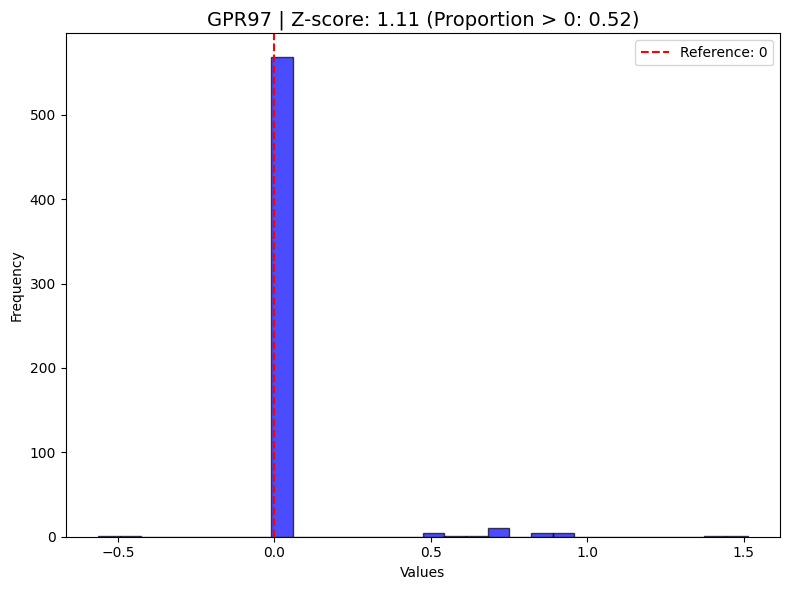

Plotting: DUSP2
adjusted p-value: 3.952812045674898e-05


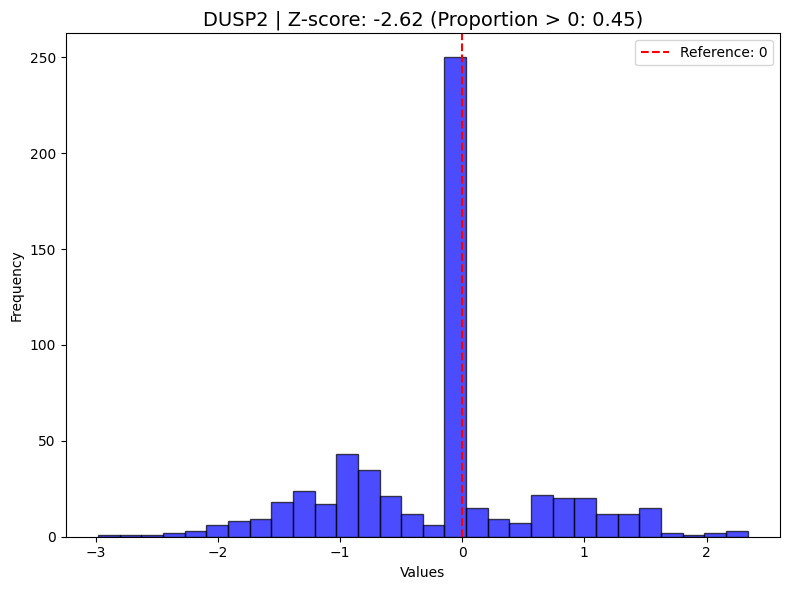

Plotting: CD38
adjusted p-value: 5.06118069548973e-05


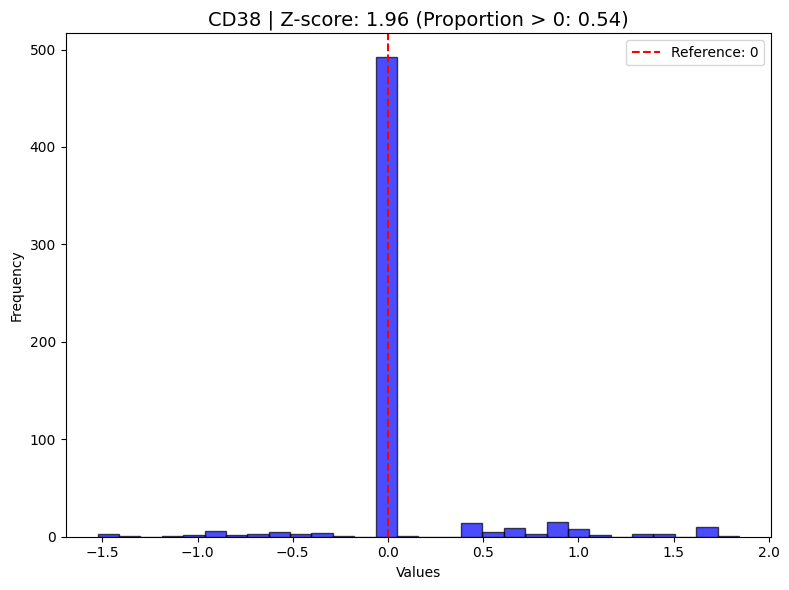

Plotting: CCND2
adjusted p-value: 0.000379336323696795


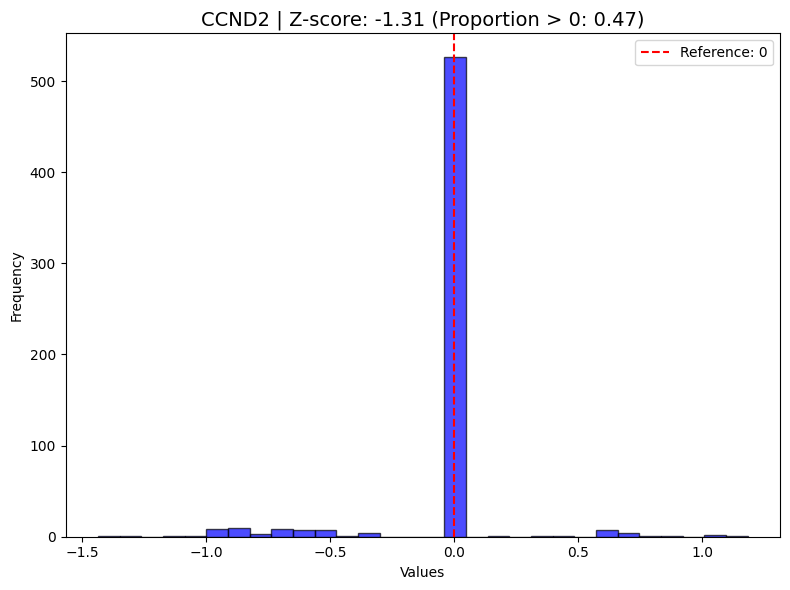

Plotting: SH2D1B
adjusted p-value: 0.0004955238704601958


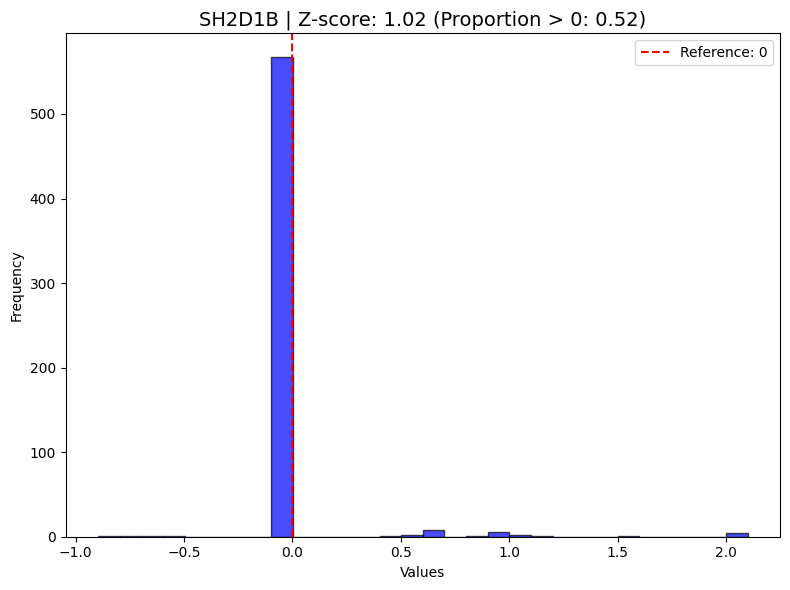

Plotting: MATK
adjusted p-value: 0.0005223056638402689


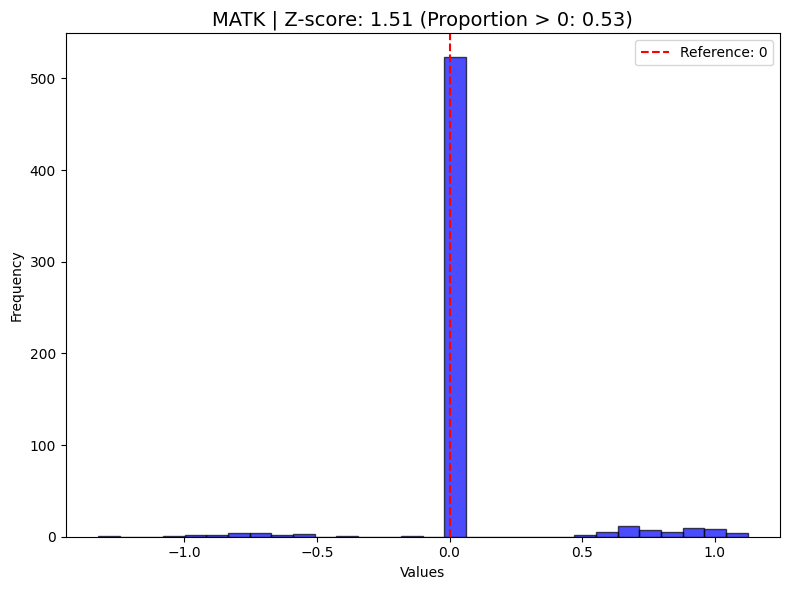

Plotting: HN1
adjusted p-value: 0.000591187617183045


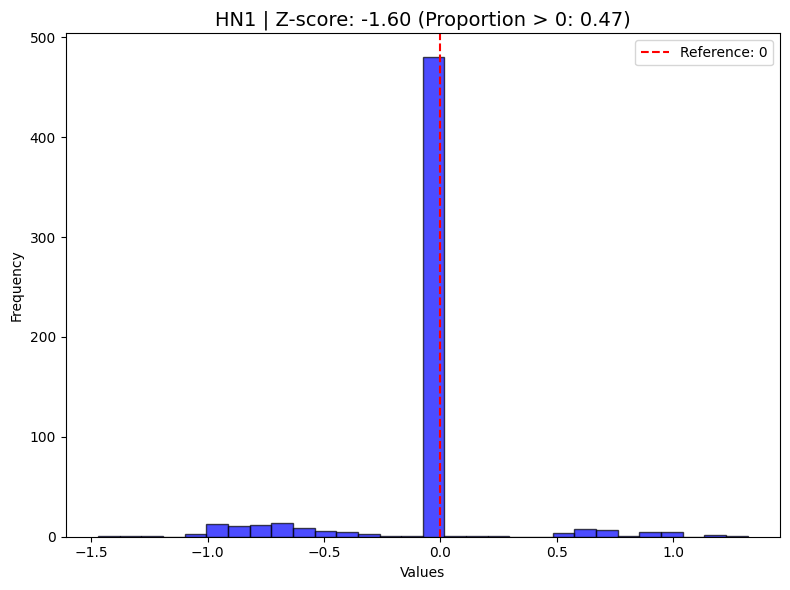

Plotting: TNFRSF18
adjusted p-value: 0.0006882399863707184


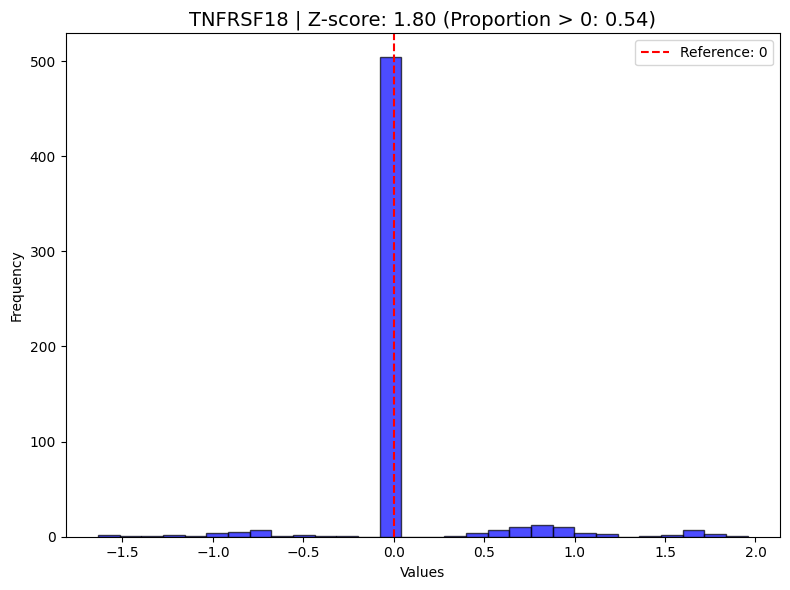

Plotting: CD8B
adjusted p-value: 0.0007956108471365297


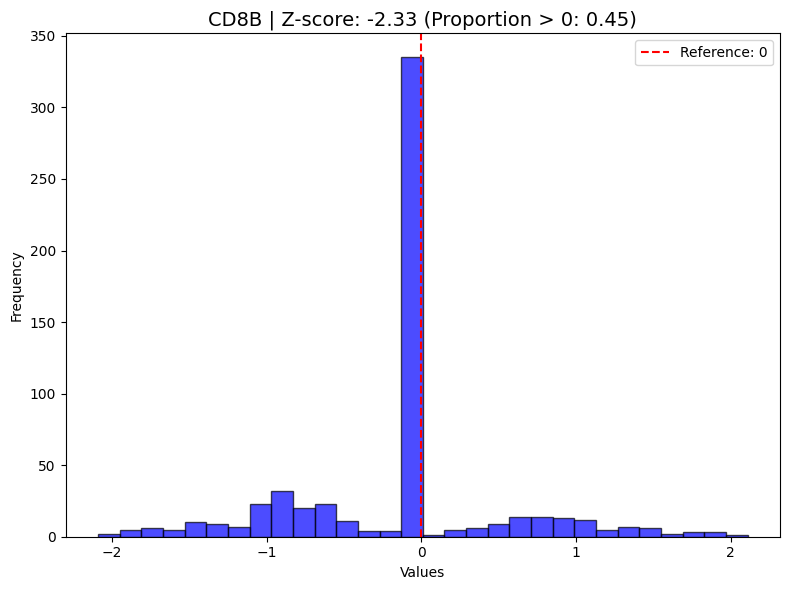

array([ 0.9604297 , -1.65284842,  2.03378305, ...,  1.73629522,
        1.        , -1.7071833 ])

In [7]:
adata1=sc.read_h5ad("./PBMC_fake_permute/b-0--c-1__ITE.h5ad")
indices=adata1.obs["cell_type"]=="CD8T"
Plot_and_Estimate_CATE_adata(adata1,indices)
print("="*20)
Plot_and_Estimate_CATE_adata(adata1,indices,parametric=True)

Number of genes with ITE adjusted p-values less than 0.01 0
Selected most significant genes:
        Gene   Z score  Adjusted_p
0       CCL5 -4.419417    0.019793
1       CST7 -3.299832    0.967428
2       CD8A -3.005204    1.000000
3       GZMH -2.769502    1.000000
4      DUSP2 -2.592725    1.000000
5       EML4 -2.533799    1.000000
6   APOBEC3G -2.474874    1.000000
7       LYAR -2.298097    1.000000
8   TBC1D10C  2.239171    1.000000
9       CD8B -2.062395    1.000000
10       FYN -2.062395    1.000000
11     CD247  1.944544    1.000000
12  HLA-DPB1 -1.885618    1.000000
13    KLHDC4  1.826693    1.000000
14     PLAC8  1.826693    1.000000
15      SELL  1.767767    1.000000
16     PRDX2  1.767767    1.000000
17      PASK  1.708841    1.000000
18     CXCR3 -1.708841    1.000000
19      GNLY  1.708841    1.000000
Plotting: CCL5
adjusted p-value: 0.01979346925029546


<Figure size 1000x600 with 0 Axes>

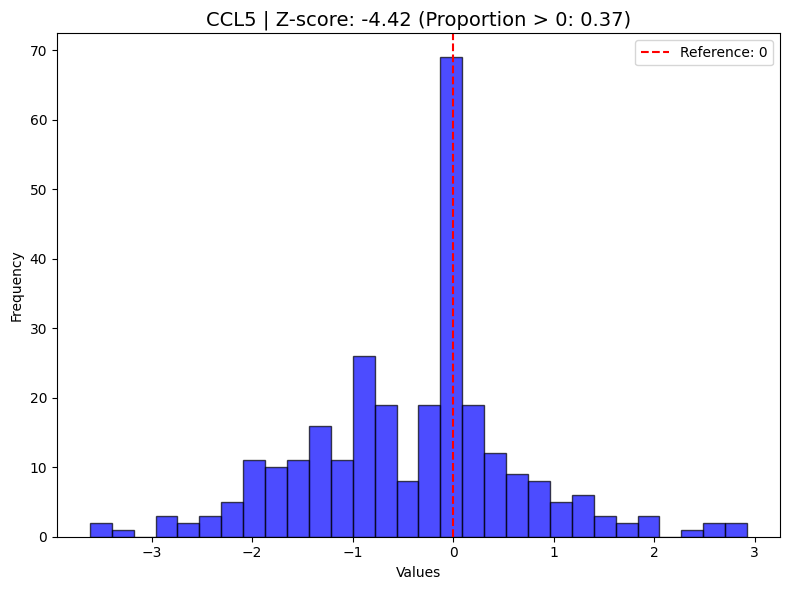

Plotting: CST7
adjusted p-value: 0.9674284502476649


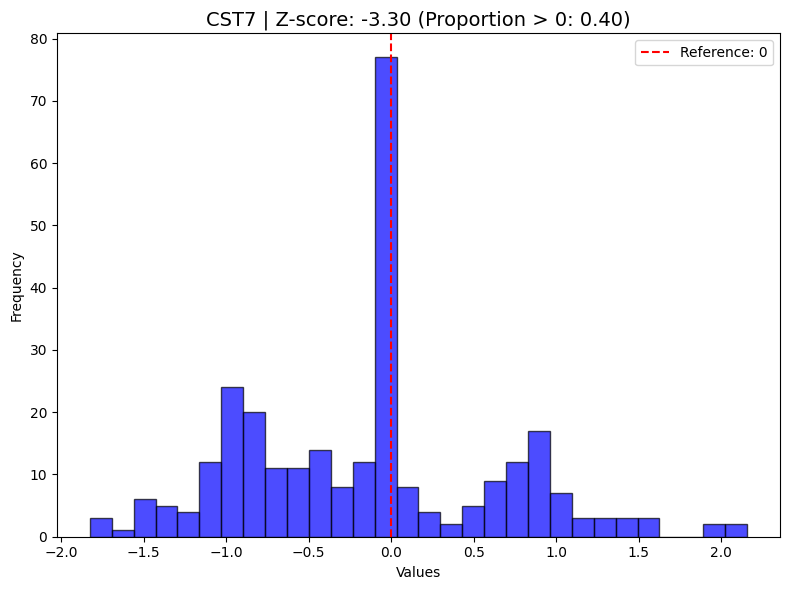

Plotting: CD8A
adjusted p-value: 1.0


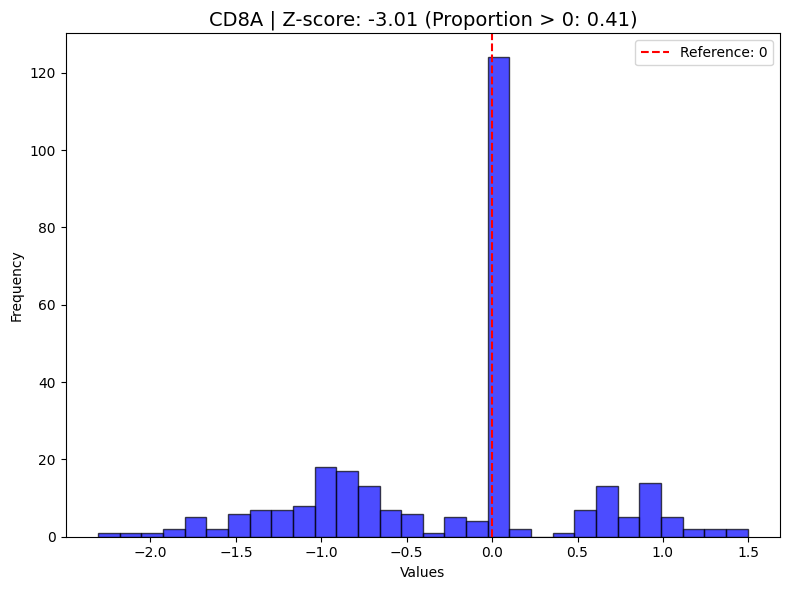

Plotting: GZMH
adjusted p-value: 1.0


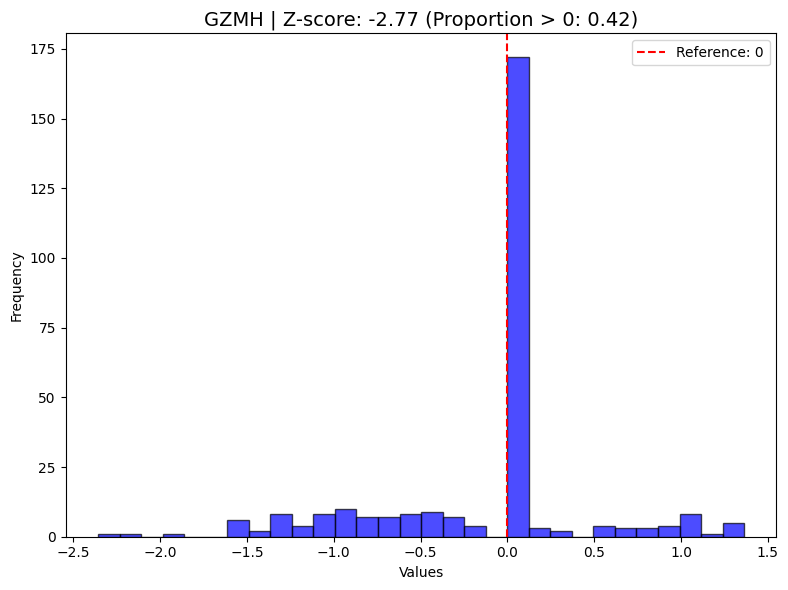

Plotting: DUSP2
adjusted p-value: 1.0


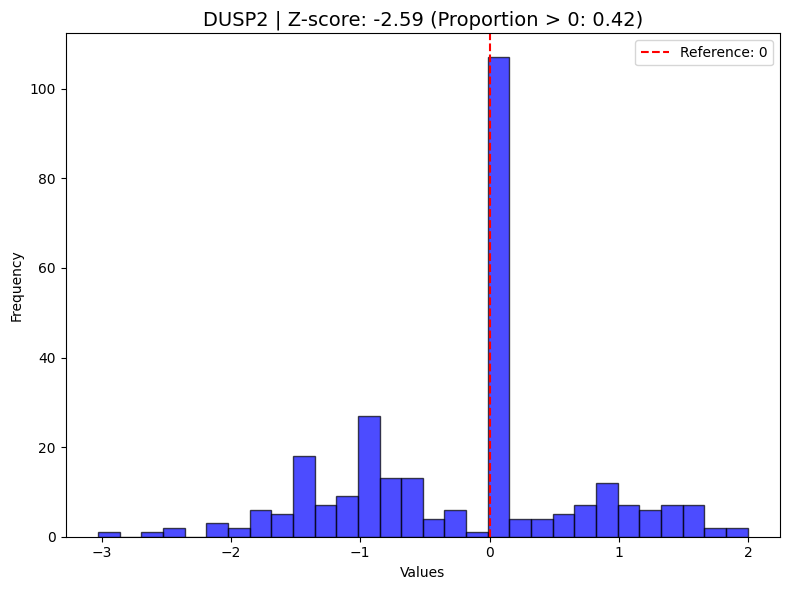

Plotting: EML4
adjusted p-value: 1.0


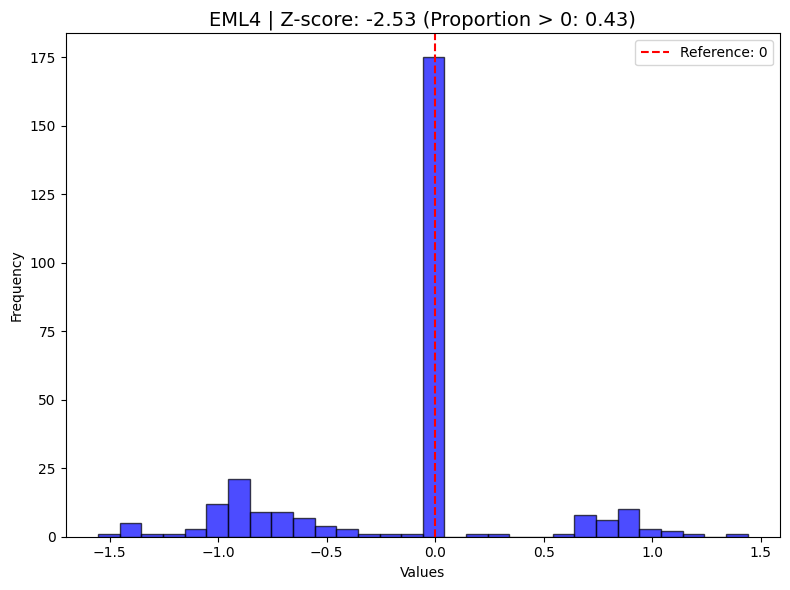

Plotting: APOBEC3G
adjusted p-value: 1.0


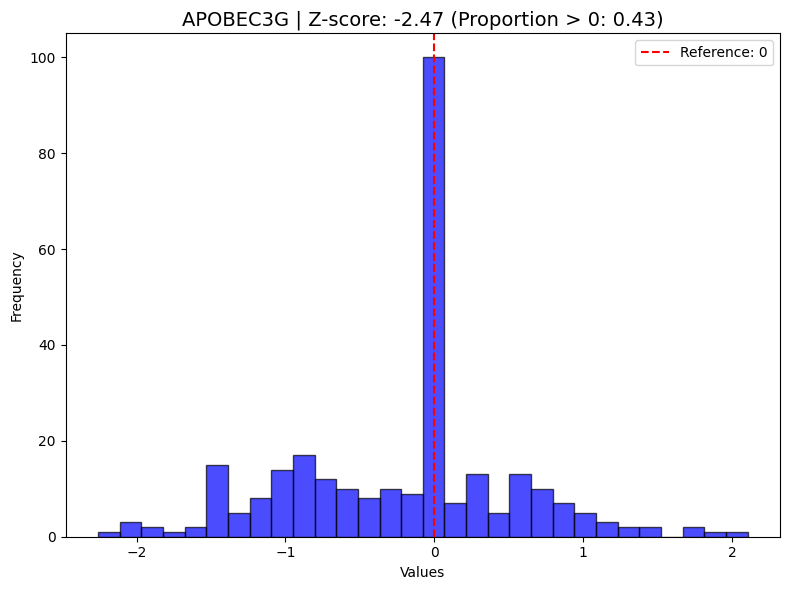

Plotting: LYAR
adjusted p-value: 1.0


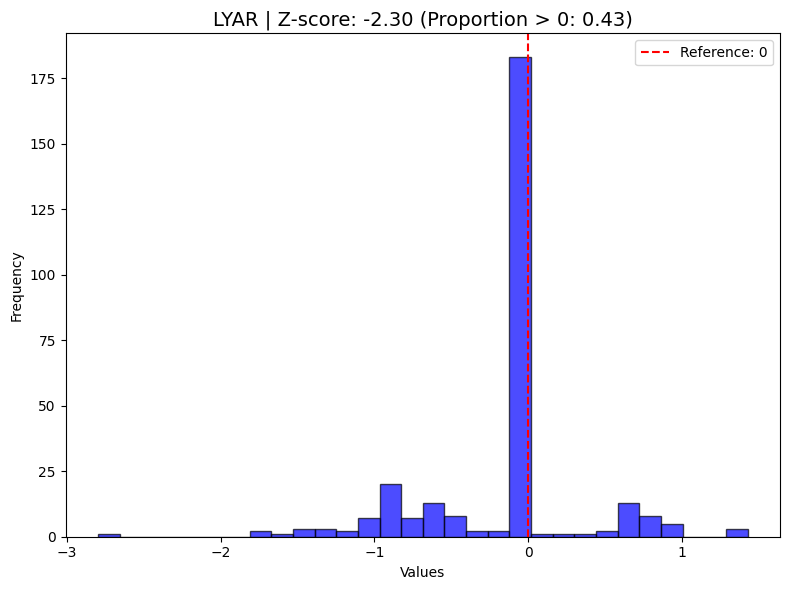

Plotting: TBC1D10C
adjusted p-value: 1.0


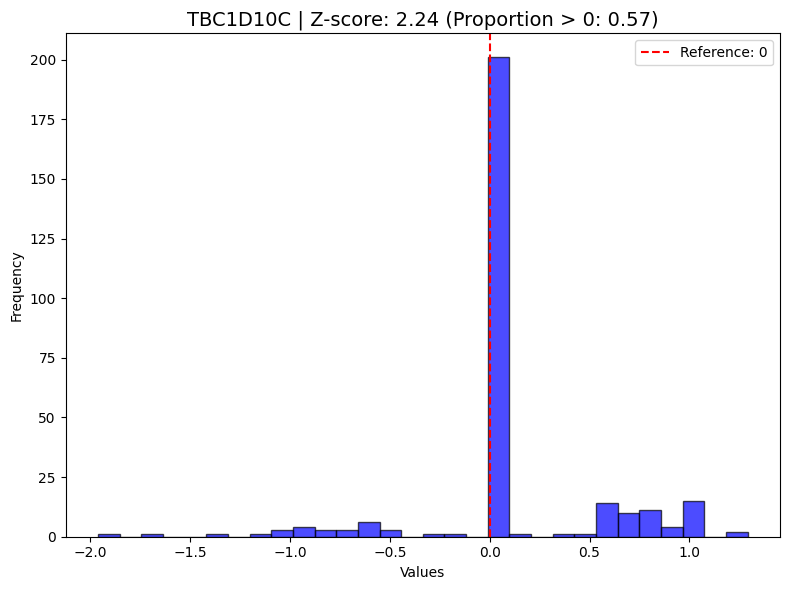

Plotting: CD8B
adjusted p-value: 1.0


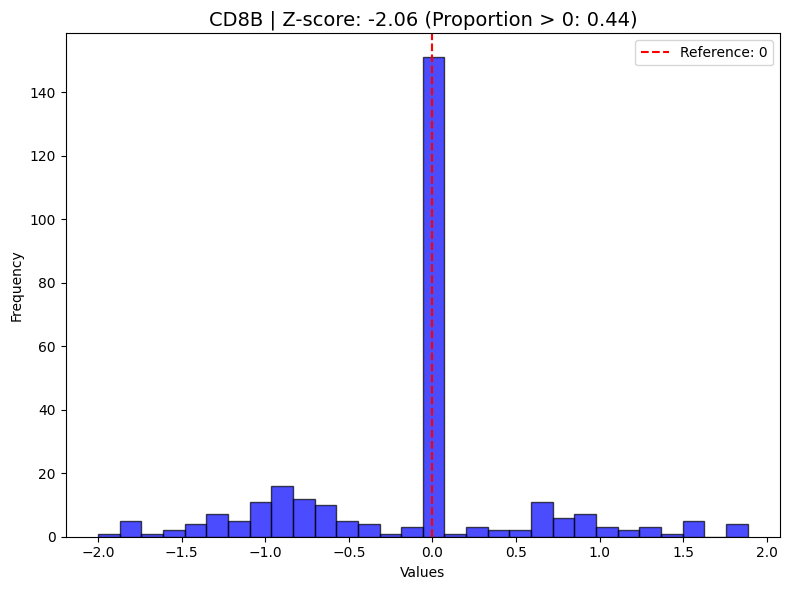

Plotting: FYN
adjusted p-value: 1.0


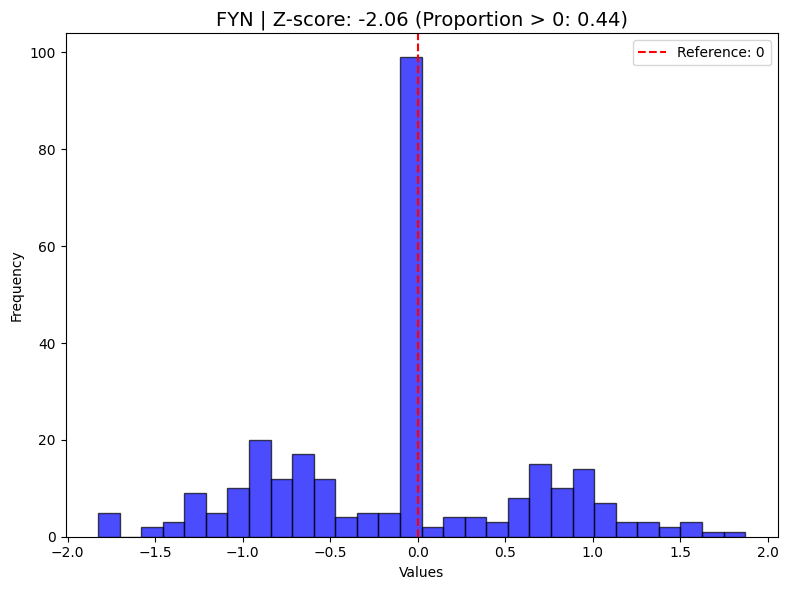

Plotting: CD247
adjusted p-value: 1.0


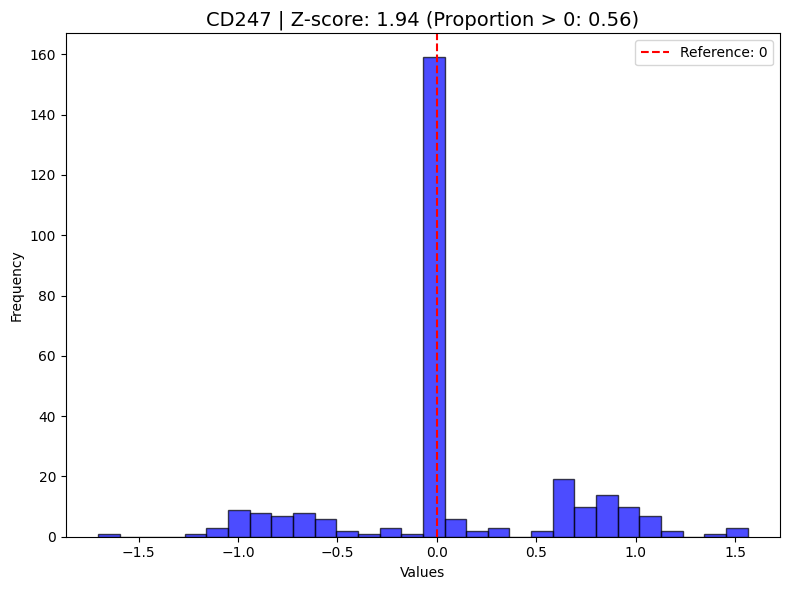

Plotting: HLA-DPB1
adjusted p-value: 1.0


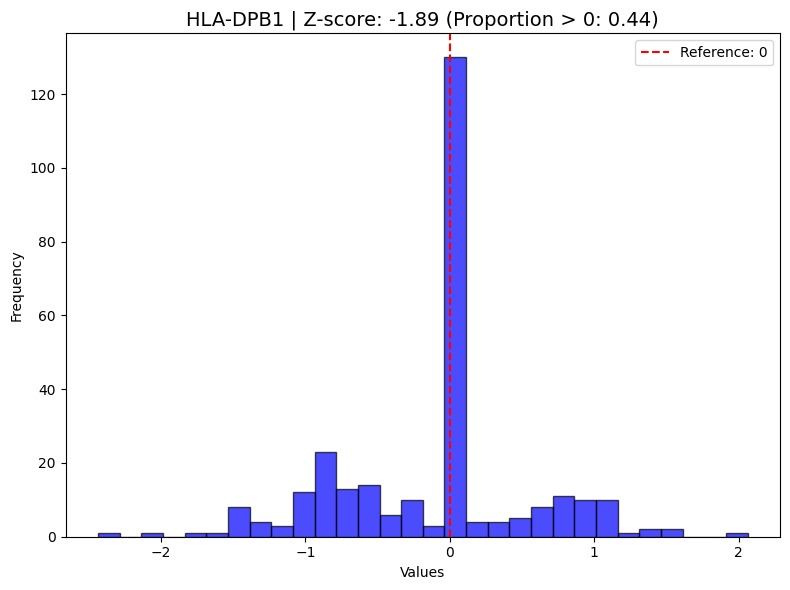

Plotting: KLHDC4
adjusted p-value: 1.0


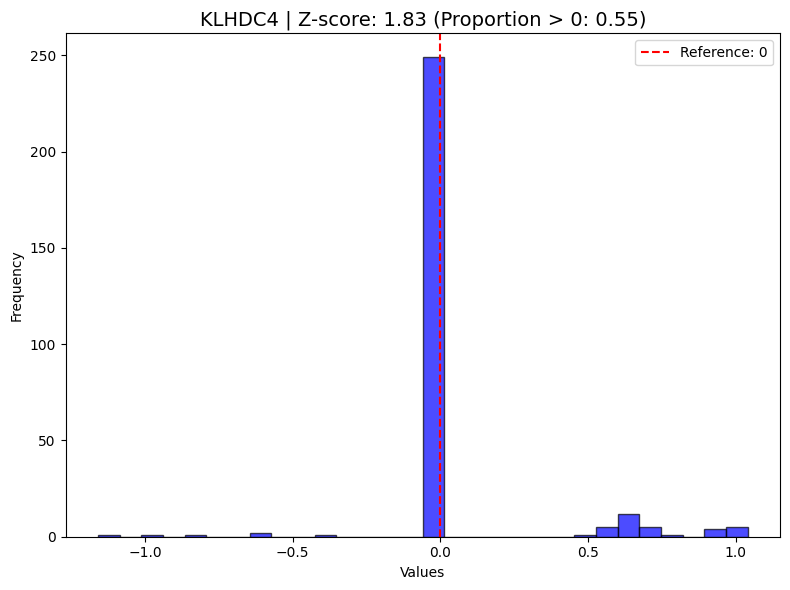

Plotting: PLAC8
adjusted p-value: 1.0


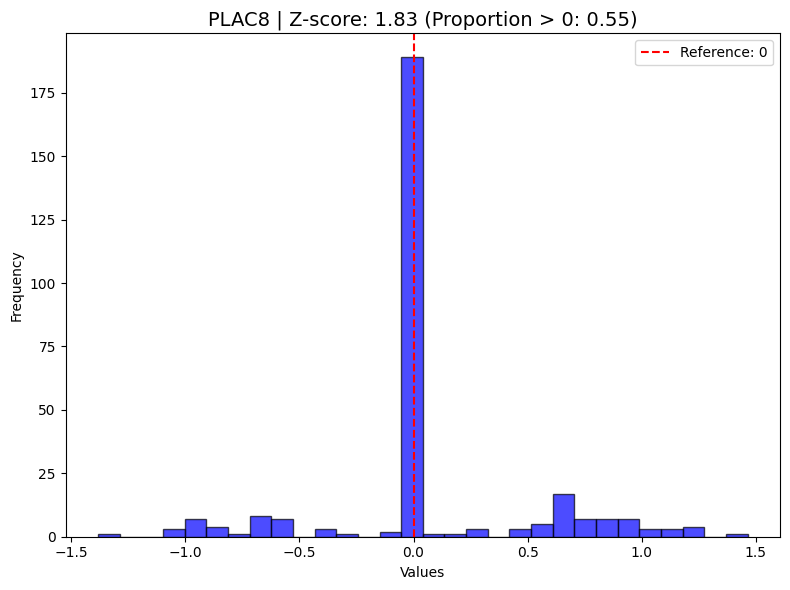

Plotting: SELL
adjusted p-value: 1.0


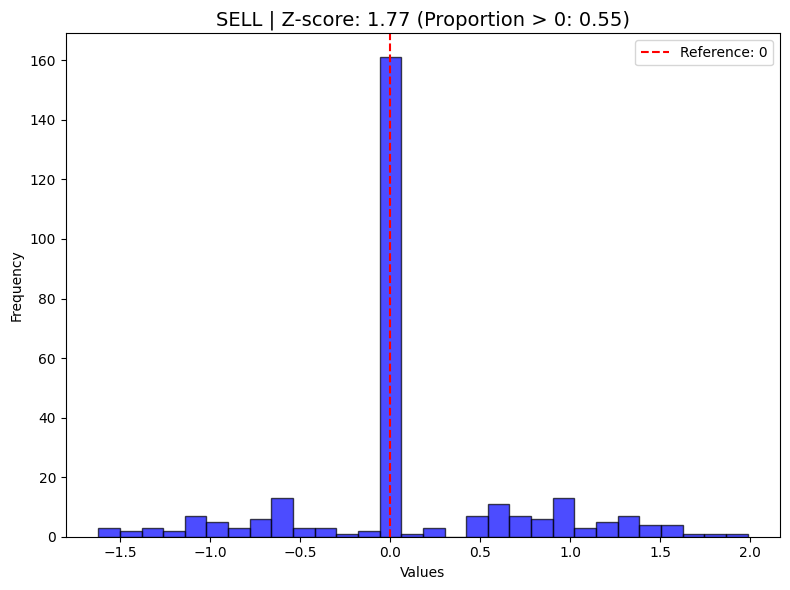

Plotting: PRDX2
adjusted p-value: 1.0


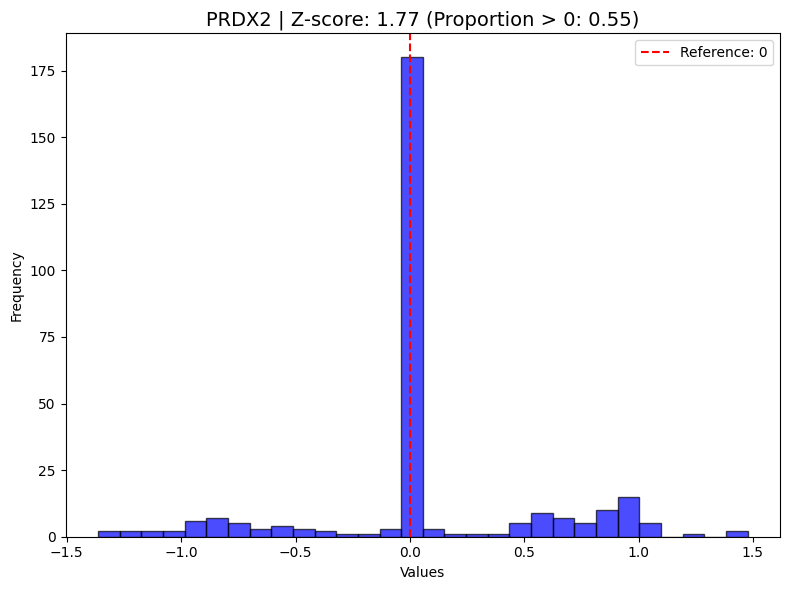

Plotting: PASK
adjusted p-value: 1.0


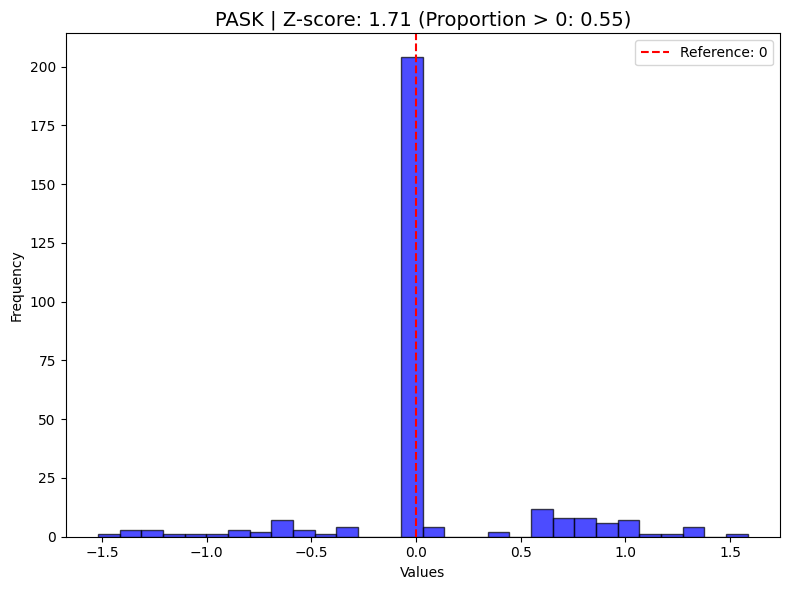

Plotting: CXCR3
adjusted p-value: 1.0


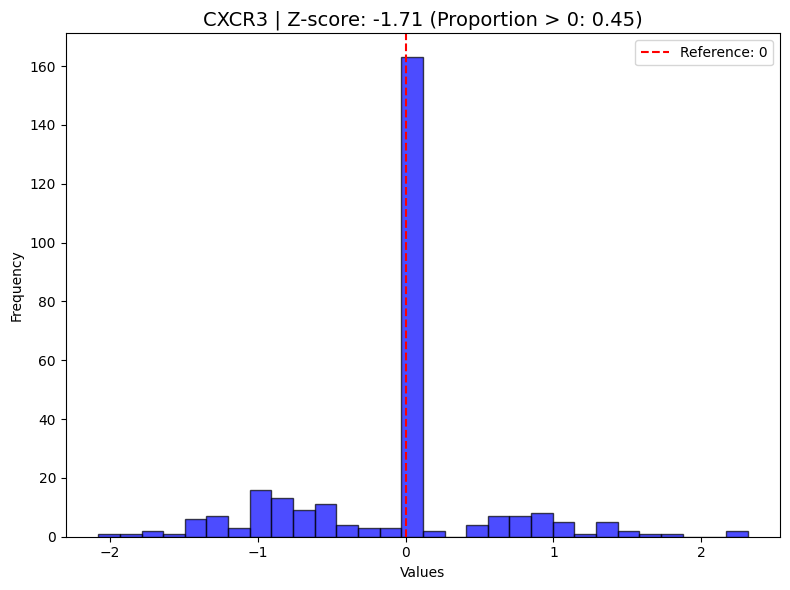

Plotting: GNLY
adjusted p-value: 1.0


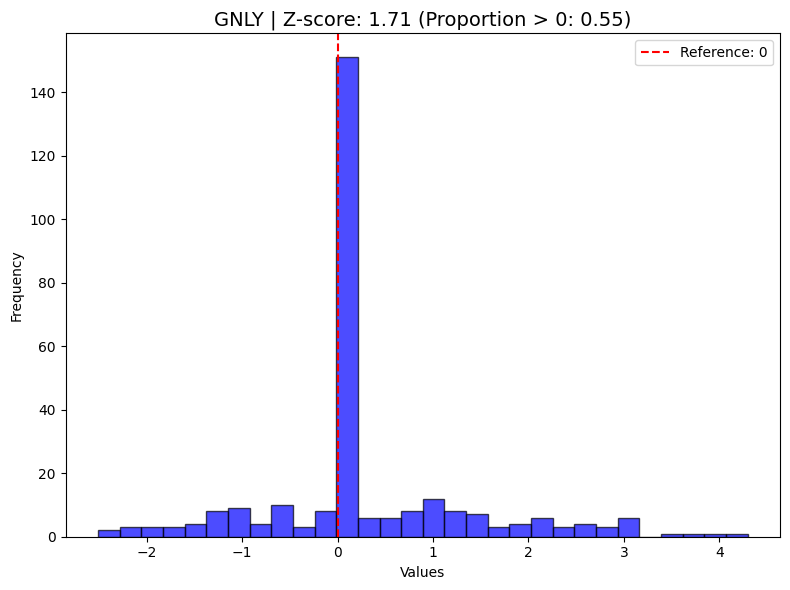

Number of genes with ITE adjusted p-values less than 0.01 310
Selected most significant genes:
           Gene   Z score    Adjusted_p
0   RP11-79P5.9       inf  0.000000e+00
1          NQO1       inf  0.000000e+00
2        NAP1L6       inf  0.000000e+00
3          FPR1       inf  0.000000e+00
4      C11orf82       inf  0.000000e+00
5          CCL5 -6.254310  2.716176e-09
6          CD8A -5.292916  8.161437e-07
7          GZMH -4.462087  5.484151e-05
8      APOBEC3G -4.418182  6.702655e-05
9          EML4 -4.333311  9.857923e-05
10       KLHDC4  4.224357  1.602838e-04
11        DUSP2 -4.184503  1.905273e-04
12         LYAR -4.068659  3.141821e-04
13         GNLY  3.874800  7.067043e-04
14      HLA-DRA -3.732916  1.249345e-03
15        RIOK1  3.467341  3.458126e-03
16        KLRC1  3.321005  5.881561e-03
17        RCAN3  3.318638  5.912253e-03
18         SAE1 -3.307896  6.123760e-03
19         GZMM -3.298877  6.303406e-03
Plotting: RP11-79P5.9
adjusted p-value: 0.0


/tmp/ipykernel_3606102/2723383086.py:33: RuntimeWarning: invalid value encountered in scalar divide
  z_score = np.mean(gene_ite)/np.std(gene_ite, ddof=1)*np.sqrt(n)
/tmp/ipykernel_3606102/2723383086.py:33: RuntimeWarning: divide by zero encountered in scalar divide
  z_score = np.mean(gene_ite)/np.std(gene_ite, ddof=1)*np.sqrt(n)


<Figure size 1000x600 with 0 Axes>

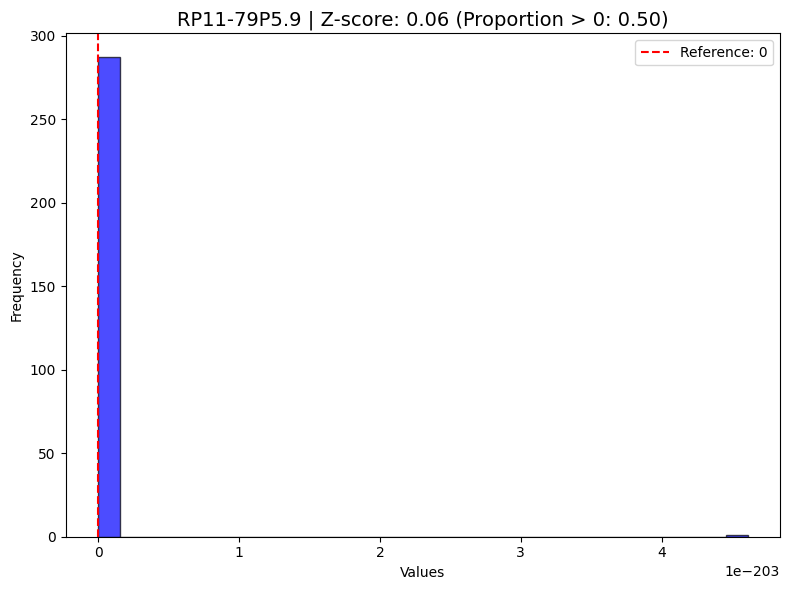

Plotting: NQO1
adjusted p-value: 0.0


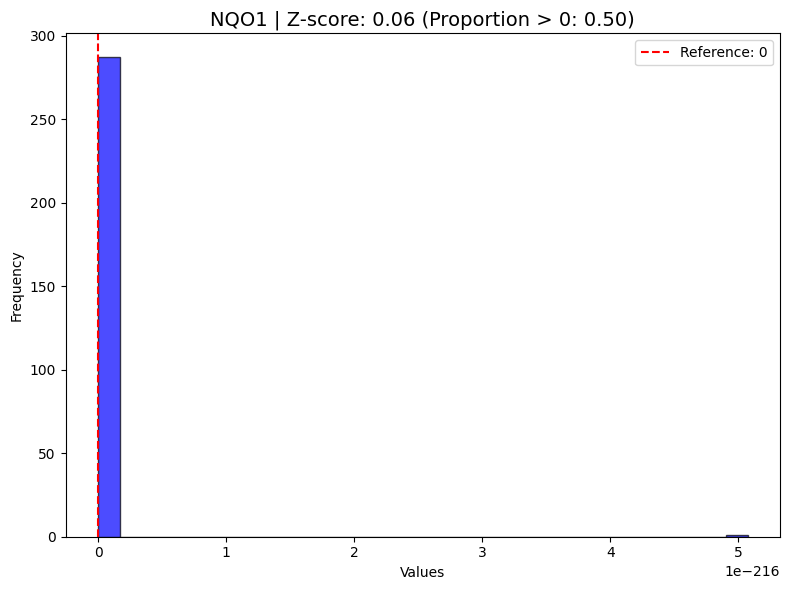

Plotting: NAP1L6
adjusted p-value: 0.0


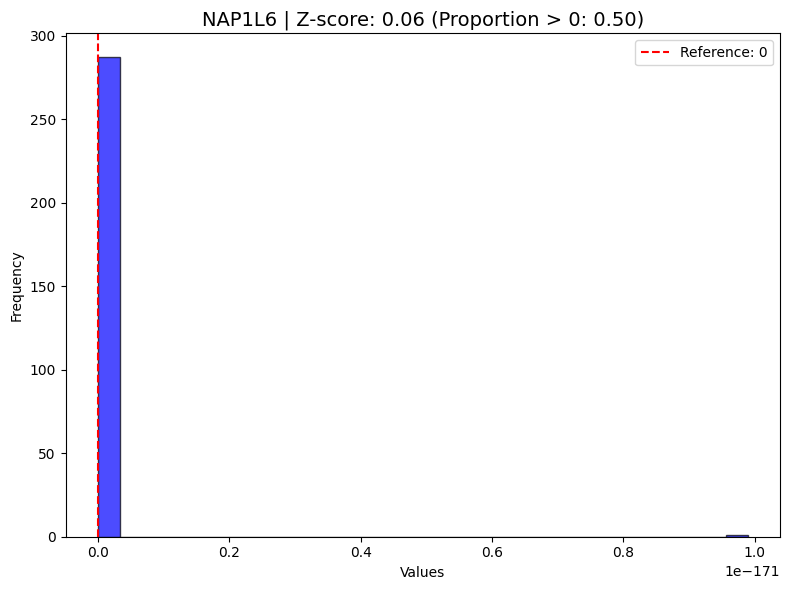

Plotting: FPR1
adjusted p-value: 0.0


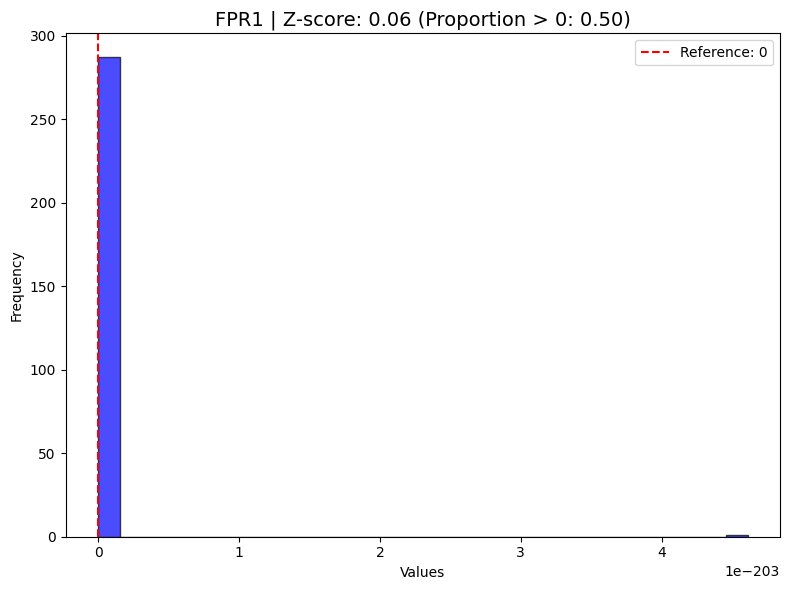

Plotting: C11orf82
adjusted p-value: 0.0


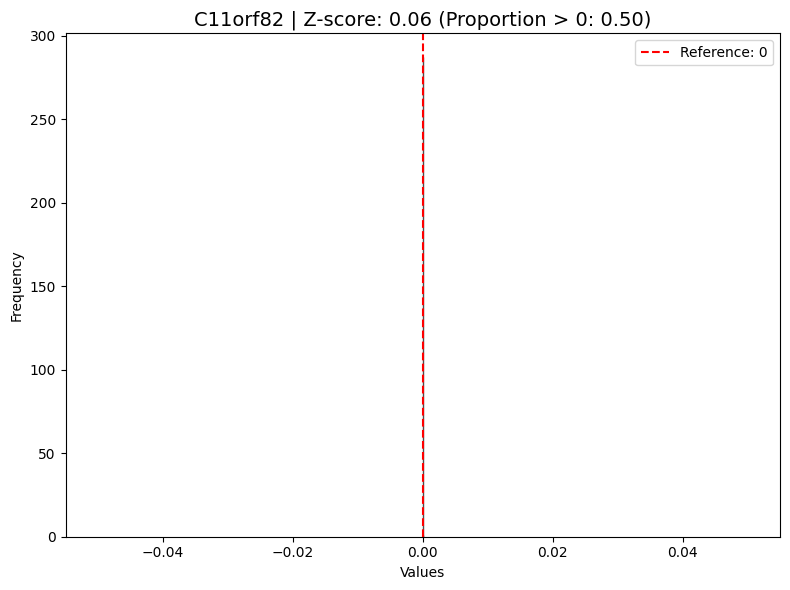

Plotting: CCL5
adjusted p-value: 2.716176490074369e-09


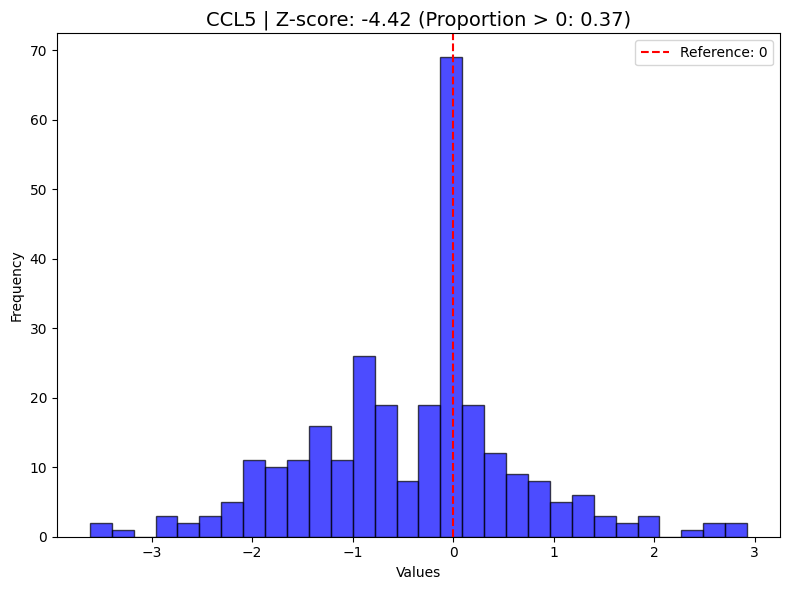

Plotting: CD8A
adjusted p-value: 8.161436709127368e-07


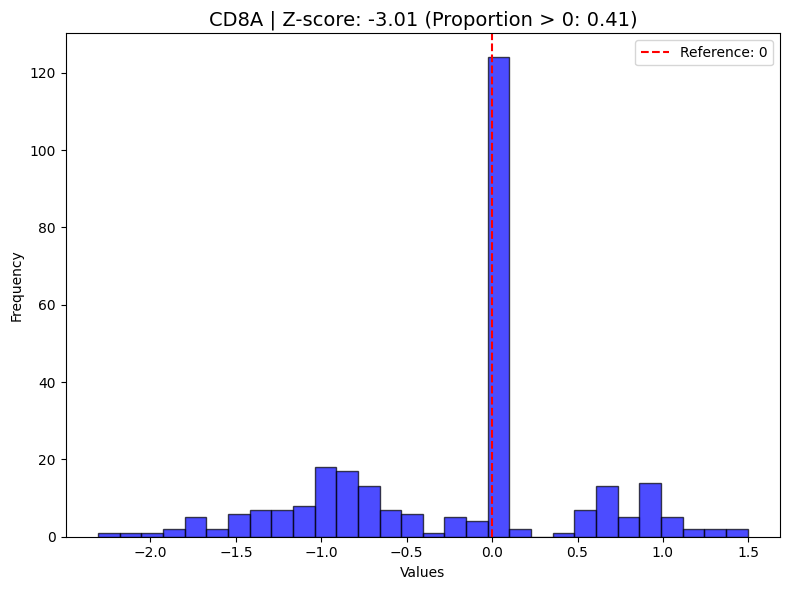

Plotting: GZMH
adjusted p-value: 5.4841511207645956e-05


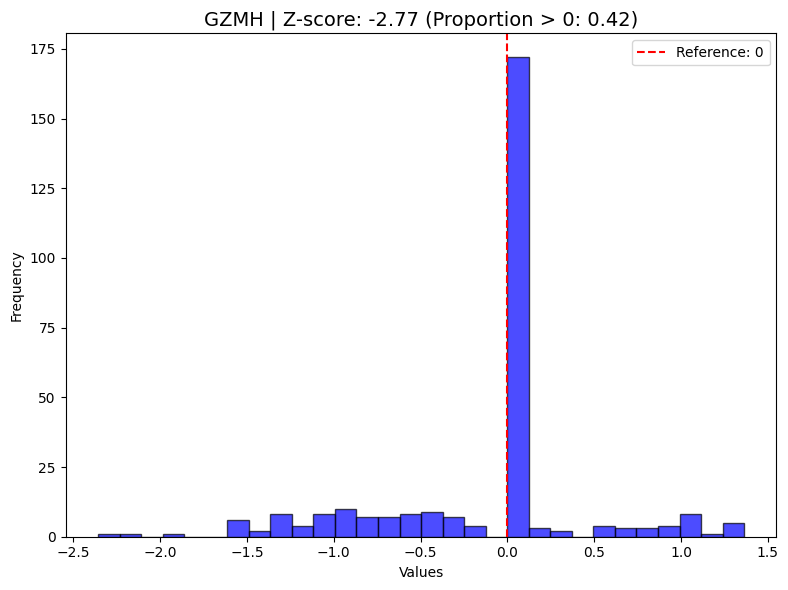

Plotting: APOBEC3G
adjusted p-value: 6.702654592367435e-05


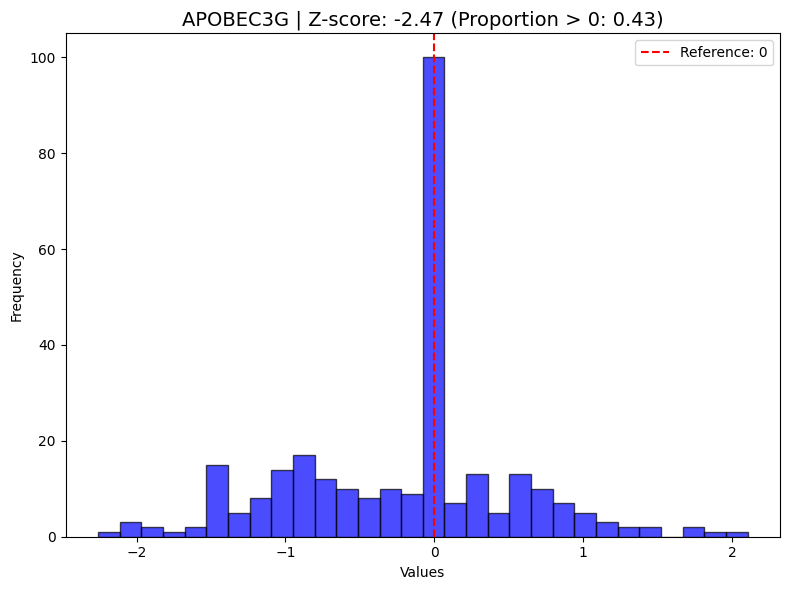

Plotting: EML4
adjusted p-value: 9.857923149220519e-05


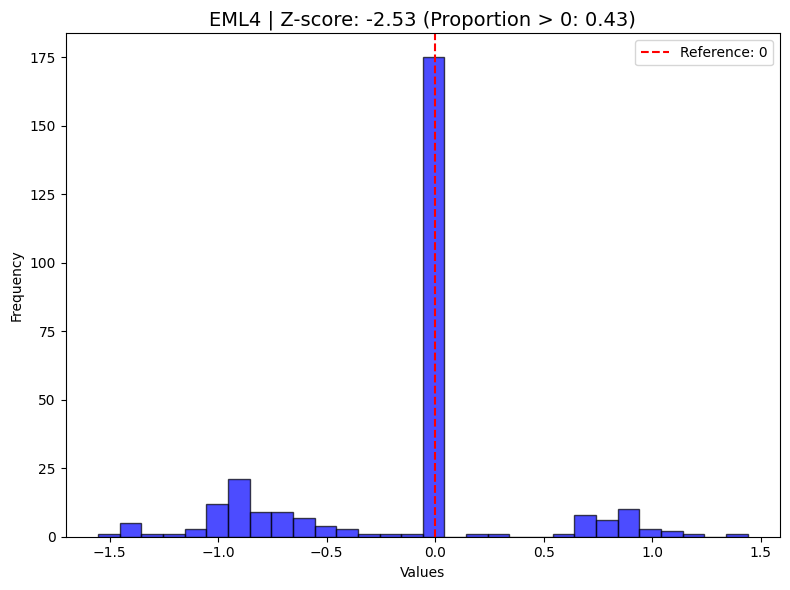

Plotting: KLHDC4
adjusted p-value: 0.00016028377101827431


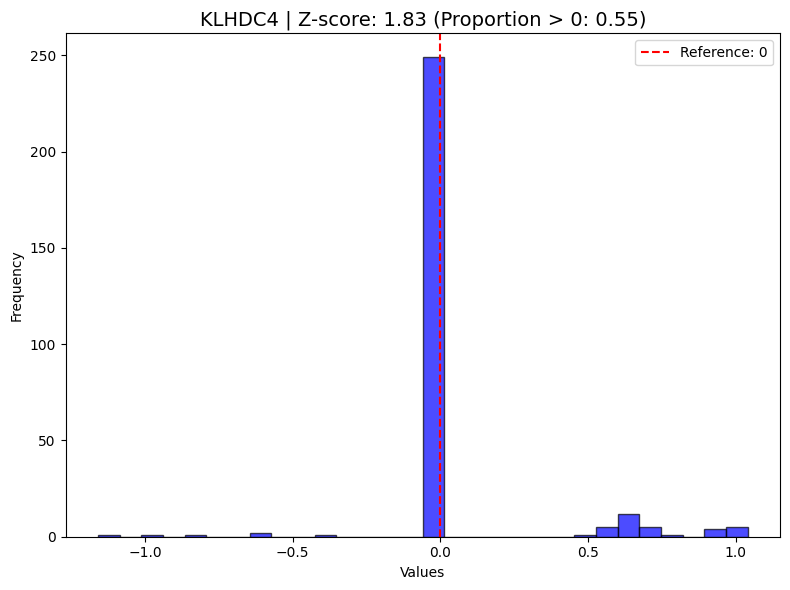

Plotting: DUSP2
adjusted p-value: 0.00019052726775973622


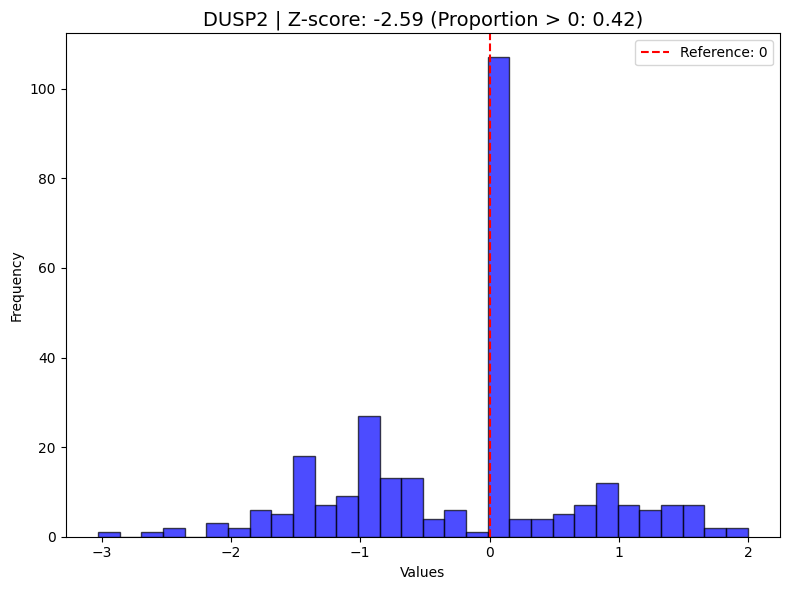

Plotting: LYAR
adjusted p-value: 0.0003141821482032794


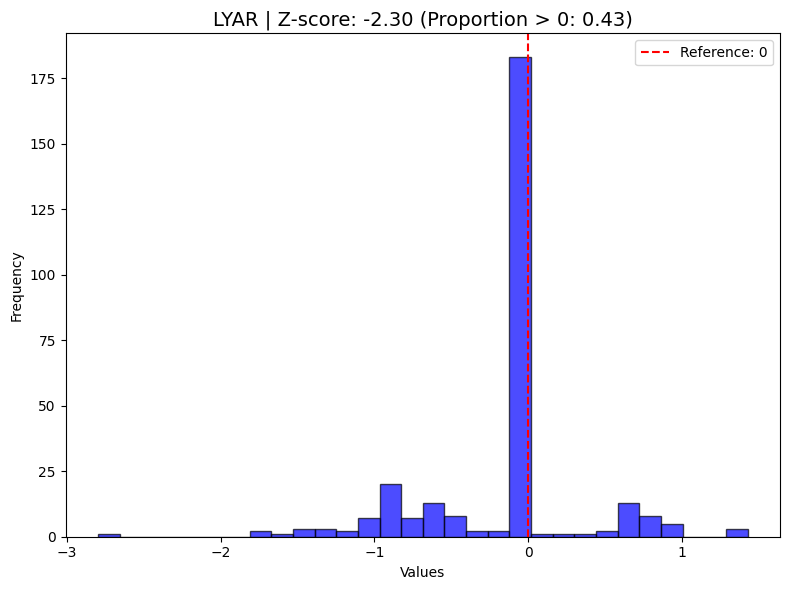

Plotting: GNLY
adjusted p-value: 0.000706704259877113


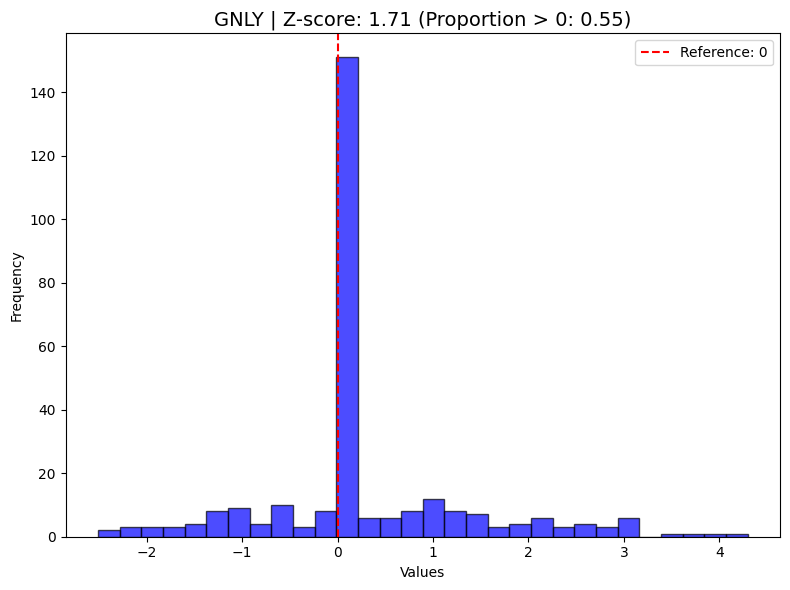

Plotting: HLA-DRA
adjusted p-value: 0.001249345414885926


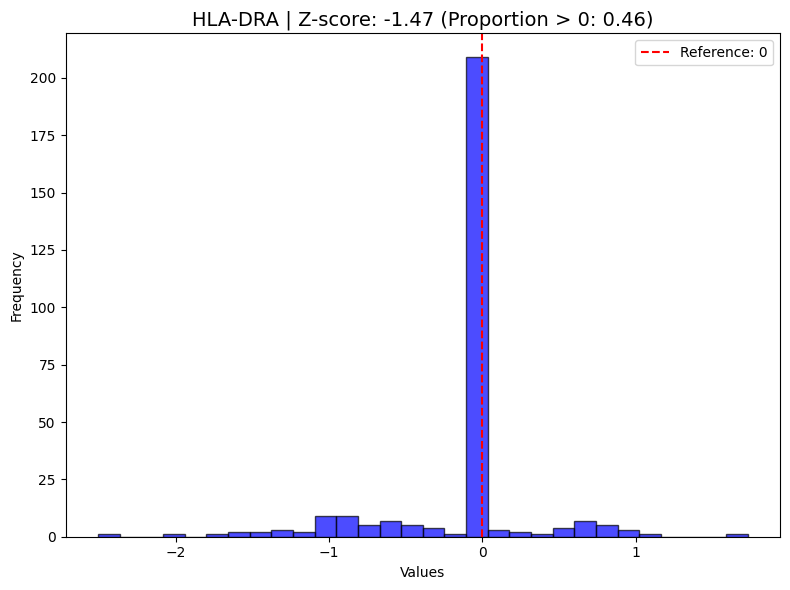

Plotting: RIOK1
adjusted p-value: 0.003458126064327149


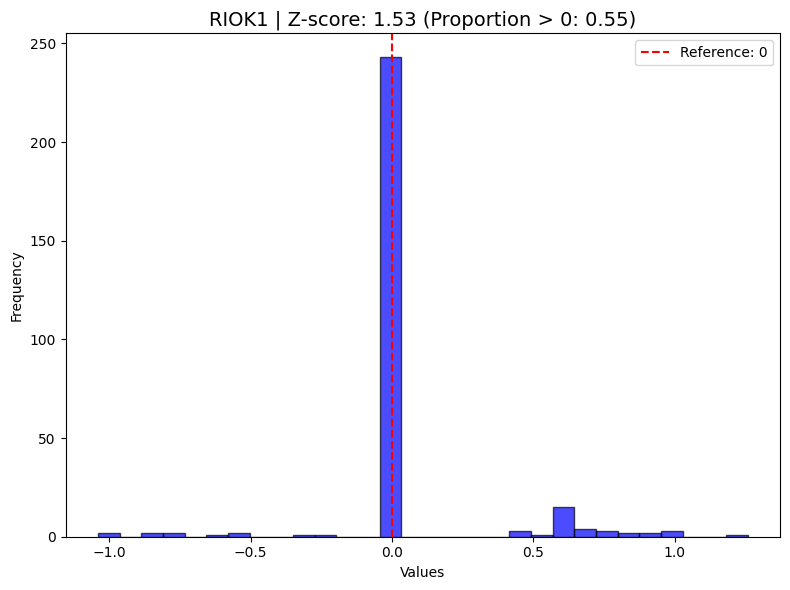

Plotting: KLRC1
adjusted p-value: 0.005881560683028897


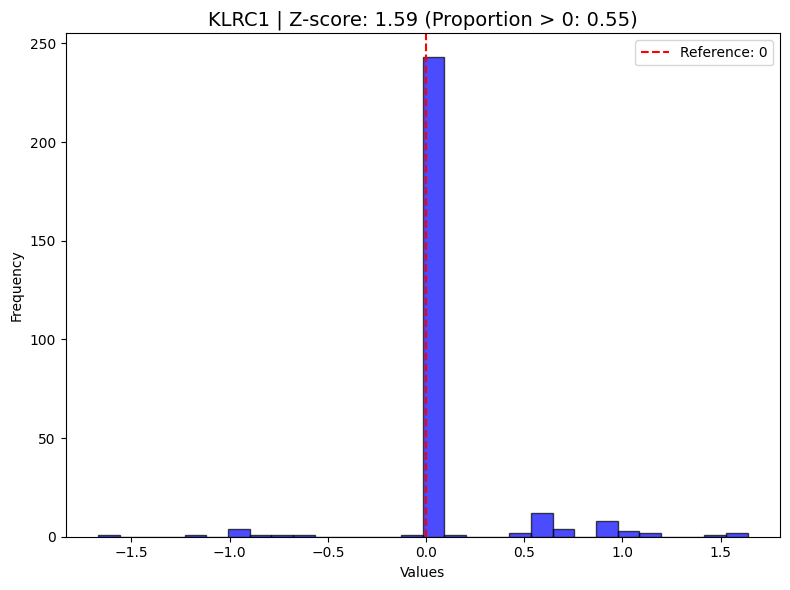

Plotting: RCAN3
adjusted p-value: 0.005912253117712412


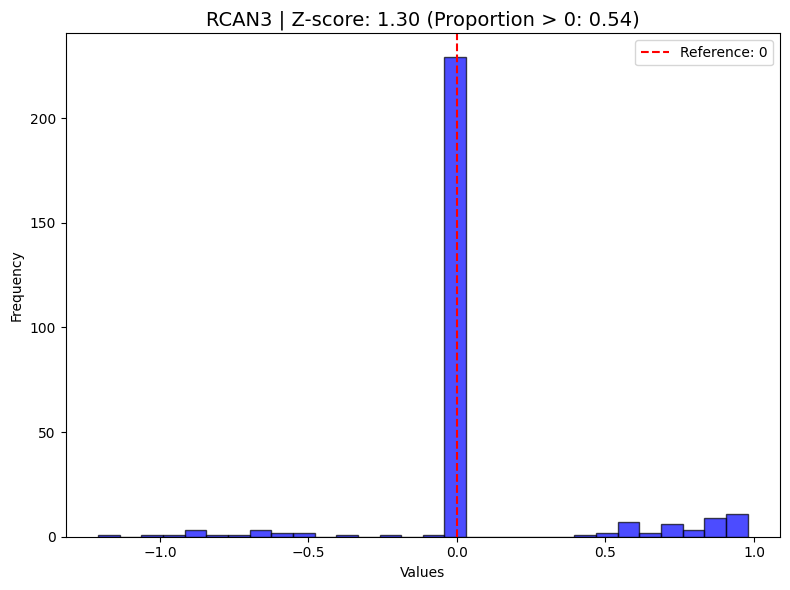

Plotting: SAE1
adjusted p-value: 0.006123759720292762


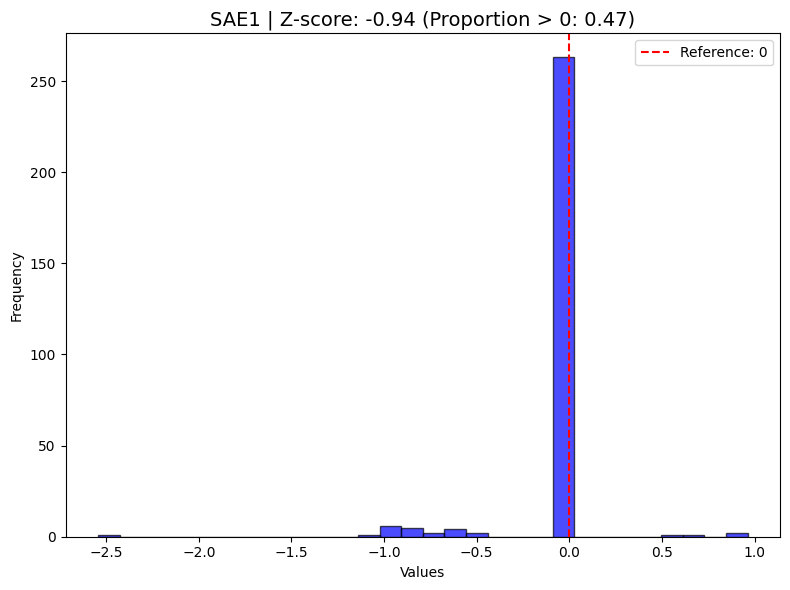

Plotting: GZMM
adjusted p-value: 0.006303405932045985


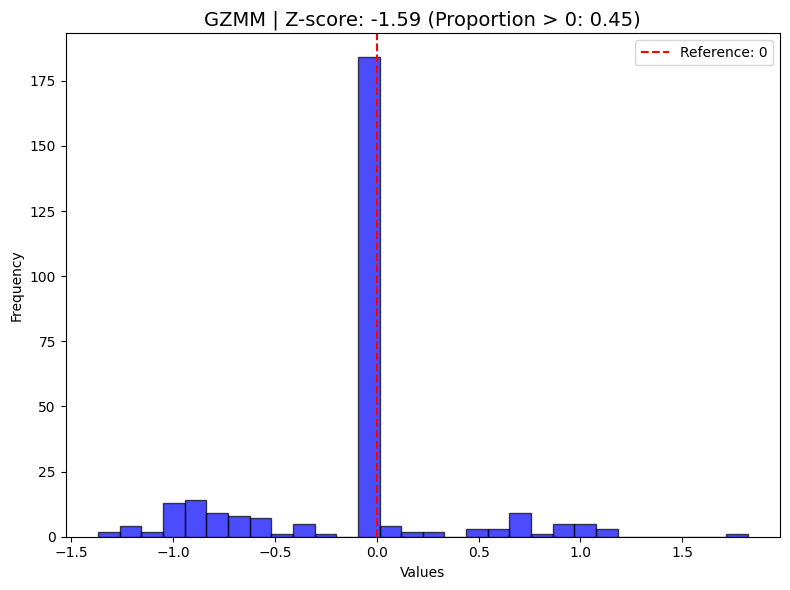

array([-1.        ,  1.64188725, -2.11160241, ...,  0.96022698,
               nan,  1.54997995])

In [8]:
adata2=sc.read_h5ad("./PBMC_fake_random_part/b-0--c-1__ITE.h5ad")
indices=adata2.obs["cell_type"]=="CD8T"
Plot_and_Estimate_CATE_adata(adata2,indices)
print("="*20)
Plot_and_Estimate_CATE_adata(adata2,indices,parametric=True)

# For CINEMA-OT

In [7]:
import numpy as np
import scanpy as sc
import cinemaot as co
import matplotlib.colors as colors
import matplotlib.pyplot as plt

import random
import torch
import sklearn
import os
def set_seed(seed: int):
    # Set Python random seed
    random.seed(seed)

    # Set NumPy random seed
    np.random.seed(seed)

    # Set PyTorch random seed
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)  # If using multi-GPU.

        # Ensure deterministic behavior in PyTorch (can slow down computations)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

    # Set sklearn random seed
    sklearn.utils.check_random_state(seed)

    # Set environment variable for reproducibility
    os.environ['PYTHONHASHSEED'] = str(seed)

set_seed(123)

import warnings
warnings.filterwarnings("ignore")
warnings.filterwarnings("ignore", category=FutureWarning)

In [8]:
def run_cinema_ot(adata, condition_key, cell_type_key,exp_label,ref_label, dataset_name):
    import warnings
    warnings.filterwarnings("ignore")
    warnings.filterwarnings("ignore", category=FutureWarning)

    print(adata)
    if adata.shape[1]>2000:
        sc.pp.highly_variable_genes(adata, n_top_genes=2000)
        adata = adata[:, adata.var["highly_variable"]]
    
    adata_=adata.copy()
    print(adata_)
    sc.pp.pca(adata_)
    print(condition_key,ref_label,exp_label,cell_type_key)
    cf, ot, de = co.cinemaot.cinemaot_unweighted(adata_, obs_label=condition_key, ref_label=ref_label,
                                                 expr_label=exp_label, mode='parametric', thres=0.5,
                                                 smoothness=1e-5, eps=1e-3, preweight_label=cell_type_key)
    adata_.obsm['cf'] = cf.copy()
    adata_.obsm['cf'][adata_.obs[condition_key]==ref_label,:] = np.matmul(ot/np.sum(ot,axis=1)[:,None],cf[adata_.obs[condition_key]==exp_label,:])
    sc.pp.neighbors(adata_, use_rep='cf')

    sc.tl.umap(adata_, random_state=1)
    print("Effect modifier (called confounder in this paper) space:")
    sc.pl.umap(adata_, color=[condition_key, cell_type_key], wspace=0.5)
    
    return de

# For real data

AnnData object with n_obs × n_vars = 16893 × 6998
    obs: 'condition', 'n_counts', 'n_genes', 'mt_frac', 'cell_type', 'condition_fake'
    var: 'gene_symbol', 'n_cells'
    uns: 'cell_type_colors', 'condition_colors', 'neighbors'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    obsp: 'distances', 'connectivities'
AnnData object with n_obs × n_vars = 16893 × 2000
    obs: 'condition', 'n_counts', 'n_genes', 'mt_frac', 'cell_type', 'condition_fake'
    var: 'gene_symbol', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'condition_colors', 'neighbors', 'hvg'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    obsp: 'distances', 'connectivities'
condition control stimulated cell_type
Effect modifier (called confounder in this paper) space:


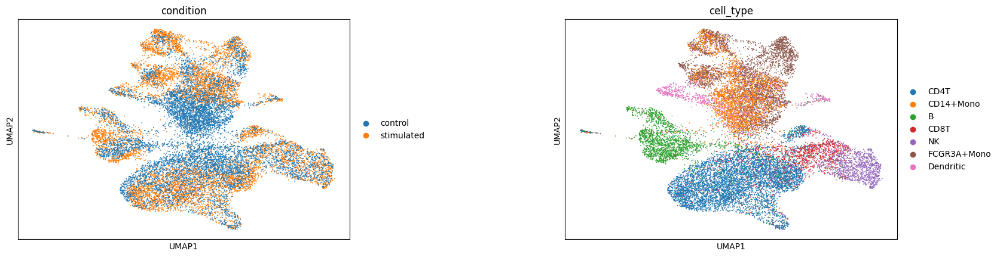

AnnData object with n_obs × n_vars = 8007 × 2000
    obs: 'condition', 'n_counts', 'n_genes', 'mt_frac', 'cell_type', 'condition_fake'
    var: 'gene_symbol', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    obsm: 'X_embedding'
Number of genes with ITE adjusted p-values less than 0.01 1970
Selected most significant genes:
           Gene    Z score  Adjusted_p
0   KB-1615E4.2 -23.958297         0.0
1       RASL11B -23.958297         0.0
2         APBB2 -23.958297         0.0
3         MYBL2 -23.958297         0.0
4  RP4-564F22.5 -23.958297         0.0
Plotting: KB-1615E4.2
adjusted p-value: 0.0


<Figure size 1000x600 with 0 Axes>

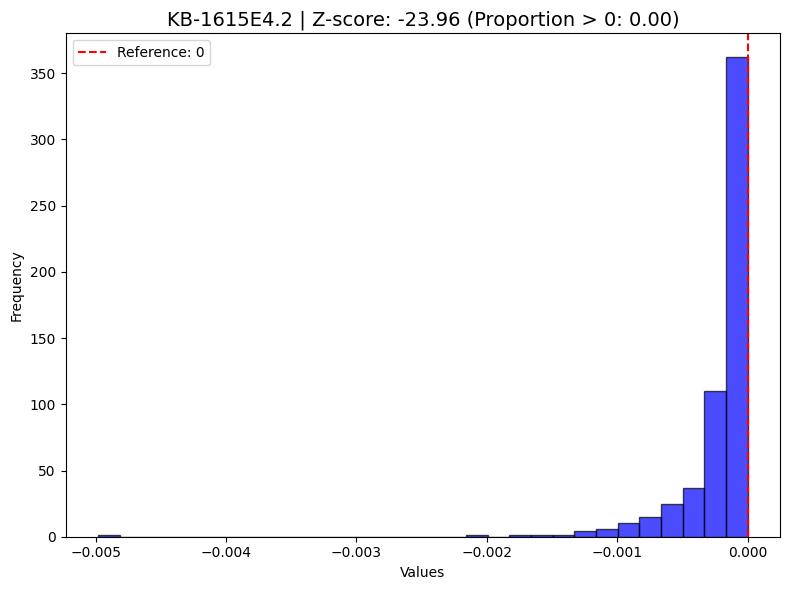

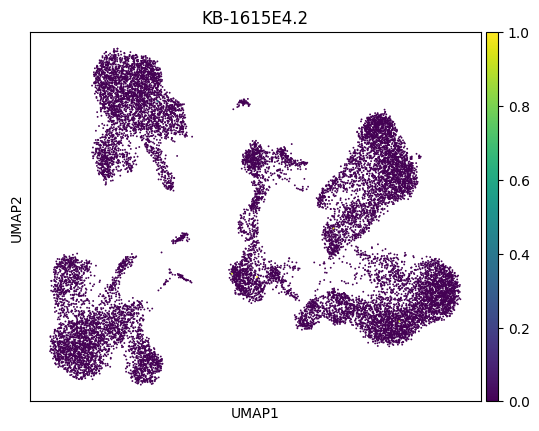

Plotting: RASL11B
adjusted p-value: 0.0


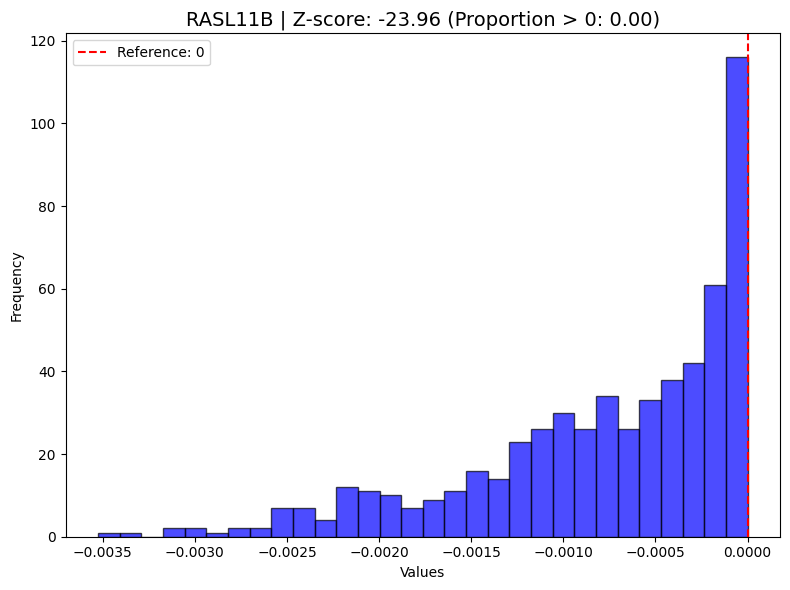

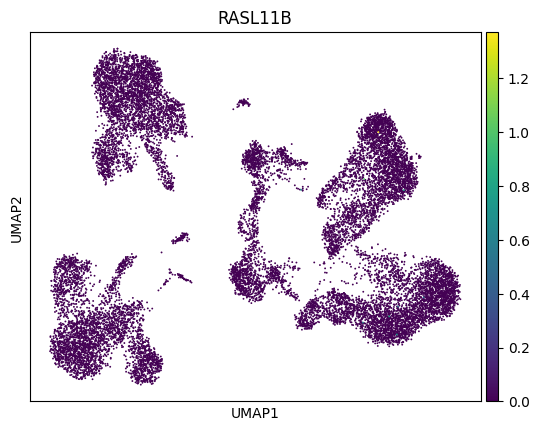

Plotting: APBB2
adjusted p-value: 0.0


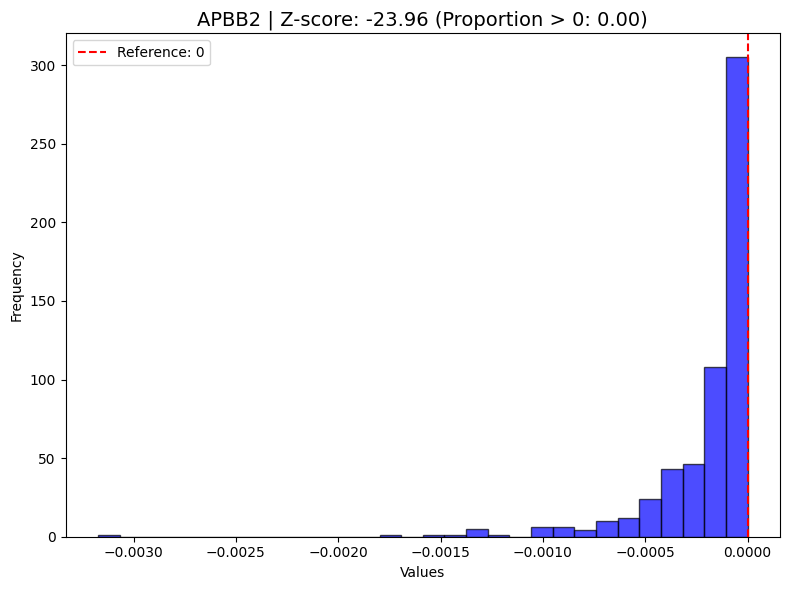

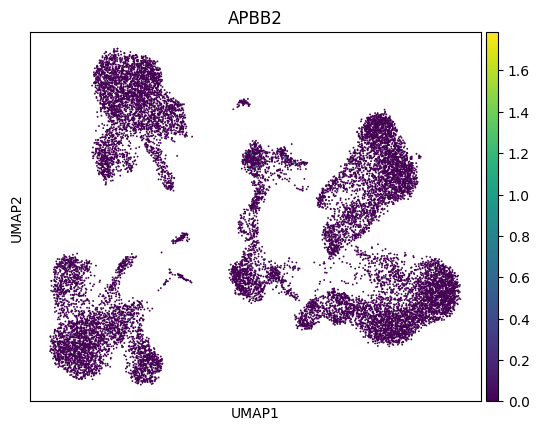

Plotting: MYBL2
adjusted p-value: 0.0


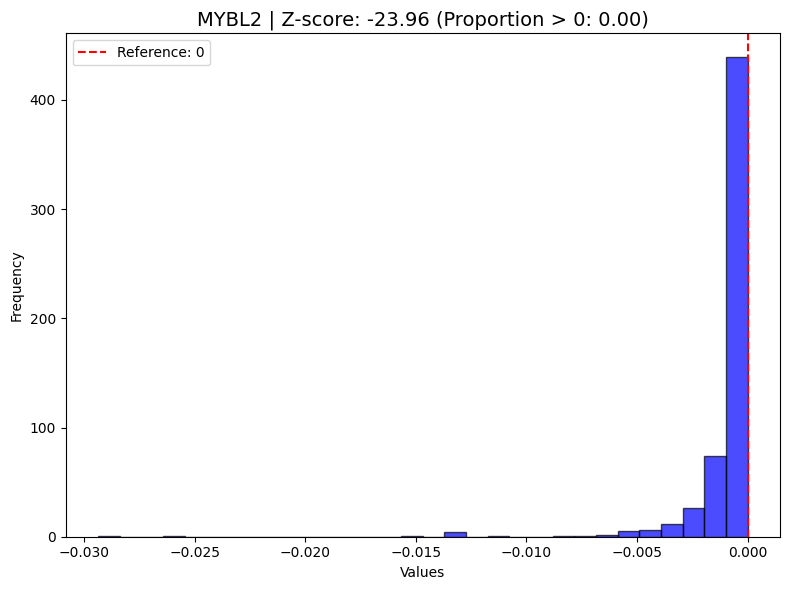

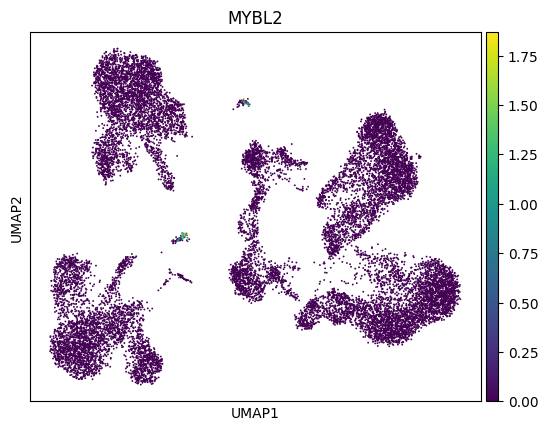

Plotting: RP4-564F22.5
adjusted p-value: 0.0


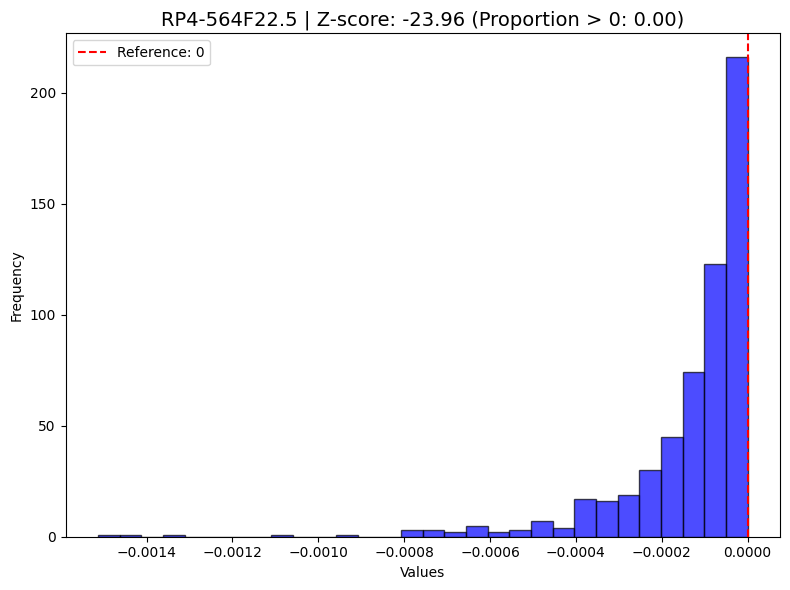

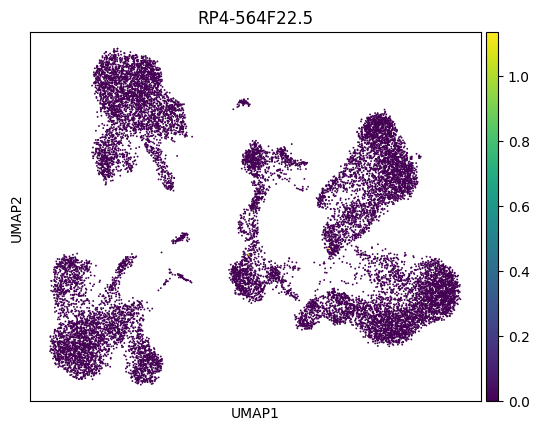

Number of genes with ITE adjusted p-values less than 0.01 637
Selected most significant genes:
     Gene     Z score  Adjusted_p
0   ISG15 -114.554690         0.0
1    NEXN  -78.924503         0.0
2  CXCL10  -72.557046         0.0
3    CCL8  -61.129399         0.0
4  IFITM3  -58.807150         0.0
Plotting: ISG15
adjusted p-value: 0.0


<Figure size 1000x600 with 0 Axes>

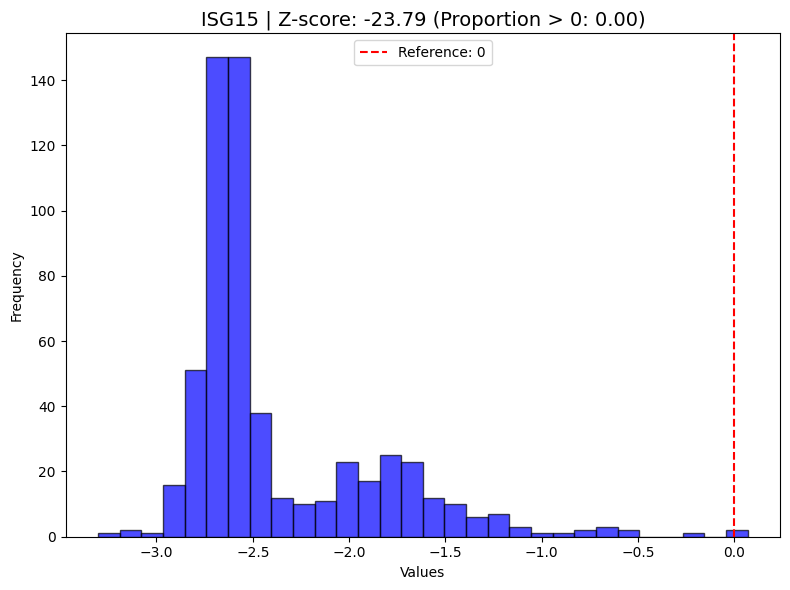

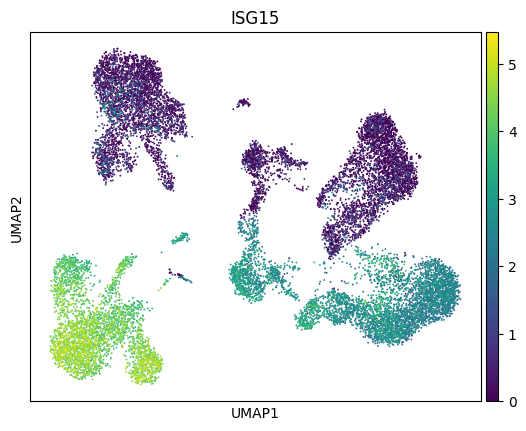

Plotting: NEXN
adjusted p-value: 0.0


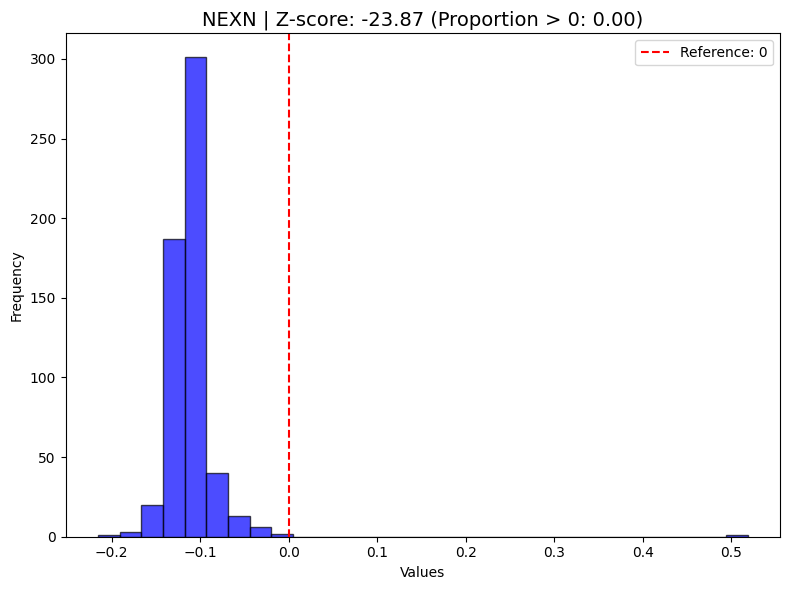

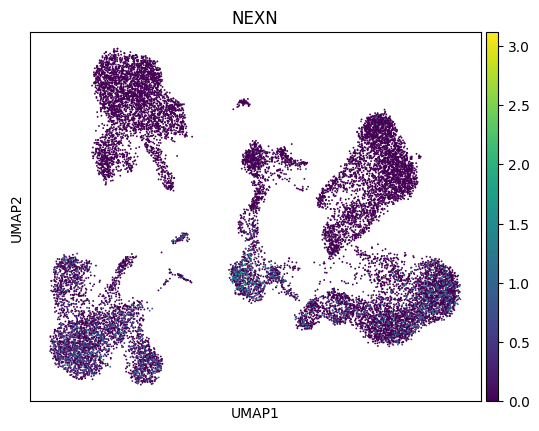

Plotting: CXCL10
adjusted p-value: 0.0


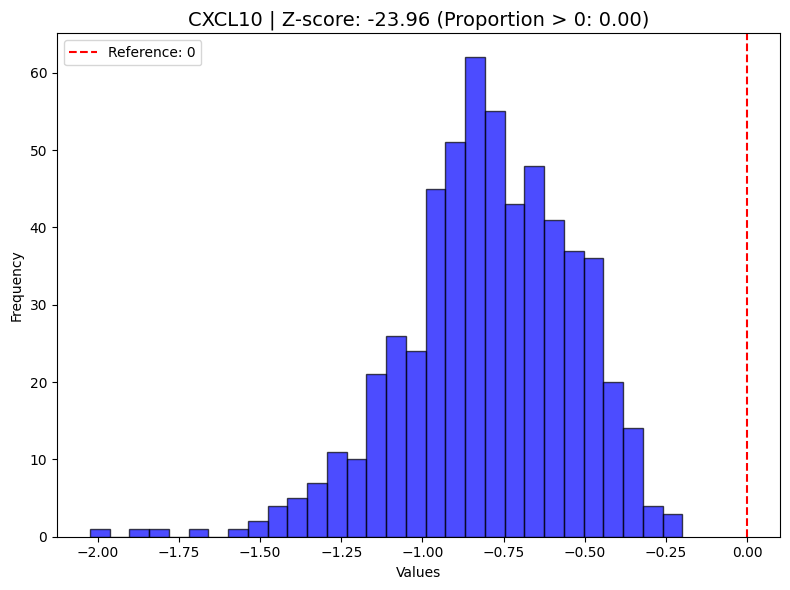

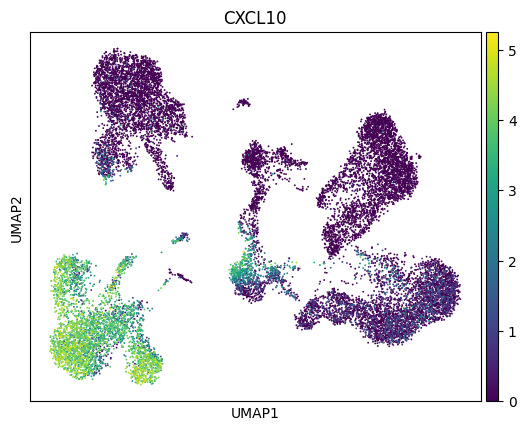

Plotting: CCL8
adjusted p-value: 0.0


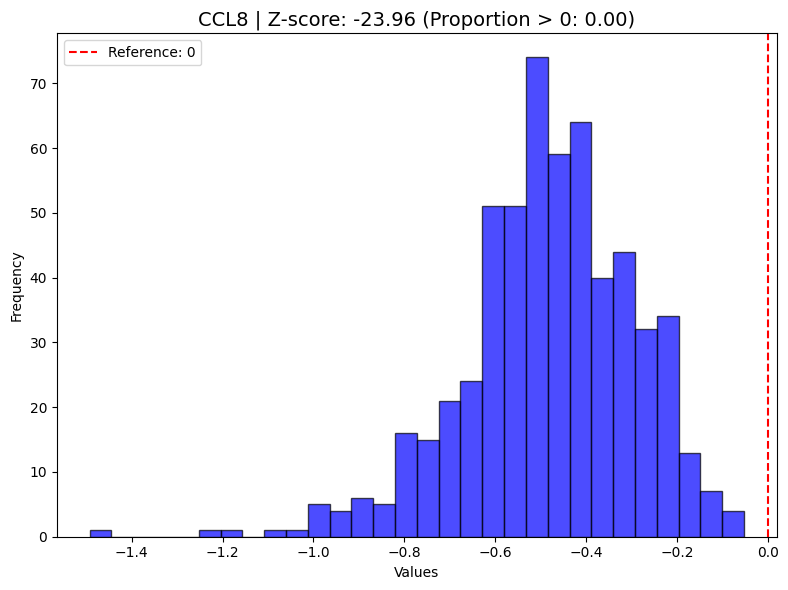

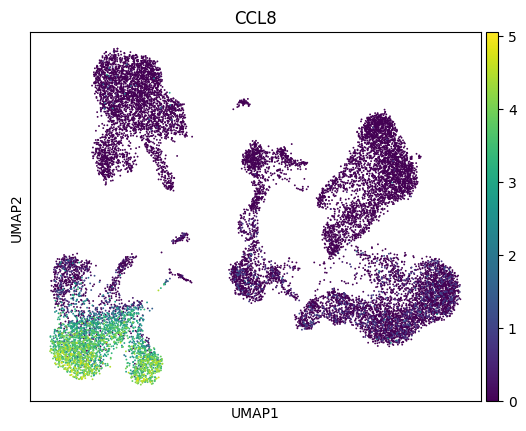

Plotting: IFITM3
adjusted p-value: 0.0


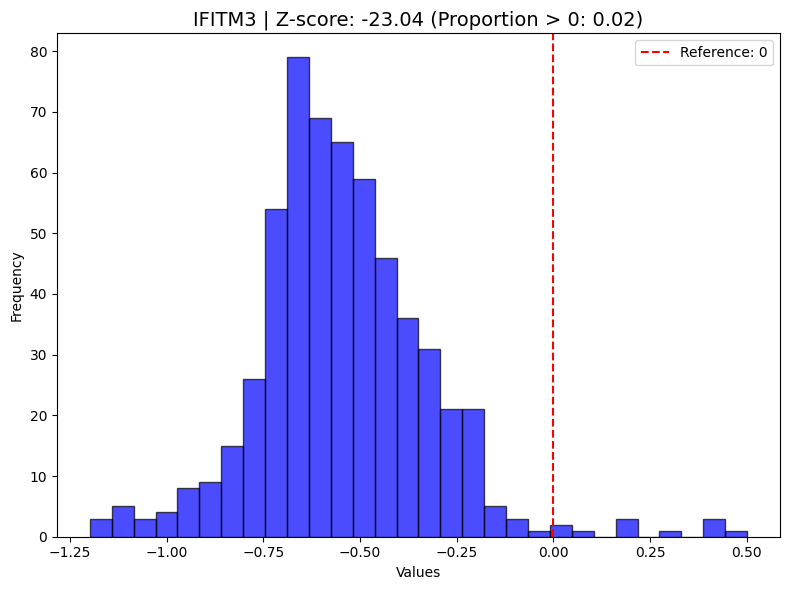

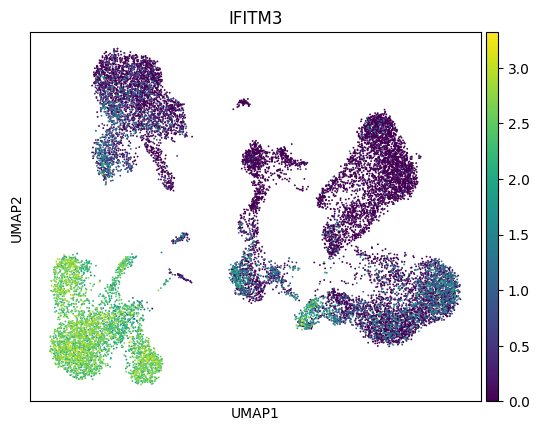

array([   0.22201692,  -10.97039262, -114.55468993, ...,    1.21600816,
        -15.18457556,   -0.30251875])

In [9]:
adata = sc.read_h5ad('../data/PBMC.h5ad')
adata.obs["condition_fake"]=np.random.permutation(adata.obs["condition"].copy())#condition_fake
ITE4=run_cinema_ot(adata=adata, condition_key="condition", cell_type_key='cell_type', exp_label='stimulated', ref_label='control', dataset_name="PBMC")
print(ITE4)
indices=ITE4.obs["cell_type"]=="CD8T"
Plot_and_Estimate_CATE_adata(ITE4,indices)

print("="*20)
Plot_and_Estimate_CATE_adata(ITE4,indices,parametric=True)

# If we use fake data

AnnData object with n_obs × n_vars = 16893 × 6998
    obs: 'condition', 'n_counts', 'n_genes', 'mt_frac', 'cell_type', 'condition_fake'
    var: 'gene_symbol', 'n_cells'
    uns: 'cell_type_colors', 'condition_colors', 'neighbors'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    obsp: 'distances', 'connectivities'
AnnData object with n_obs × n_vars = 16893 × 2000
    obs: 'condition', 'n_counts', 'n_genes', 'mt_frac', 'cell_type', 'condition_fake'
    var: 'gene_symbol', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'condition_colors', 'neighbors', 'hvg'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    obsp: 'distances', 'connectivities'
condition_fake control stimulated cell_type
Effect modifier (called confounder in this paper) space:


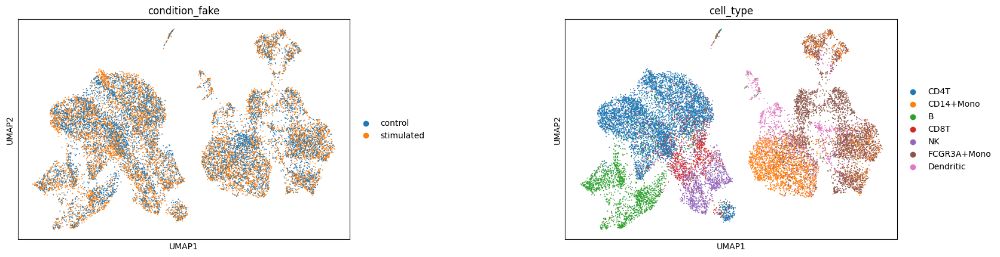

AnnData object with n_obs × n_vars = 8007 × 2000
    obs: 'condition', 'n_counts', 'n_genes', 'mt_frac', 'cell_type', 'condition_fake'
    var: 'gene_symbol', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    obsm: 'X_embedding'
Number of genes with ITE adjusted p-values less than 0.01 1977
Selected most significant genes:
             Gene    Z score  Adjusted_p
0        SERPINA9 -22.956481         0.0
1        KIAA0825 -22.956481         0.0
2    CTD-2015H6.3 -22.956481         0.0
3     RP11-79P5.9 -22.956481         0.0
4        SLC39A11 -22.956481         0.0
5       LINC00511 -22.956481         0.0
6            TNS4 -22.956481         0.0
7           ERBB2 -22.956481         0.0
8         FAM209A -22.956481         0.0
9   RP11-472G21.2 -22.956481         0.0
10        CCDC85C -22.956481         0.0
11            GSC -22.956481         0.0
12        TSPAN15 -22.956481         0.0
13          FLRT2 -22.956481         0.0
14        RPS6KL1 -22.956481     

<Figure size 1000x600 with 0 Axes>

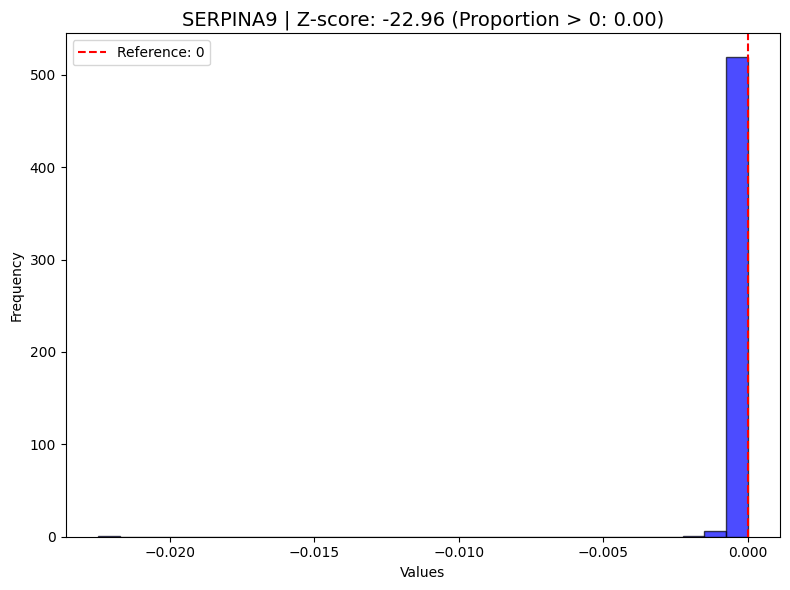

Plotting: KIAA0825
adjusted p-value: 0.0


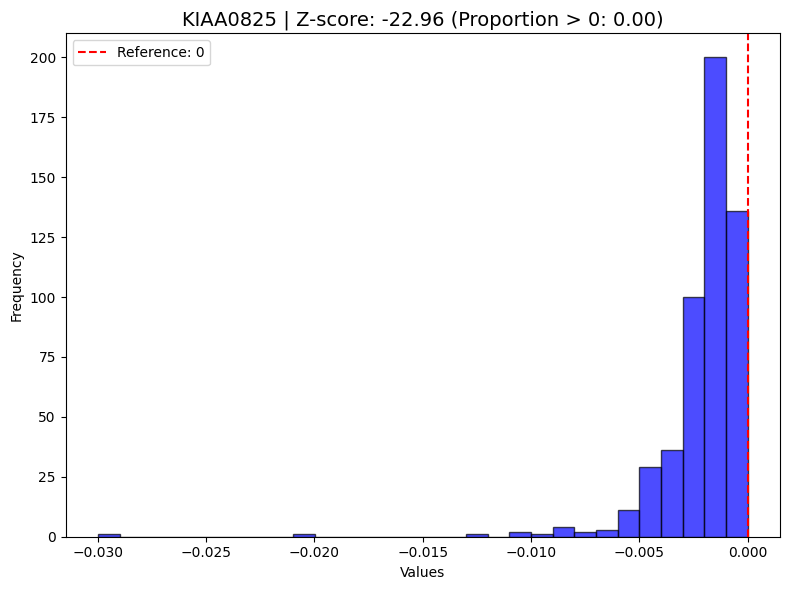

Plotting: CTD-2015H6.3
adjusted p-value: 0.0


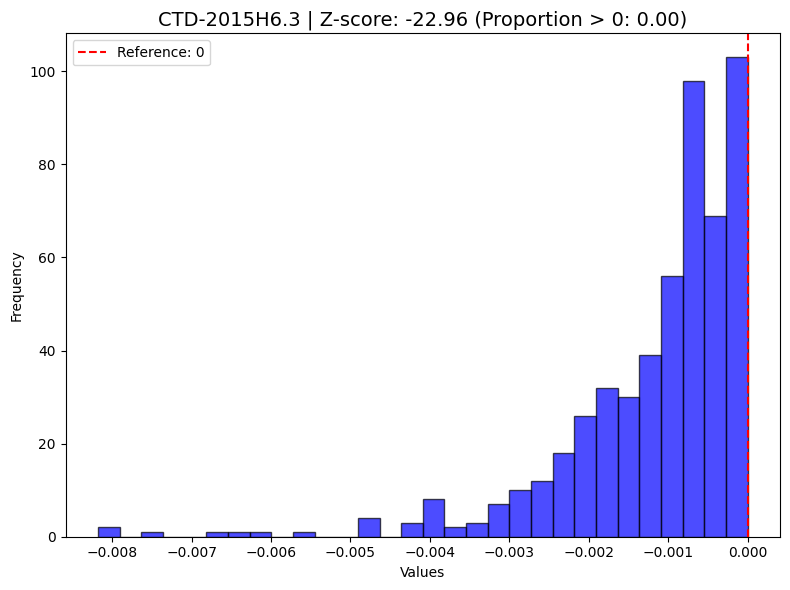

Plotting: RP11-79P5.9
adjusted p-value: 0.0


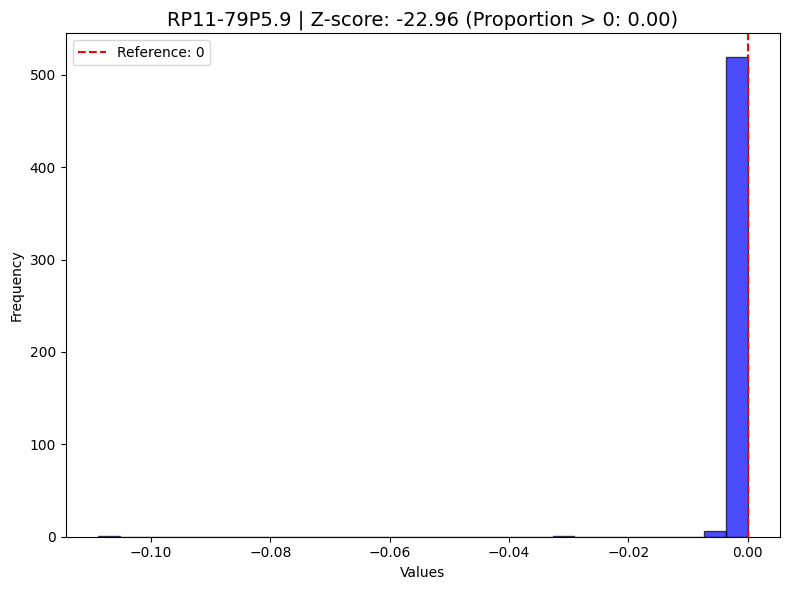

Plotting: SLC39A11
adjusted p-value: 0.0


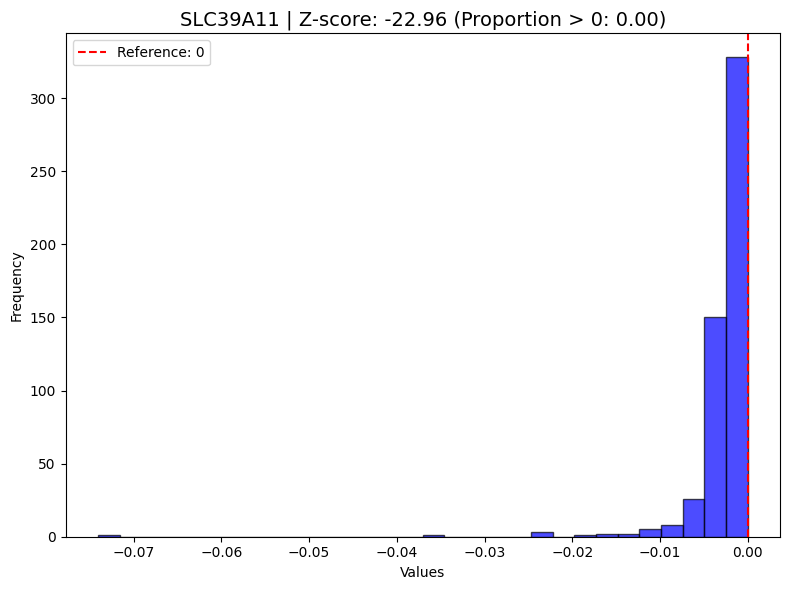

Plotting: LINC00511
adjusted p-value: 0.0


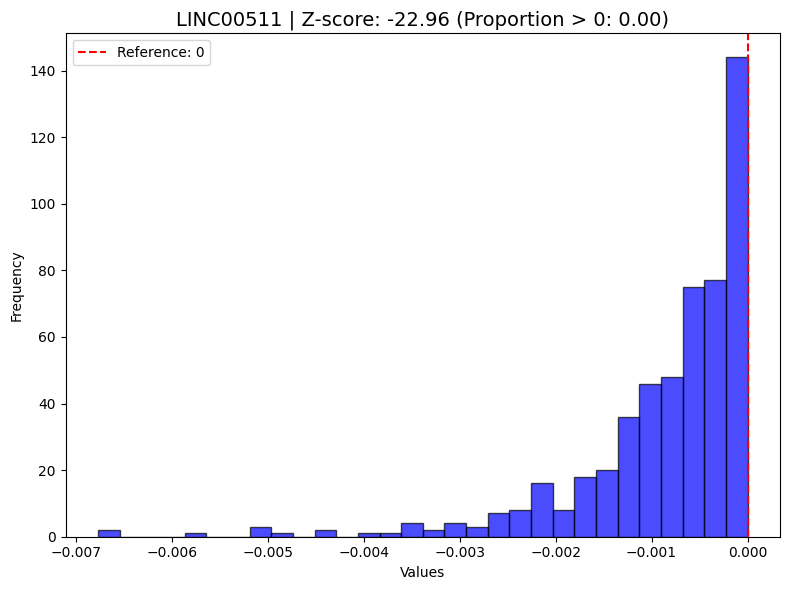

Plotting: TNS4
adjusted p-value: 0.0


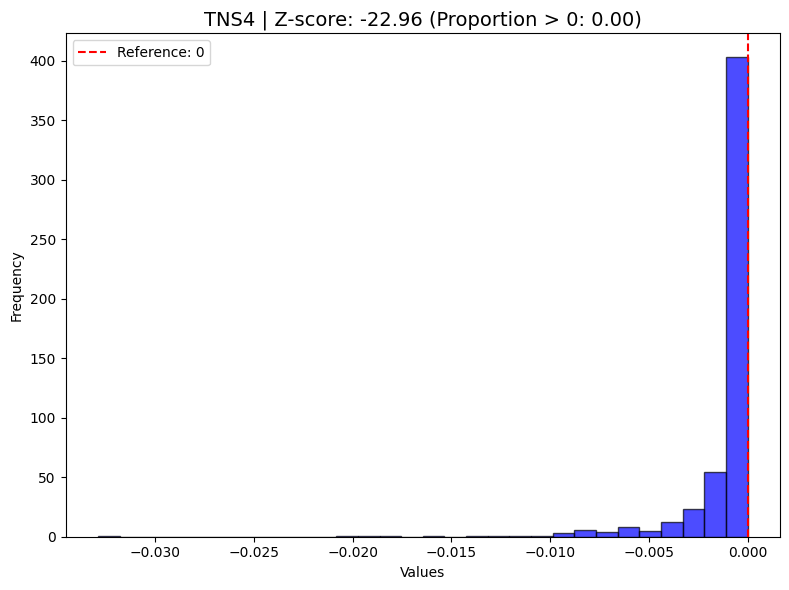

Plotting: ERBB2
adjusted p-value: 0.0


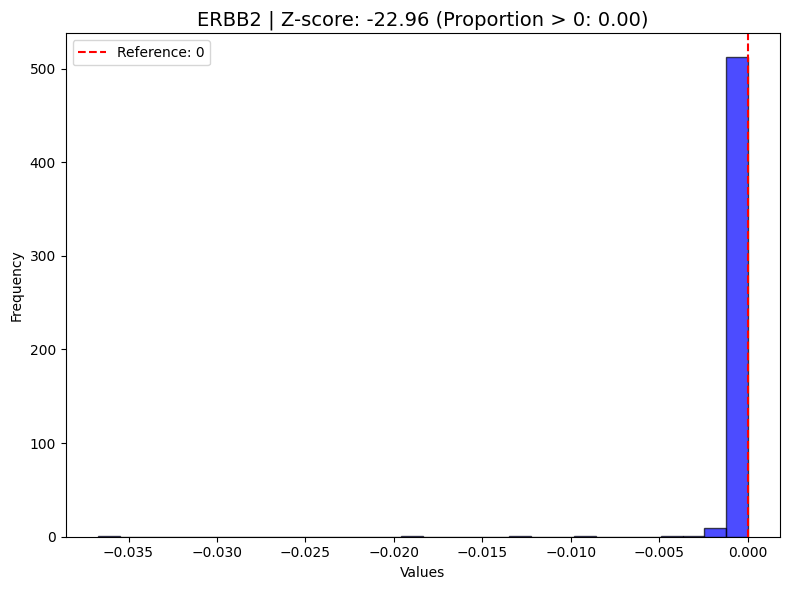

Plotting: FAM209A
adjusted p-value: 0.0


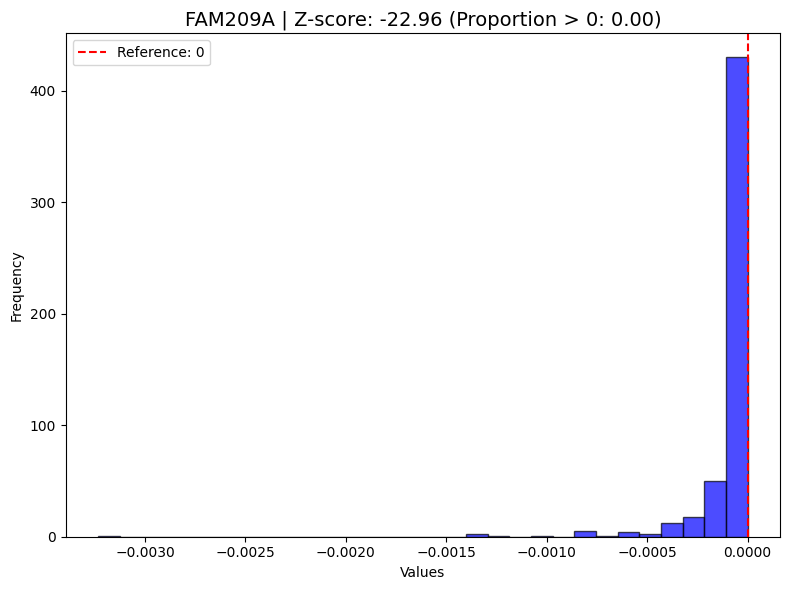

Plotting: RP11-472G21.2
adjusted p-value: 0.0


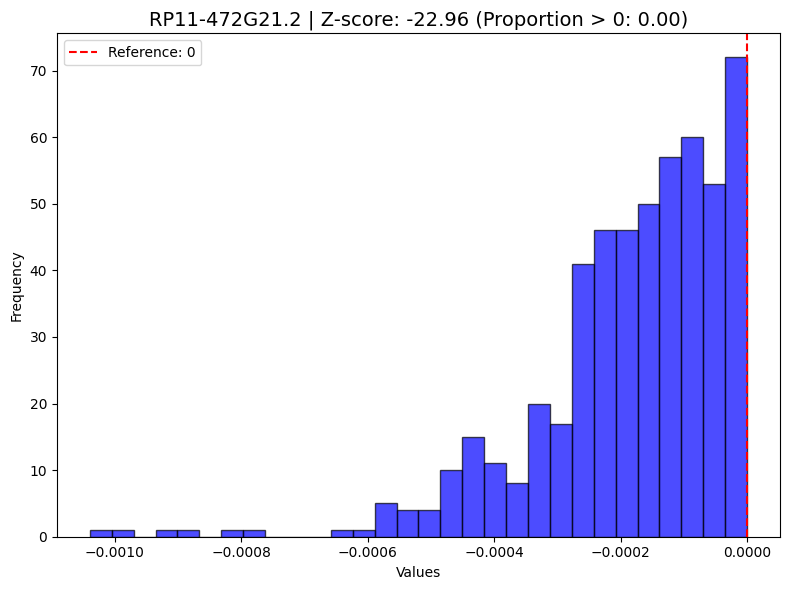

Plotting: CCDC85C
adjusted p-value: 0.0


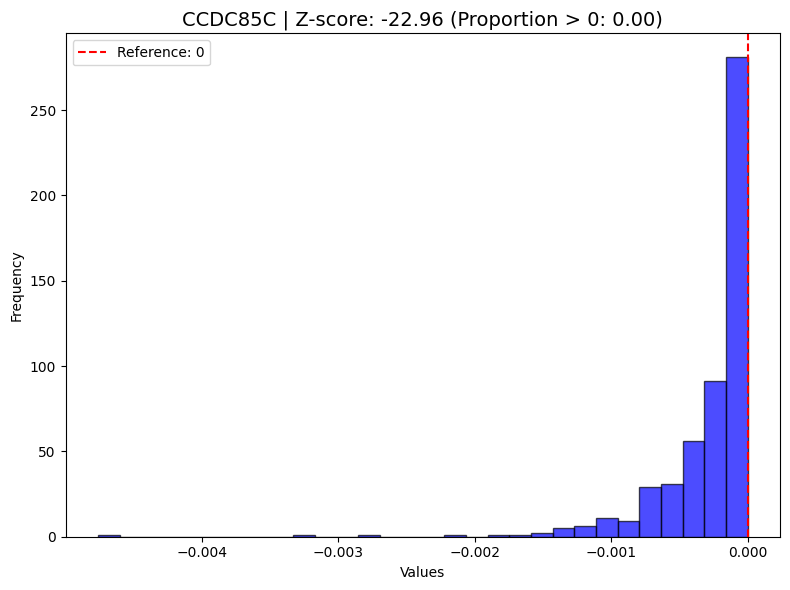

Plotting: GSC
adjusted p-value: 0.0


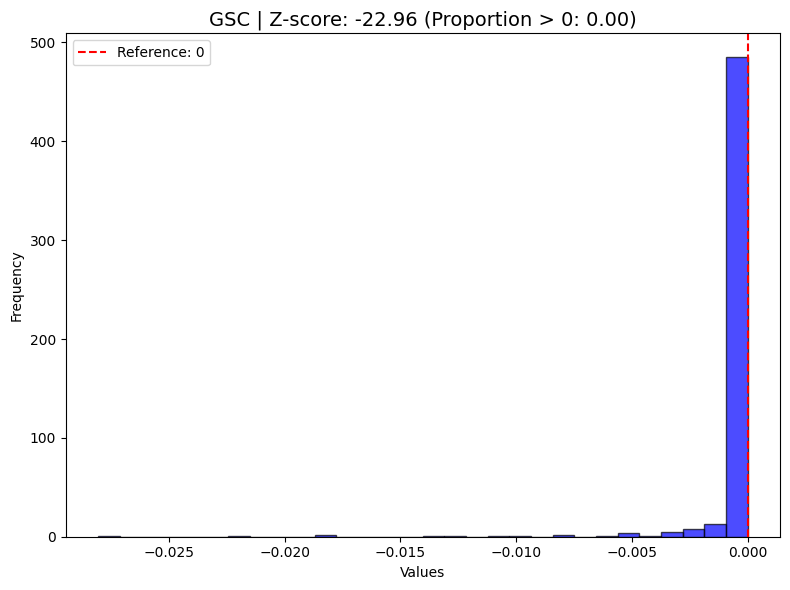

Plotting: TSPAN15
adjusted p-value: 0.0


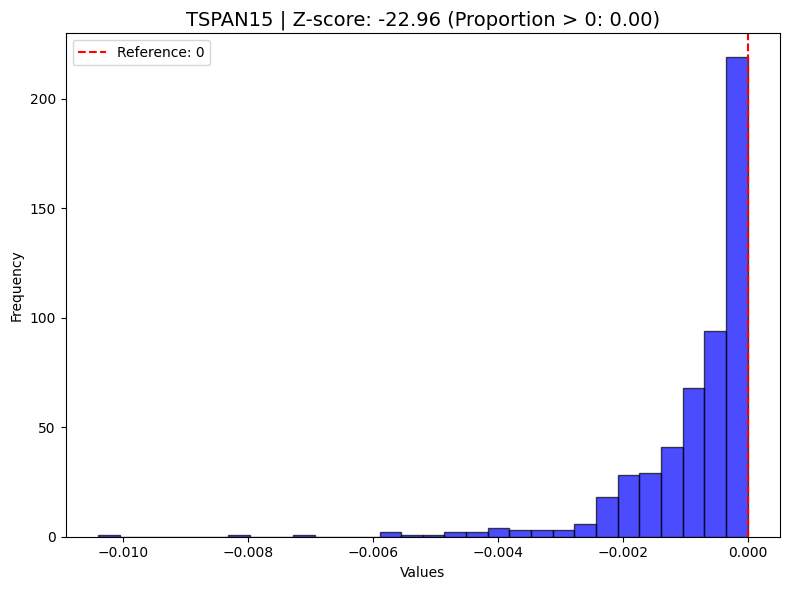

Plotting: FLRT2
adjusted p-value: 0.0


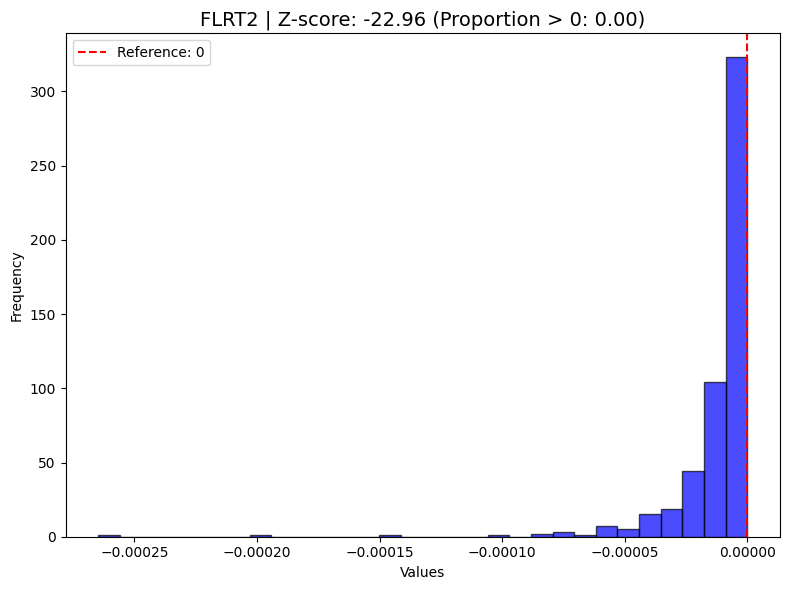

Plotting: RPS6KL1
adjusted p-value: 0.0


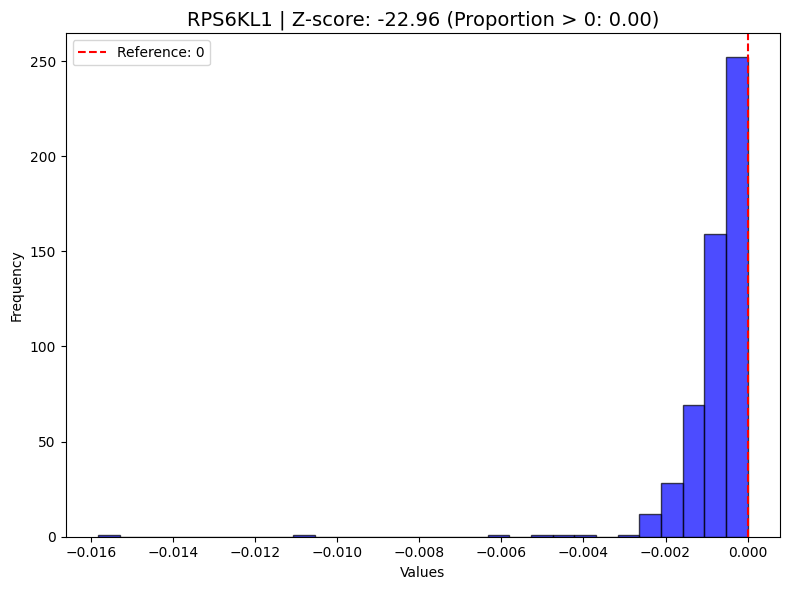

Plotting: LRRC20
adjusted p-value: 0.0


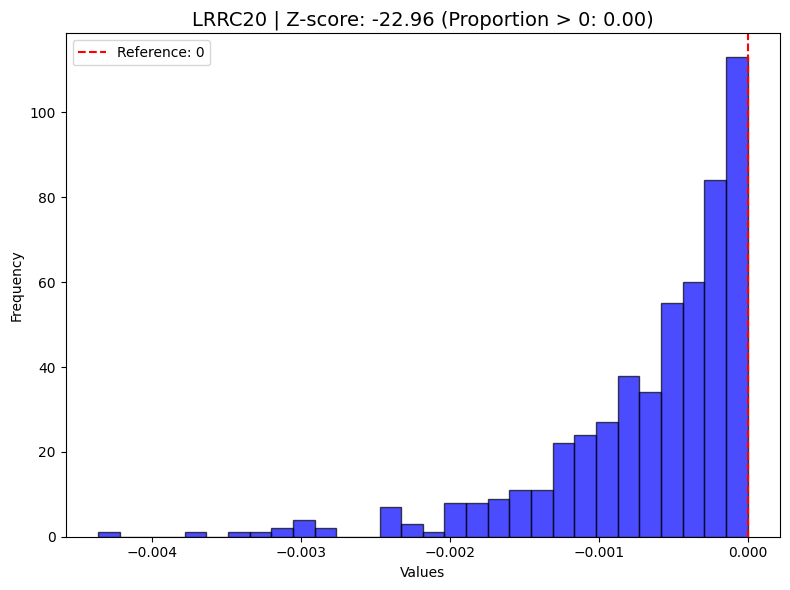

Plotting: CENPJ
adjusted p-value: 0.0


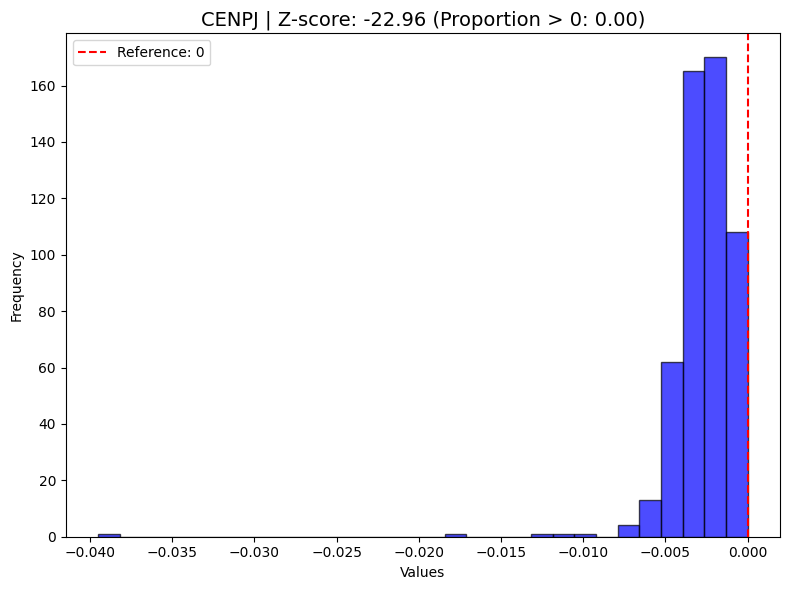

Plotting: FGF9
adjusted p-value: 0.0


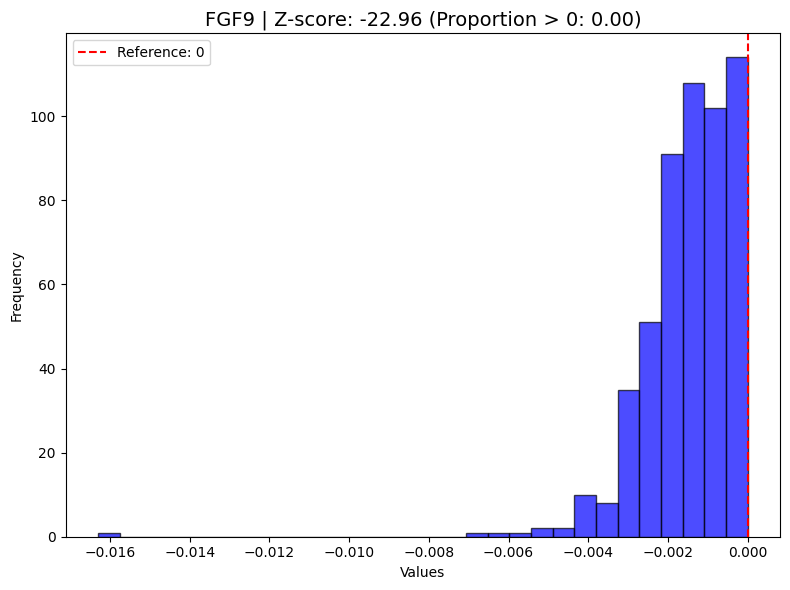

Plotting: LINC00422
adjusted p-value: 0.0


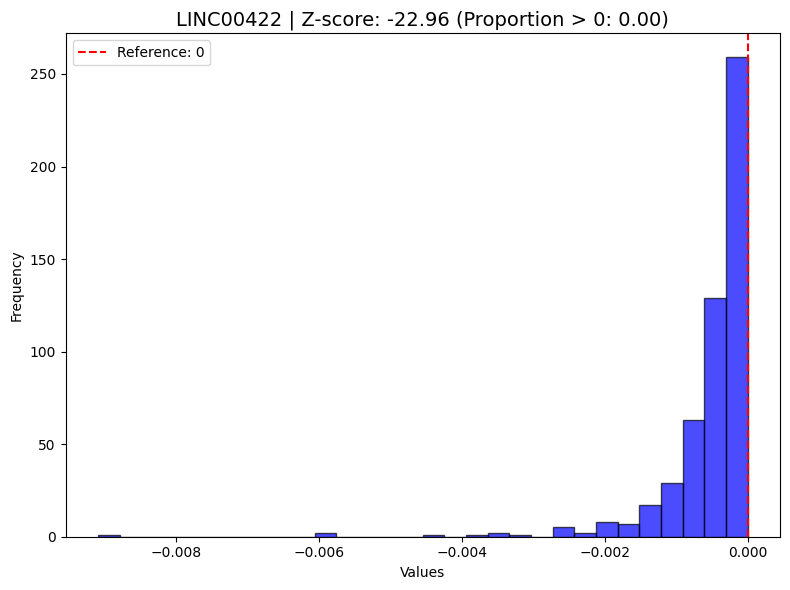

Plotting: IGFBP2
adjusted p-value: 0.0


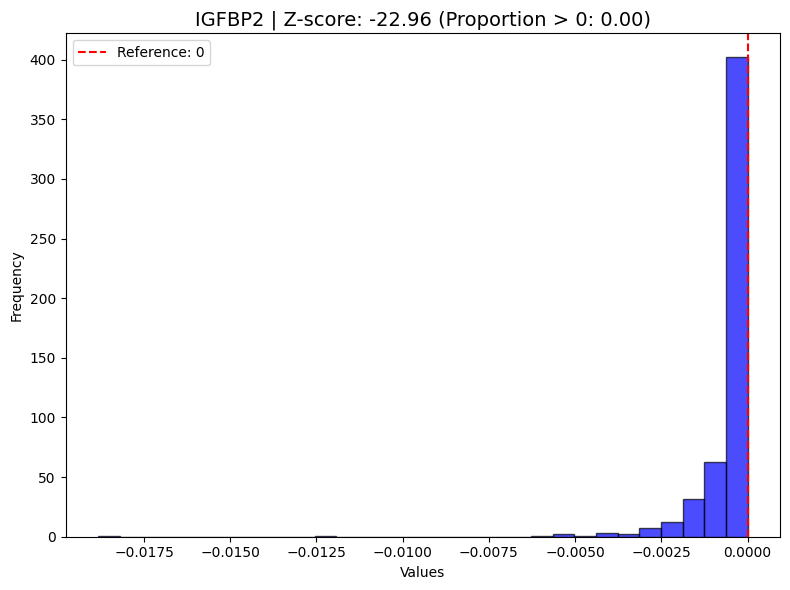

Number of genes with ITE adjusted p-values less than 0.01 458
Selected most significant genes:
        Gene    Z score  Adjusted_p
0      TPST1 -47.281717         0.0
1        CD9 -43.372060         0.0
2      CXCL3 -41.275466         0.0
3     CLEC5A -41.209881         0.0
4      ZFP64 -41.124309         0.0
5       UPF1 -39.666793         0.0
6   SERPINB2 -38.170423         0.0
7       FPR1 -36.148740         0.0
8       CLUH -35.863258         0.0
9   ARHGEF40 -35.738482         0.0
10   SLC12A2 -34.933957         0.0
11    SPINK1 -34.535807         0.0
12      IL27 -33.359286         0.0
13   MYCBPAP -33.239039         0.0
14  TMEM176A -33.162572         0.0
15      SDC2 -33.098921         0.0
16  C19orf59 -31.850124         0.0
17   S100A12 -31.652905         0.0
18     CCBL1 -31.446347         0.0
19      RPA4 -31.064049         0.0
Plotting: TPST1
adjusted p-value: 0.0


<Figure size 1000x600 with 0 Axes>

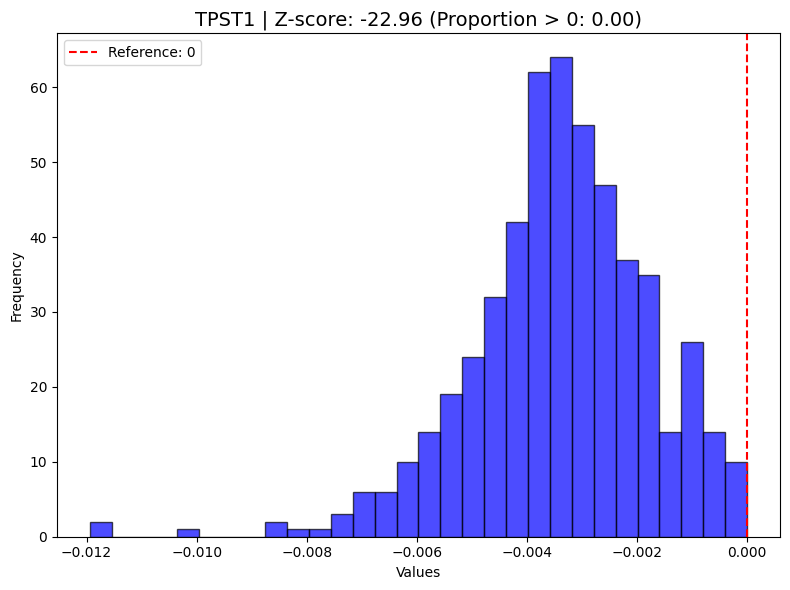

Plotting: CD9
adjusted p-value: 0.0


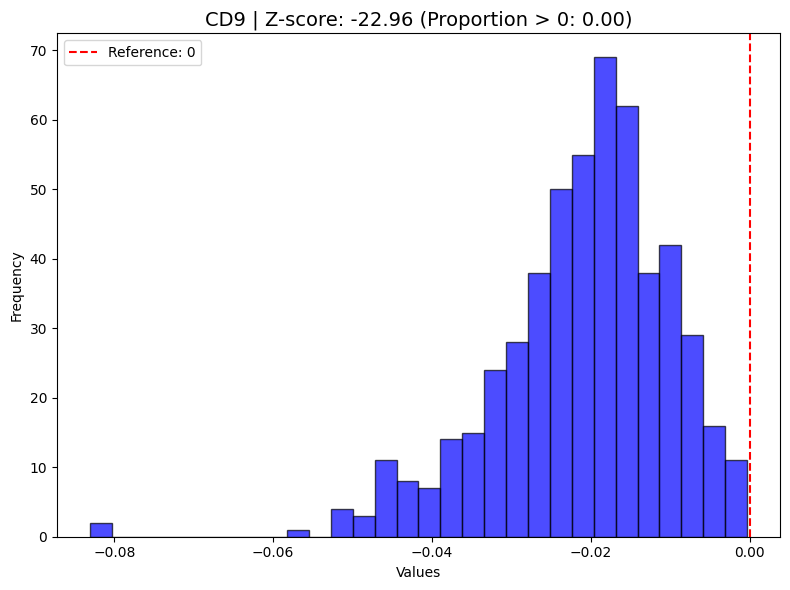

Plotting: CXCL3
adjusted p-value: 0.0


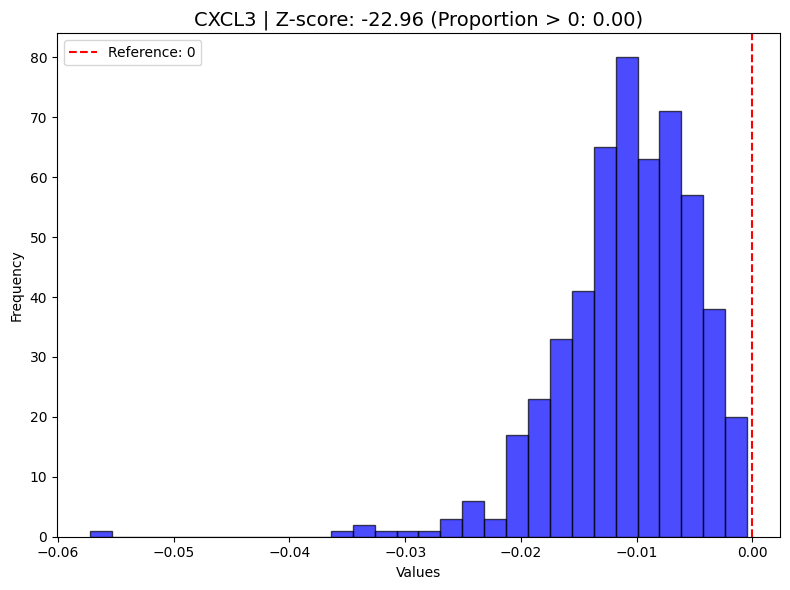

Plotting: CLEC5A
adjusted p-value: 0.0


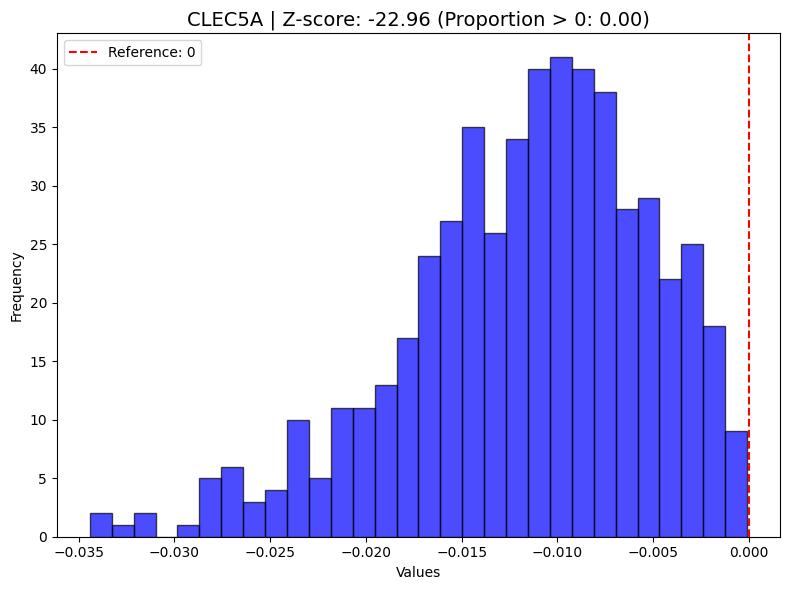

Plotting: ZFP64
adjusted p-value: 0.0


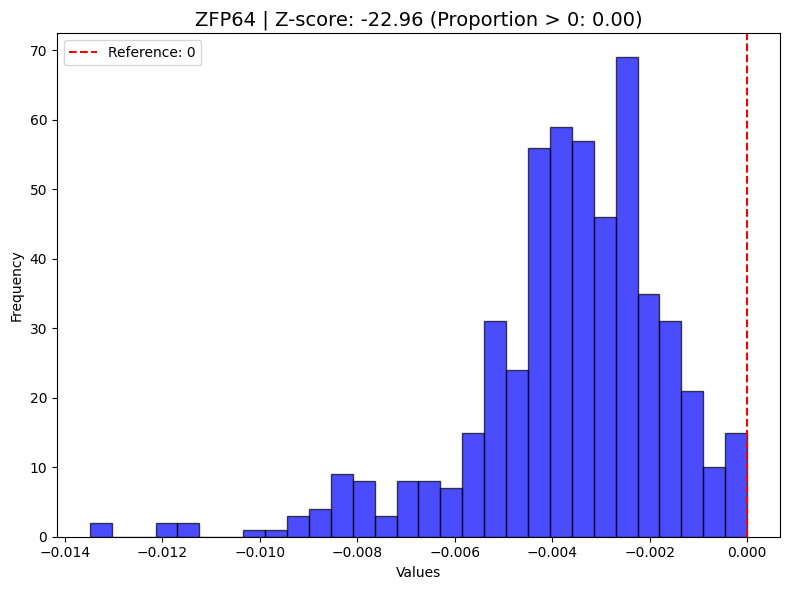

Plotting: UPF1
adjusted p-value: 0.0


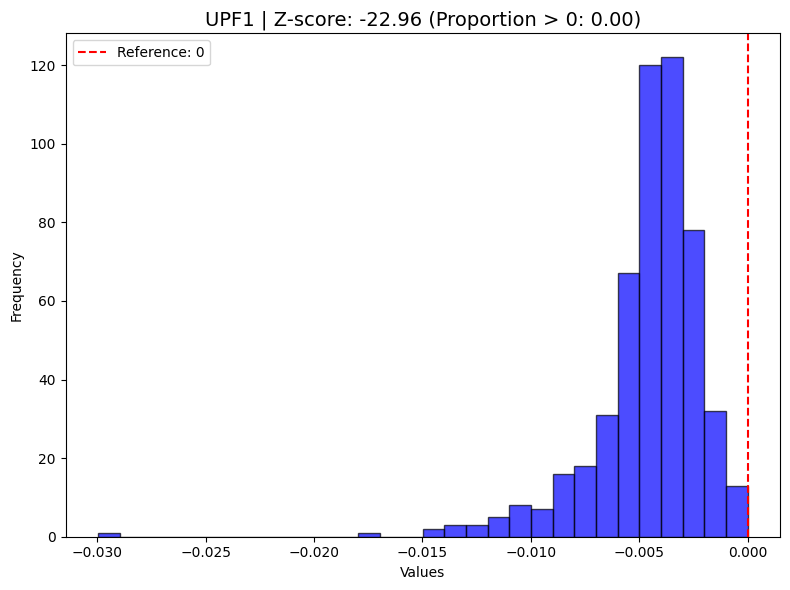

Plotting: SERPINB2
adjusted p-value: 0.0


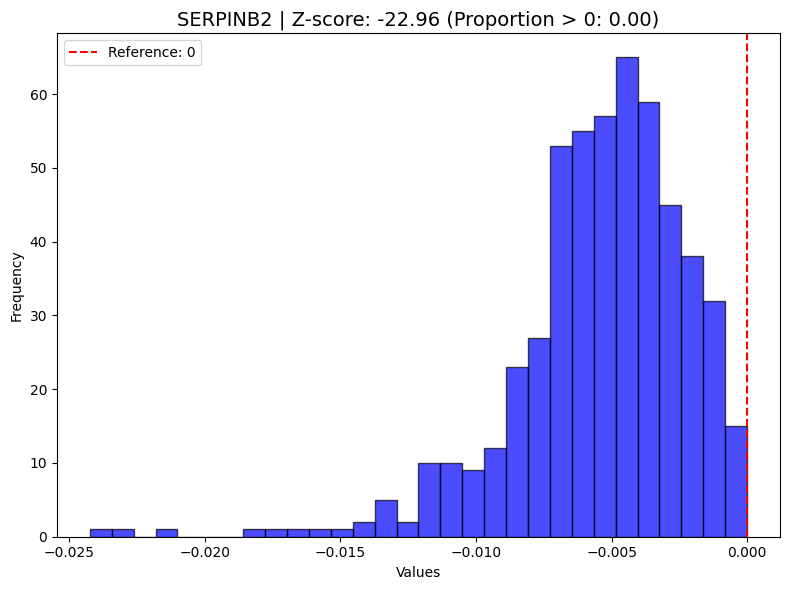

Plotting: FPR1
adjusted p-value: 0.0


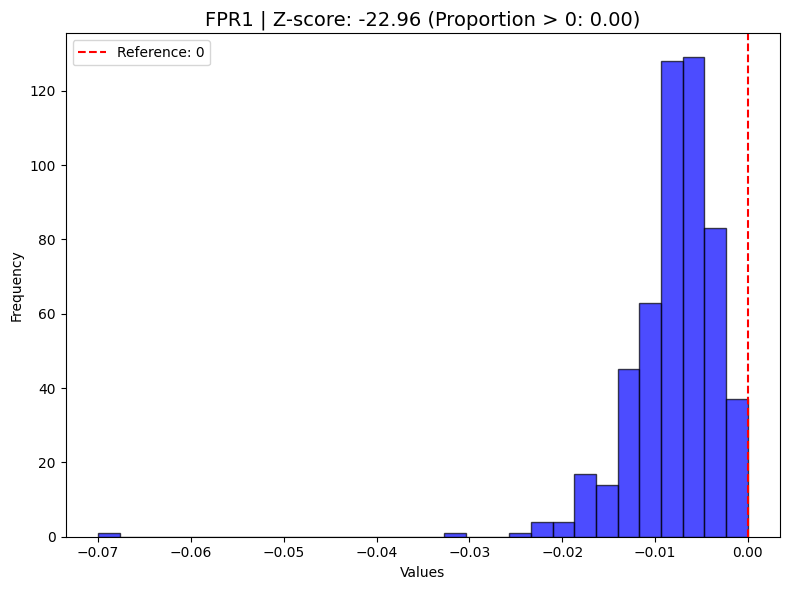

Plotting: CLUH
adjusted p-value: 0.0


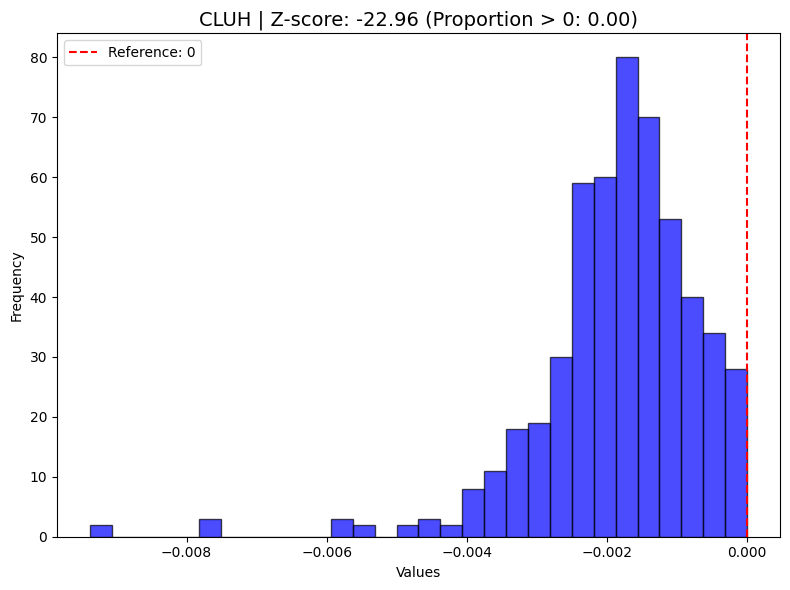

Plotting: ARHGEF40
adjusted p-value: 0.0


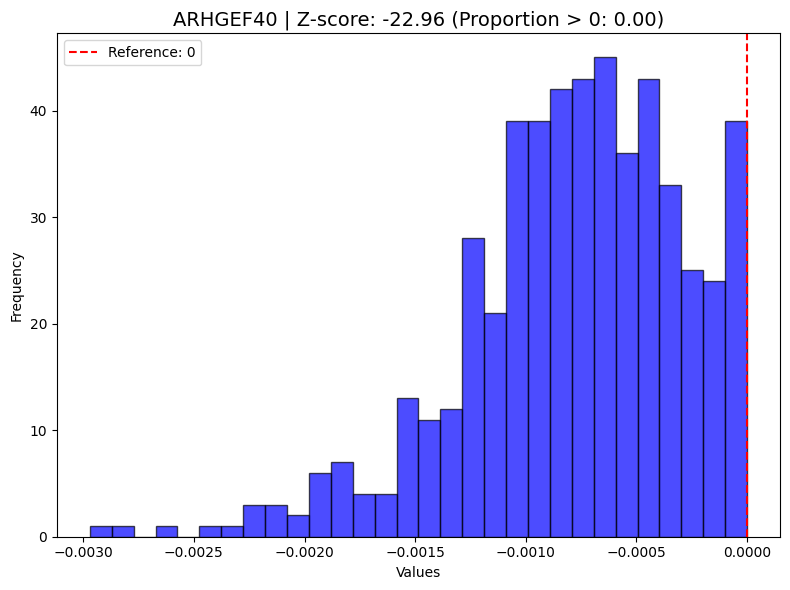

Plotting: SLC12A2
adjusted p-value: 0.0


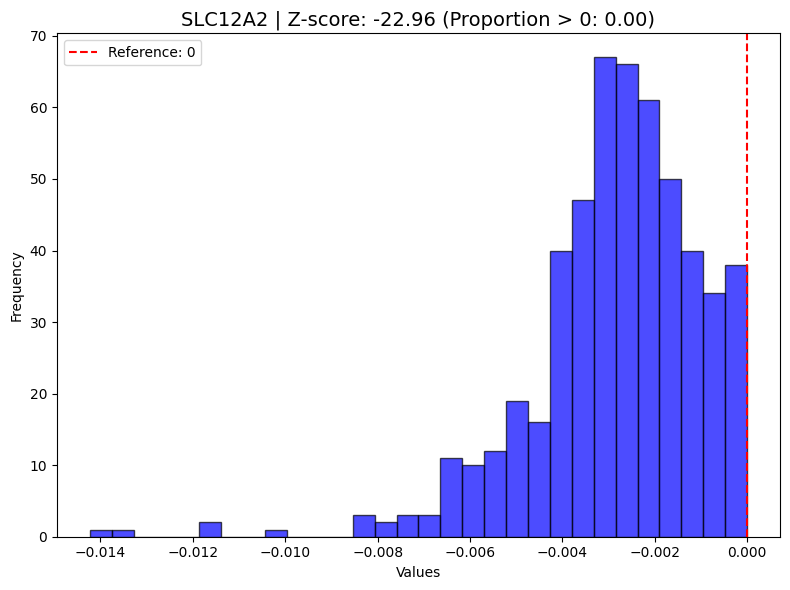

Plotting: SPINK1
adjusted p-value: 0.0


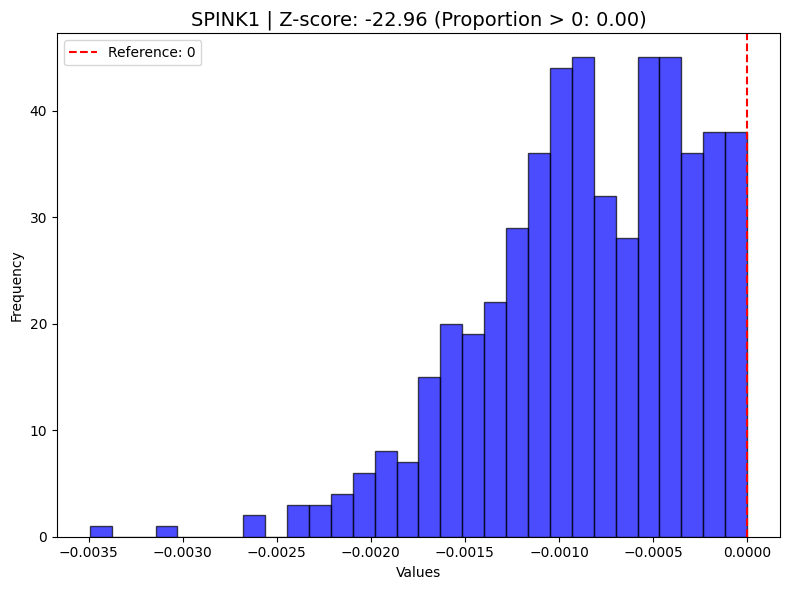

Plotting: IL27
adjusted p-value: 0.0


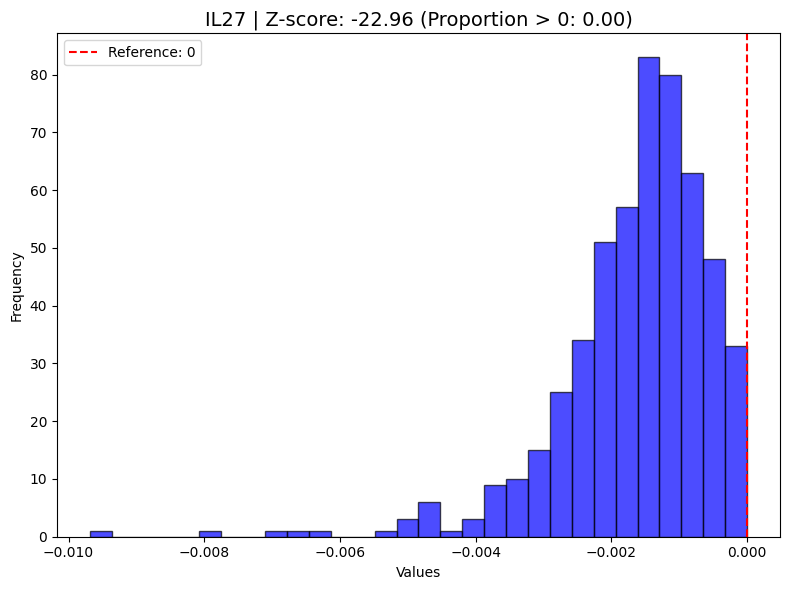

Plotting: MYCBPAP
adjusted p-value: 0.0


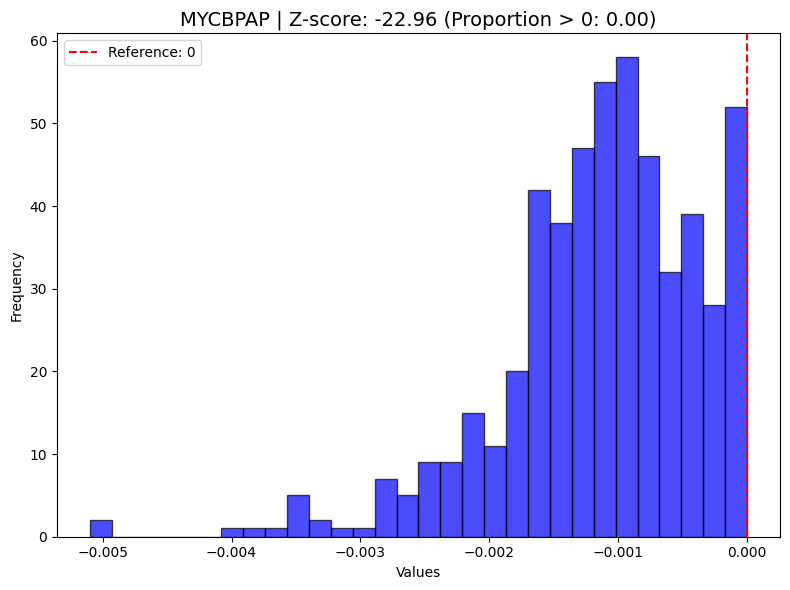

Plotting: TMEM176A
adjusted p-value: 0.0


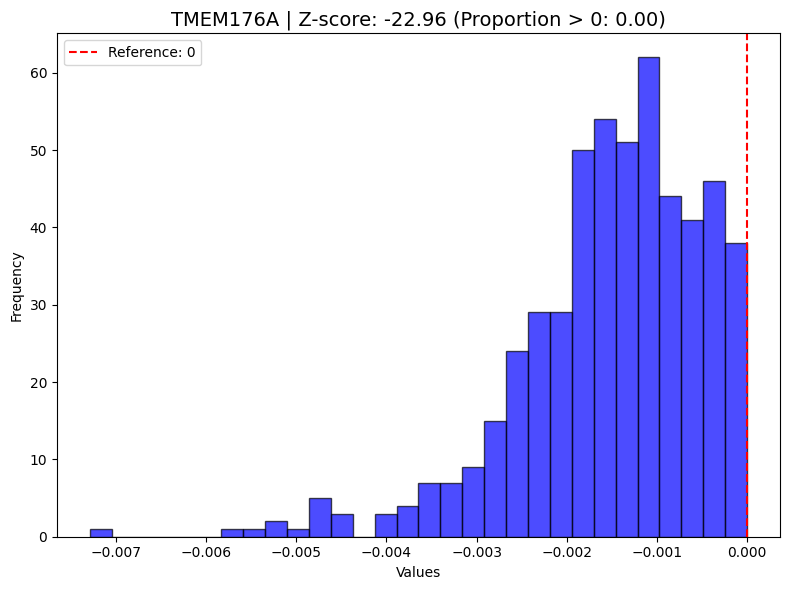

Plotting: SDC2
adjusted p-value: 0.0


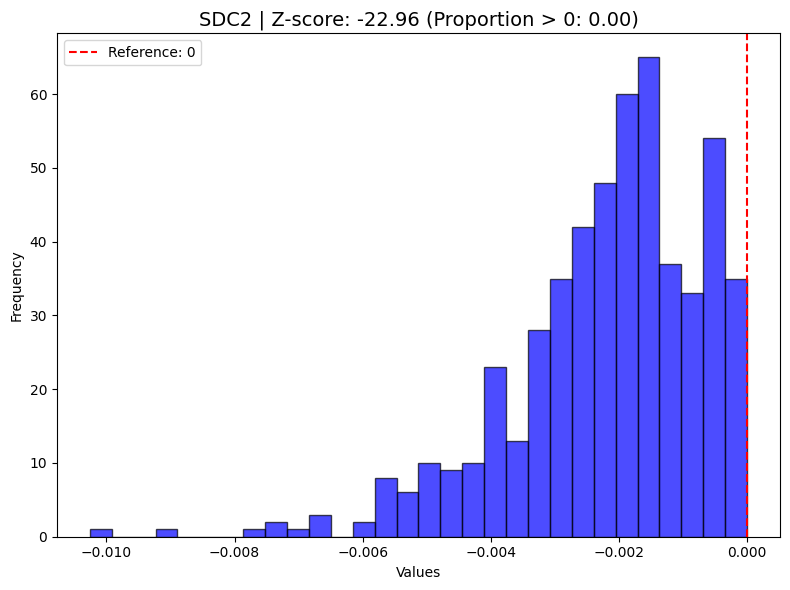

Plotting: C19orf59
adjusted p-value: 0.0


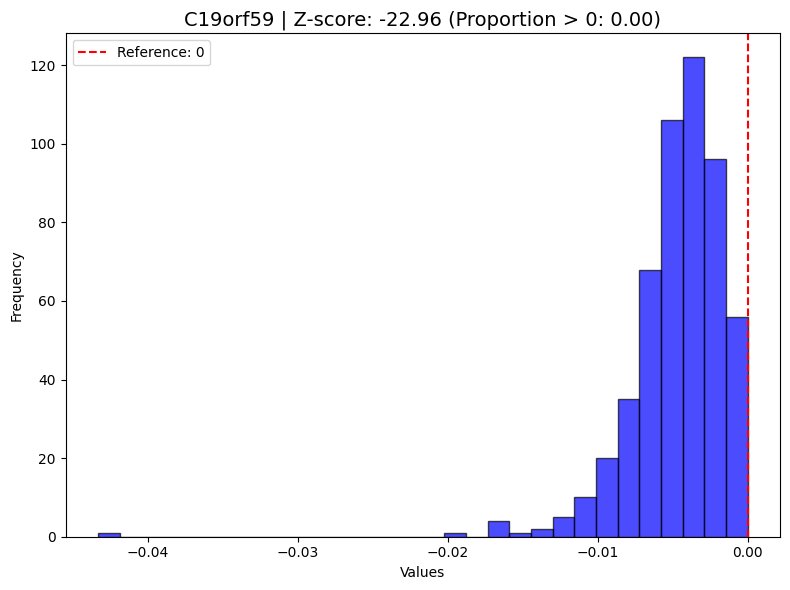

Plotting: S100A12
adjusted p-value: 0.0


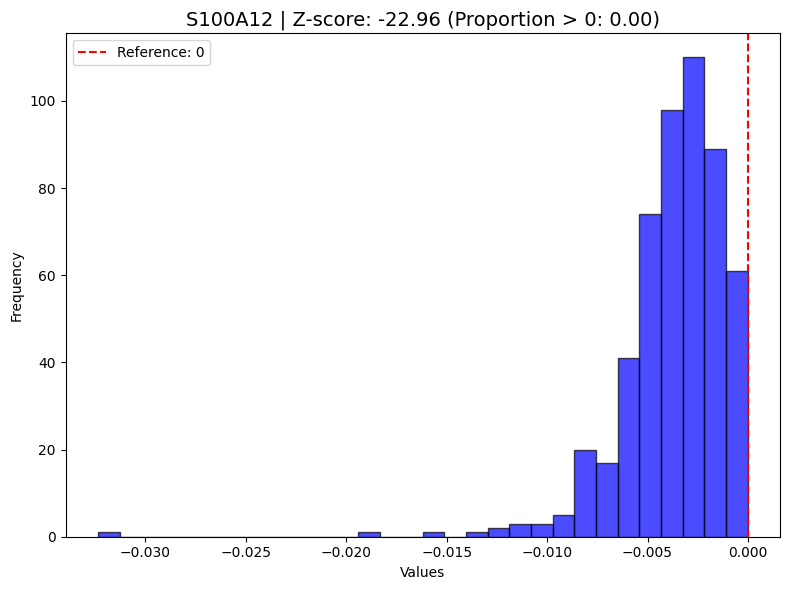

Plotting: CCBL1
adjusted p-value: 0.0


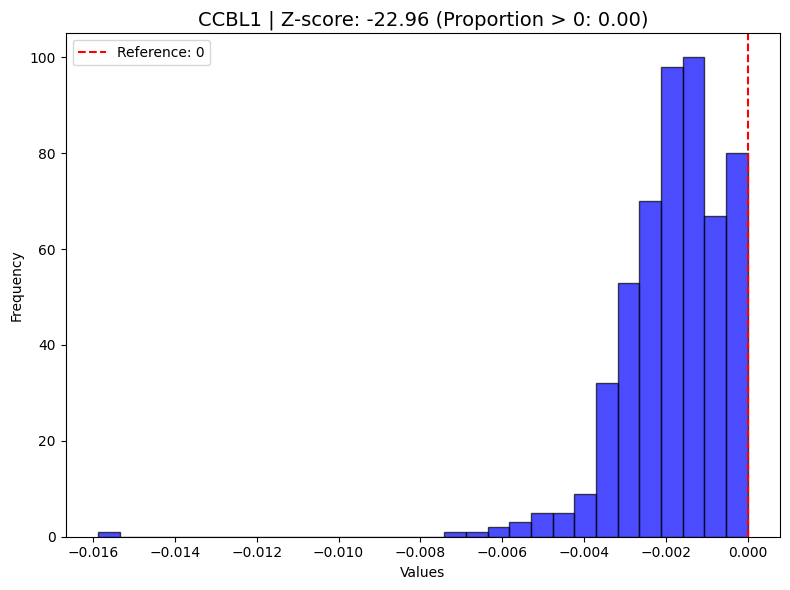

Plotting: RPA4
adjusted p-value: 0.0


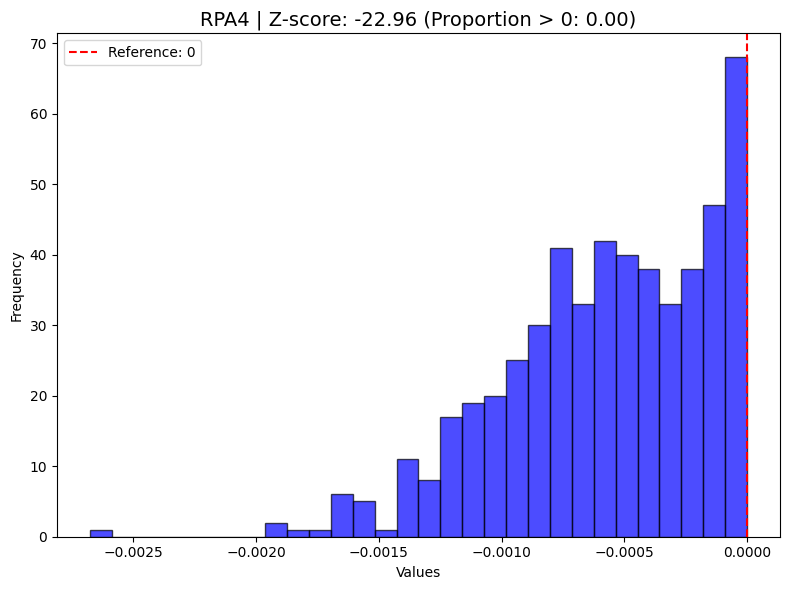

array([ -0.27131921,   2.25777414,   0.70617545, ...,   1.81140294,
       -12.05656267,  -3.22947808])

In [12]:
adata = sc.read_h5ad('../data/PBMC.h5ad')
adata.obs["condition_fake"]=np.random.permutation(adata.obs["condition"].copy())#condition_fake
ITE3=run_cinema_ot(adata=adata, condition_key="condition_fake", cell_type_key='cell_type', exp_label='stimulated', ref_label='control', dataset_name="PBMC")
print(ITE3)
indices=ITE3.obs["cell_type"]=="CD8T"
Plot_and_Estimate_CATE_adata(ITE3,indices)

print("="*20)
Plot_and_Estimate_CATE_adata(ITE3,indices,parametric=True)